### Import Packages

In [92]:
# import packages, I mostly use the same packages all the time, not all of these are usefull I suppose
import numpy as np
import matplotlib.pyplot as plt
# import scipy
import scipy.constants as const
import pandas as pd 
from scipy.optimize import curve_fit
from scipy.stats import chisquare
from scipy.signal import butter,filtfilt
from scipy.signal import savgol_filter
from itertools import islice
import imageio
import glob
# from scipy import stats
# from sklearn.neighbors import LocalOutlierFactor
# import datetime
import fabio
# import math
# import random
import os
import pyFAI
from pyFAI.azimuthalIntegrator import AzimuthalIntegrator
from sys import platform 
from os.path import exists
import meera_func as mfc
# from pytexit import py2tex
from lmfit import Model
from lmfit.lineshapes import gaussian, lorentzian
import pybroom as br

# %matplotlib widget
# # import ipywidgets as widgets



In [93]:

%matplotlib inline
plt.rcParams['figure.figsize'] = (7, 6)
plt.rcParams['figure.dpi']= 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['mathtext.fontset'] = 'stix'

In [94]:
ticksize = {'xtick': 28, 'ytick' : 28}
labelsize = {'xlabel': 30, 'ylabel' : 30}
legend_size = 28
title_size = 28
text_caption_size = 36
lbl_ln_fnt_sze = 22
marker_size = 12

## Import data

In [95]:
#import data
#path = '/Users/meera94/Desktop/LCLS MEC LX99' # Main XRD data folder
#path = '/Users/meera94/Library/CloudStorage/OneDrive-UniversityofCalifornia,Davis/LX99'
path ='/Volumes/T7/LX99'
data_files = 'scratch'
#data_files = 'scratch'
#xrd_data_folder_name = 'Raw_data_LX99'                   # Name of folder containing XRD run folders
xrd_data_folder_name = 'run'
calibration_folder_name = 'XRD_calibration_files'   # Name of folder containing calibration (.poni) files
energy_file_name = 'Energies.csv'
results_save_dir = '/Users/meera94/Library/CloudStorage/OneDrive-UniversityofCalifornia,Davis/LX99/Results/Analysis_fit_results'

##importing 
#fit_params_file = '/Users/meera94/Library/CloudStorage/OneDrive-UniversityofCalifornia,Davis/LX99/Results/Peakfit_boundsnguess.xlsx'
#fit_params_file = '/Users/meera94/Desktop/LCLS MEC LX99/Peakfit_boundsnguess.xlsx'
# fit_params_file = '/Users/meera94/Desktop/LCLS MEC LX99/Full_four_peak_fit.xlsx'

In [96]:
#Read energies in KeV
if platform == "linux" or platform == "linux2":
    concat_4 = "{0}/{1}/{2}/{3}"
    concat_3 = "{0}/{1}/{2}"
    concat_2 = "{0}/{1}" ### this is to precudurally generate a path for your platform type (i.e linux in this line) to your directory. I would never use something so uneccesarily complicated cos I am not a CS major. What a fucking pain
elif platform == "darwin": # apparently darwin is mac. 
    concat_4 = "{0}/{1}/{2}/{3}"
    concat_3 = "{0}/{1}/{2}"
    concat_2 = "{0}/{1}"
elif platform == "win64":
    concat_4 = "{0}\\{1}\\{2}\\{3}"
    concat_3 = "{0}\\{1}\\{2}"
    concat_2 = "{0}\\{1}"
else:
    concat_4 = "{0}\\{1}\\{2}\\{3}"
    concat_3 = "{0}\\{1}\\{2}"
    concat_2 = "{0}\\{1}"

## Open and store runs

In [97]:
## opening runs from tiff files tand saving them to a dictionary. We will rotate the images as required by the detector
#Runs = [140, 143, 146]#, 149, 152, 157, 160, 163, 166, 169, 173, 176, 182, 185, 179, 237, 240, 243, 249, 252, 255, 260, 263, 270, 273, 276, 282, 285, 288, 291, 294, 297, 300, 305, 311, 313, 316, 319, 327, 330, 336, 333, 339] 
#Runs = [139, 140, 142, 143, 145, 146, 148, 149, 151, 152, 157, 159, 160, 162, 163, 165, 166, 168, 169, 172, 173, 175, 176, 178, 181, 182, 184, 185, 179, 234, 237, 239, 240, 242, 243, 248, 249, 251, 252, 254, 255, 259, 260, 262, 263, 269, 270, 272, 273, 275, 276, 281, 282, 284, 284, 285, 287, 288, 290, 291, 293, 294, 296, 297, 299, 300, 302, 304, 305, 307, 310, 311, 312, 313, 315, 316, 318, 319, 326, 327, 329,  330, 335,  336, 332, 333, 338, 339] 
# Runs =     [ 140, 144, 153, 158, 147, 141, 150, 161, 164]
# time_delay = [0,  0.5,  2.3, 2.3, 3.3,  4,  6.7, 24, 104]
#, 141, 144, 147, 150, 153, 158, 161, 164, 419, 446, 460, 600, 612, 615] # what is wrong with 150?
# Runs =      [140,  416, 419, 422, 425, 428, 431, 437, 434 ]
# time_delay = [0,    2,   3,   4,   5,   6,   7,   9,   34 ]
# # Runs = [ 446, 600, 612, 615, 606, 609, 603]
# Runs =       [166, 167,  256, 174, 180, 261, 183, 264,  274, 271, 253,  277]
# time_delay = [0,   0.5,  2.7, 3.3, 4.3, 4.7, 5,  5.7,  6.2, 6.7, 25,   123.4]

# Runs =       [374, 386, 375,  389, 383, 393]
# time_delay = [ 0,   1,   2,    3,   4,   24]

# Runs =       [360, 406, 361, 366, 369, 372]
# time_delay = [0,   1,   2,   2.2, 3.2, 6.2]

# Runs =       [324, 309, 314,  322, 325, 328, 340, 331, 317, 334, 337]
# time_delay = [0,   2.2, 2.6,  3.6, 4.6, 5.6, 5.6, 6.6, 7.6, 25, 123.4]


# Runs =       [465, 491, 506, 494, 497, 500, 503]
# time_delay = [ 0, -0.5,  2,   4,  9,   27,  127]



# Runs =       [510,  512, 515, 518, 521, 527, 524]
# time_delay = [0,   -0.5,  4,   9,   27,  44, 127]

# Runs =      [459, 144,  416, 446, 606, 594, 612, 603, 443, 609, 600, 615, 460 ]
# Pressures = [0,   40,   60,  65,   60,  65,  75,  85,  90, 100, 105, 115, 190 ]

# Runs =       [459, 470, 460, 467,  473,   482, 476, 479]
# time_delay = [  0, 4.5, 5.5, 6.5,  10.5, 15.5, 33,  133]

# Runs =       [459, 167,  375, 409, 582,  570, 400, 579,   591, 406,  585, 576, 588, 491]
# Pressures =  [0,   40,   55,   60,  60,  65,  70,  75,    83,  90,   90,  110, 115, 190]


Runs =       [510, 309,  635, 639, 618, 632, 621, 627, 624, 629, 512]
Pressures =  [0,    40,  60,  65,  65, 75,   83,  90, 110, 115, 190]

# Runs =       [459, 470,  460, 467, 473, 482, 476, 479 ] 
# time_delay = [ 0, -1.5, -0.5, 0.5, 4.5, 9.5,  27, 127 ]

# Runs =       [374, 167, 375, 409,  400, 403, 406]
# pressures = [ 0,   40, 60,  65,   70,  70,  90]


# Runs =       [166, 167,  256, 174, 180, 261, 183, 264, 253, 277]
# time_delay = [0,   0.5,  2.7, 3.3, 4.3, 4.7, 5,   5.7, 25, 123.4]
# Runs =      [144, 606, 416, 446, 612, 603, 609, 600, 443, 615 ]
# pressures = [40,  55,  60,  65,  75,  90,  100, 105, 110, 115 ]
# Runs =  [443, 456, 460, 467, 470, 473, 476, 479, 482] 
#Runs = [218, 219]#, 448, 449, 539, 540, 541]#, 67, 70, 88, 116, 117, 118, 127, 128, 129]
dark_run = [124]
#Runs = [249, 250, 244]
Quads = [0, 1, 2, 3]
Run_key_list= [] #empty key list which will be used to create our dictonary, gonna make this a string
Quad_key_list= []
darkrun_key_list = []

for j in Runs:
    keys = 'Run ' + str(j) 
    Run_key_list.append(keys) #so now we have a string of keys that we want
    # j = j + 1
for j in dark_run:
    keys = 'Run ' + str(j) 
    darkrun_key_list.append(keys)
 
for i in Quads:
    keys = 'Quad' + str((i))
    Quad_key_list.append(keys) #so now we have a string of keys that we want
    # i = i +1

Run_images = dict.fromkeys(Run_key_list) # this stores all the runs listed above. Dictionary with keys ready for our data now!
# Quad_images = dict.fromkeys(Quad_key_list) # this stores all the images from all the quads.
rot_mat = [-1, 1, 0, 1]  # The MEC detectors have tilts and rotations associated with it. Since they are all some factor of 90 we will use the numpy rotate 90 function and using 1,0,-1 to determine
rot_angles = ["-90", "+90", "0", "+90"]
#rot_angles = ["-90","0", "+90", "-180"]
filter_sigma = 1
for j in Runs:
    # images_all_quads = []
    Quad_images = dict.fromkeys(Quad_key_list) # this stores all the images from all the quads.
    for i in Quads:
        #name_image = '/Users/meera94/Library/CloudStorage/OneDrive-UniversityofCalifornia,Davis/LX99/scratch/run' + str(j) + '/Run_' + str(j) + '_evt_1_Epix10kaQuad' + str(i)+ '.tiff'
        image_path = concat_3.format(path, data_files, xrd_data_folder_name)
        name_image = image_path + str(j) + '/Run_' + str(j) + '_evt_1_Epix10kaQuad' + str(i)+ '.tiff'
        print(name_image)
        images = np.rot90(np.flipud(fabio.open(name_image).data), rot_mat[i]) #fabio.open(name_image).data #apparently we need to flip up to down Rahul said. I asked why, he said try without flipping and then you will see. \../
        #images = scipy.ndimage.gaussian_filter(images, sigma=filter_sigma)
        Quad_images['Quad' + str((i))] = images #dictionary with all the quads for each run
        # i = i + 1
    Run_images['Run ' + str(j)] = Quad_images # adding the data to the appropriate keys. Final dictionary with all the runs and quads
    # j = j + 1


/Volumes/T7/LX99/scratch/run510/Run_510_evt_1_Epix10kaQuad0.tiff
/Volumes/T7/LX99/scratch/run510/Run_510_evt_1_Epix10kaQuad1.tiff
/Volumes/T7/LX99/scratch/run510/Run_510_evt_1_Epix10kaQuad2.tiff
/Volumes/T7/LX99/scratch/run510/Run_510_evt_1_Epix10kaQuad3.tiff
/Volumes/T7/LX99/scratch/run309/Run_309_evt_1_Epix10kaQuad0.tiff
/Volumes/T7/LX99/scratch/run309/Run_309_evt_1_Epix10kaQuad1.tiff
/Volumes/T7/LX99/scratch/run309/Run_309_evt_1_Epix10kaQuad2.tiff
/Volumes/T7/LX99/scratch/run309/Run_309_evt_1_Epix10kaQuad3.tiff
/Volumes/T7/LX99/scratch/run635/Run_635_evt_1_Epix10kaQuad0.tiff
/Volumes/T7/LX99/scratch/run635/Run_635_evt_1_Epix10kaQuad1.tiff
/Volumes/T7/LX99/scratch/run635/Run_635_evt_1_Epix10kaQuad2.tiff
/Volumes/T7/LX99/scratch/run635/Run_635_evt_1_Epix10kaQuad3.tiff
/Volumes/T7/LX99/scratch/run639/Run_639_evt_1_Epix10kaQuad0.tiff
/Volumes/T7/LX99/scratch/run639/Run_639_evt_1_Epix10kaQuad1.tiff
/Volumes/T7/LX99/scratch/run639/Run_639_evt_1_Epix10kaQuad2.tiff
/Volumes/T7/LX99/scratch/

In [98]:
dark_run_images =dict.fromkeys(darkrun_key_list)
for j in dark_run:
    dark_quad_images = dict.fromkeys(Quad_key_list)
    for i in Quads:
        dark_image_path = concat_3.format(path, data_files, xrd_data_folder_name)
        dark_name_image = dark_image_path + str(j) + '/Run_' + str(j) + '_evt_1_Epix10kaQuad' + str(i)+ '.tiff'
        print(dark_name_image)
        dark_images = np.rot90(np.flipud(fabio.open(dark_name_image).data), rot_mat[i])
        dark_quad_images['Quad' + str((i))] = dark_images
    dark_run_images['Run ' + str(j)] = dark_quad_images

/Volumes/T7/LX99/scratch/run124/Run_124_evt_1_Epix10kaQuad0.tiff
/Volumes/T7/LX99/scratch/run124/Run_124_evt_1_Epix10kaQuad1.tiff
/Volumes/T7/LX99/scratch/run124/Run_124_evt_1_Epix10kaQuad2.tiff
/Volumes/T7/LX99/scratch/run124/Run_124_evt_1_Epix10kaQuad3.tiff


In [99]:
#dark_images

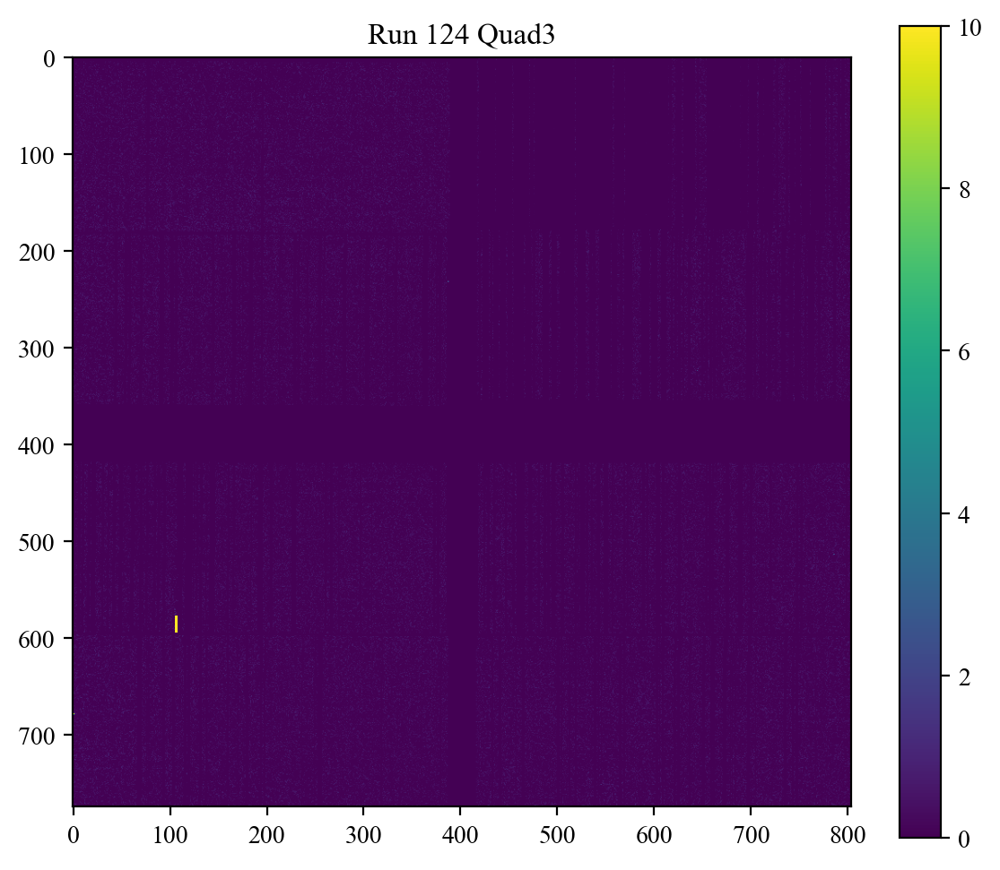

In [100]:
#i = [218, 219, 448, 449, 539, 540, 541]
plt.imshow(dark_run_images['Run 124'] ["Quad3"], vmin= 0, vmax = 10)
#plt.imshow(Run_images['Run 541'] ["Quad3"])
plt.title("Run 124 Quad3")
plt.colorbar()

In [101]:
# correct for polarization (lorentz polarization factor)
# correct for gain of every tile


## Energy import (Rahul Jangid & Karan Doss code)

In [102]:
# Read Gas Norms
def read_gas_norms(Runs, default_gas_norm = 0.7):
    import warnings
    run_numbers_list = ['run' + str(number) for number in Runs]
    print(run_numbers_list)
    gas_norm_values = {} # Dict containing all gas_norm values
    # Make a list of paths of all .txt files
    for run in run_numbers_list:
        gas_norm_values[run] = {'event':[], 'value':[]}
        text_file_name = (run + '_Bld.txt')
        # print(text_file_name)
        text_file_path = concat_4.format(path, data_files, run, text_file_name) 
        # print(text_file_path)
        header_bool = True
        
        print(text_file_path)
        #if text_file_path
        try:
            data = open(text_file_path)
            event_counter = 0
            for dat in data:
                if header_bool == True:
                    header_bool = False
                else:
                    gas_norm_values[run]['event'].append(event_counter)
                    try:
                        gas_norm_values[run]['value'].append(float(dat.split(' ')[1]))
                    except:
                        warnings.warn(run + " has no value for gas norm, set to " + str(default_gas_norm) + " by default.")
                        gas_norm_values[run]['value'].append(float(default_gas_norm))
                    event_counter += 1
                
        except:
            warnings.warn(run + " has no .txt file. Values set to defaults.")
            gas_norm_values[run]['event'] = [0]
            gas_norm_values[run]['value'] = [default_gas_norm]         

    # Remove negative and non-positive value for gas norm energies
    # Raise warnings and exceptions in such edge cases
    ref_run_bool = True
    for runs in gas_norm_values:
        if ref_run_bool == True: 
            ref_run_bool = False
            old_events = gas_norm_values[runs]['event']
            old_values = gas_norm_values[runs]['value']
            nan_idx = [idx for idx, val in enumerate(old_values) if np.isnan(val) == True]
            neg_idx = [idx for idx, val in enumerate(old_values) if val <= 0]
            remove_idx = nan_idx + neg_idx
            new_events = [evt for idx, evt in enumerate(old_events) if idx not in remove_idx]
            new_values = [val for idx, val in enumerate(old_values) if idx not in remove_idx]
            # Warn if there are multiple values
            if len(nan_idx) > 1: warnings.warn("There are" + str(len(nan_idx)) + "nan values in " + runs)
            elif len(new_values) == 0: raise Exception(runs + "contains only nan/ non-positive gas norm energy values!")
            gas_norm_values[runs]['event'] = new_events
            gas_norm_values[runs]['value'] = new_values
        else:
            if np.isnan(gas_norm_values[runs]['value'][0]) == True:
                gas_norm_values[runs]['value'][0] = default_gas_norm
                #raise Exception(runs + " has an nan gas norm energy value.")
            elif gas_norm_values[runs]['value'][0] <= 0:
                gas_norm_values[runs]['value'][0] = default_gas_norm
                #raise Exception(runs + " has an zero or negative gas norm energy value.")

    # Calculate the appropriate event for the reference
    shot_value = gas_norm_values[run_numbers_list[1]]['value'][0]
    diffs = [np.abs(val - shot_value) for val in gas_norm_values[run_numbers_list[0]]['value']]
    ref_event_idx = np.argmin(diffs)
    ref_event = gas_norm_values[run_numbers_list[0]]['event'][ref_event_idx]

    # Compile list of gas norm values
    gas_norms = []
    ref_run_bool = True
    for runs in gas_norm_values: 
        if ref_run_bool == True:
            gas_norms.append(gas_norm_values[runs]['value'][ref_event_idx])
            ref_run_bool = False
        else:
            gas_norms.append(gas_norm_values[runs]['value'][0])
    return gas_norms, ref_event



In [103]:
    
def read_energies(energy_file_name, run_numbers):
    file = open(energy_file_name)
    header_bool = False
    energies = []
    for data in file:
        if header_bool == False:
            header_bool = True
        elif int(data.split(',')[0]) in run_numbers:
            energies.append(float(data.split(',')[1]))
    return energies

energy_file_path = concat_2.format(path, energy_file_name)
E = read_energies(energy_file_path, Runs)
print("Energies (eV): ", E)

Gas_norm, ref_evt = read_gas_norms(Runs)
ref_evt_string = 'evt_' + str(int(ref_evt)) + '_'
print("Gas norms: ", Gas_norm)
print("Reference event: ", ref_evt, " of ", type(ref_evt))




Energies (eV):  [17205.8, 17206.2, 17207.6, 17209.8, 17207.8, 17205.2, 17206.7, 17208.1, 17184.2, 17186.0, 17196.3]
['run510', 'run309', 'run635', 'run639', 'run618', 'run632', 'run621', 'run627', 'run624', 'run629', 'run512']
/Volumes/T7/LX99/scratch/run510/run510_Bld.txt
/Volumes/T7/LX99/scratch/run309/run309_Bld.txt
/Volumes/T7/LX99/scratch/run635/run635_Bld.txt
/Volumes/T7/LX99/scratch/run639/run639_Bld.txt
/Volumes/T7/LX99/scratch/run618/run618_Bld.txt
/Volumes/T7/LX99/scratch/run632/run632_Bld.txt
/Volumes/T7/LX99/scratch/run621/run621_Bld.txt
/Volumes/T7/LX99/scratch/run627/run627_Bld.txt
/Volumes/T7/LX99/scratch/run624/run624_Bld.txt
/Volumes/T7/LX99/scratch/run629/run629_Bld.txt
/Volumes/T7/LX99/scratch/run512/run512_Bld.txt
Gas norms:  [1.31388, 1.39125, 1.05459, 1.08913, 0.948444, 0.982287, 1.17699, 1.21698, 1.293, 1.32539, 1.09392]
Reference event:  19  of  <class 'int'>


In [104]:
# Convert energy (eV) to wavelength (m)
def get_wavelengths(E):
    lams = []
    h = const.h # Planck's constant in Js
    c = const.c # Speed of light in m/s
    e = const.e # Electron charge in Coulomb
    # E in eV
    return [h*c/(e*energy) for energy in E]
lams = get_wavelengths(E)
print("Wavelengths (m): ", lams)


Wavelengths (m):  [7.205953715212328e-11, 7.205786195278462e-11, 7.205199936841877e-11, 7.204278866297126e-11, 7.205116193423928e-11, 7.206205009718008e-11, 7.205576806313834e-11, 7.20499058194689e-11, 7.21501137284251e-11, 7.214255698428969e-11, 7.209934604141604e-11]


## Plotting the runs

Text(0.5, 1.0, 'Run 309 Quad0')

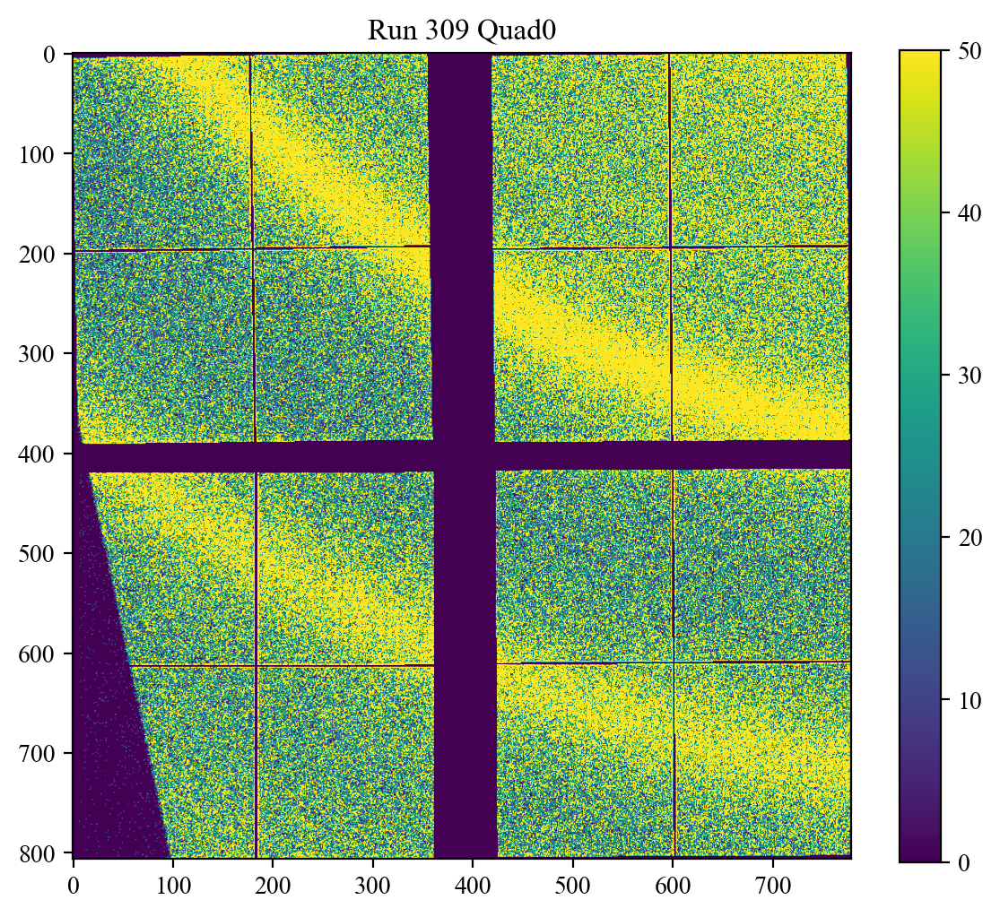

In [105]:
#plotting the quads we want. 
Run = Runs[1]
quad_2_plot = 0
plt.imshow(Run_images['Run ' +str(Run)] ['Quad' + str(quad_2_plot)], vmin = 0, vmax = 50)
plt.colorbar()
plt.title('Run ' +str(Run) + ' Quad' + str(quad_2_plot))


## Opening the calibration files

In [106]:
#open the calibration files. Using the same method as above, I am putting all the calibration files in an empty dictionary.
calibration = "/Users/meera94/Library/CloudStorage/OneDrive-UniversityofCalifornia,Davis/LX99/analysis/XRD_calibration_files/"
Quads = [0, 1, 2, 3]
calib_keys = []
for i in Quads:
    keys = 'Calib' + ' Quad' + str((i))
    calib_keys.append(keys) #so now we have a string of keys that we want
    # i = i +1
calib_all = dict.fromkeys(calib_keys)   

for i in Quads:
    calib = pyFAI.load (calibration + 'Quad'+ str(i) + '.poni')
    calib_all['Calib' + ' Quad' + str((i))] = calib
    # i = i + 1

## Creating triangle mask for quad 0

In [107]:
#This is using the first run in the run list to create this. We are only going to use Quad 0 since only quad 0 has this shadow issue that needs to be masked out.
def line_mask(x, m = 4.8, c = 345):
    y = m*x+c
    return y

edge_mask_width = 10

mask_tri = np.full(np.shape(Run_images['Run ' + str(Runs[0])]['Quad'+ str(Quads[0])]), True)
for i in range(edge_mask_width, np.shape(Run_images['Run ' + str(Runs[0])]['Quad'+ str(Quads[0])])[0]-edge_mask_width):
    for j in range(edge_mask_width, np.shape(Run_images['Run ' + str(Runs[0])]['Quad'+ str(Quads[0])])[1]-edge_mask_width):
        # print([i, j])
        if i >= line_mask(j):
            mask_tri[i, j] = True
        else:
            mask_tri[i, j] = False
mask_tri = np.logical_not(mask_tri)

TypeError: 'numpy.float64' object is not callable

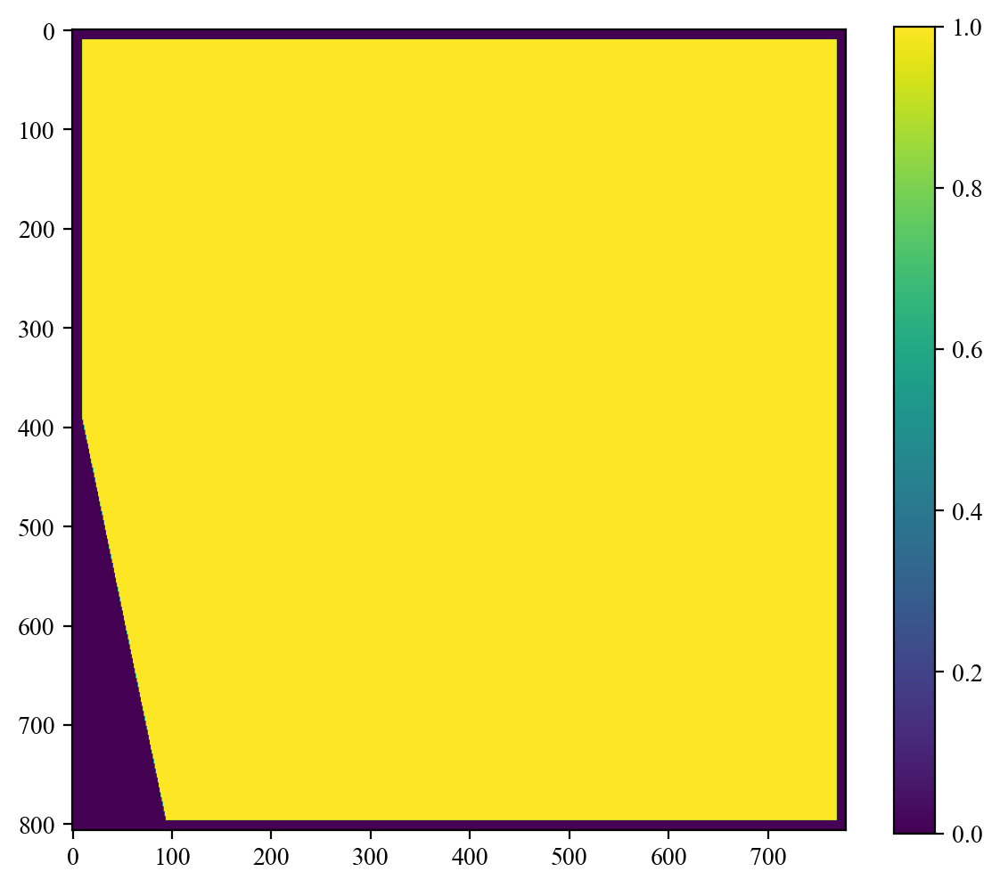

In [ ]:
#plotting the masks used
plt.imshow((mask_tri))
plt.colorbar()
plt.show()

## 1D Azimuthal Intergration Sanity check and mask checks

In [ ]:
quad_to_look_at = 3

Text(0.5, 1.0, 'Run 309 Quad3')

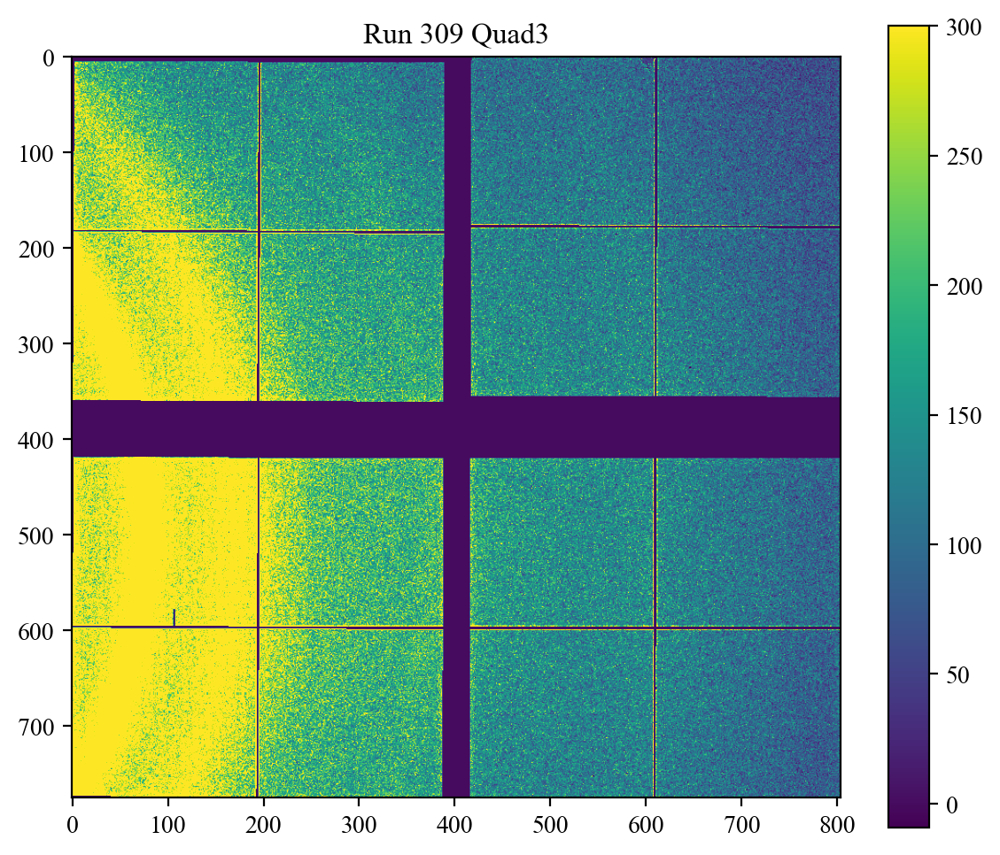

In [ ]:
#plotting the quads we want. 
Run = Runs[1]
quad_2_plot = quad_to_look_at
plt.imshow(Run_images['Run ' +str(Run)] ['Quad' + str(quad_2_plot)]-dark_run_images['Run 124']['Quad3'], vmax = 300)
plt.colorbar()
plt.title('Run ' +str(Run) + ' Quad' + str(quad_2_plot))


In [ ]:
Run_images['Run ' + str(Runs[0])]['Quad'+ str(Quads[quad_to_look_at])]

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.09739272,
        -0.397097  , 12.318158  ],
       [ 0.        ,  0.        ,  0.        , ..., -0.32152328,
         0.07492607,  3.5550466 ],
       ...,
       [22.633926  , 20.329508  , 33.766354  , ...,  6.3062515 ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  5.579949  ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., 12.545371  ,
         0.        ,  0.        ]], dtype=float32)

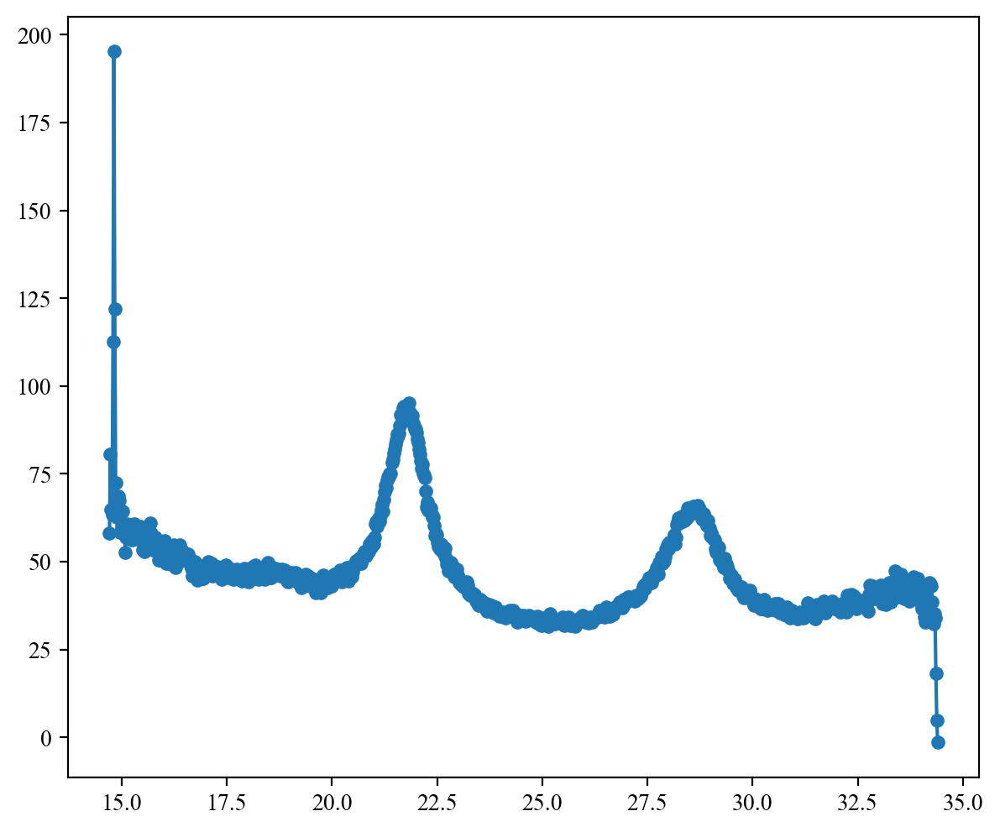

In [21]:
## Azimuthal integration
# mask_1 = images!=0.0 # masks out the low pixels(=0) (areas between the modules)

i = 1
quad_to_look_at = 0
mask_1 = Run_images['Run ' + str(Runs[i])]['Quad'+ str(Quads[quad_to_look_at])]!=0.0 # masks out the low pixels(=0) (areas between the modules) here we care about the c values or the intensity
mask_2 = Run_images['Run ' + str(Runs[i])]['Quad'+ str(Quads[quad_to_look_at])]<2050 ## masks out the hot pixels (>500) (areas between the modules)
img = Run_images['Run ' + str(Runs[i])]['Quad'+ str(Quads[quad_to_look_at])]
# x = np.linspace(0, 100, 100)
# mask_3 = images<line_mask(x)

mask_moduleedge0 = np.full(np.shape(img), True)
mask_moduleedge0[:, 180:190] = False
mask_moduleedge0[190:205, :] = False
mask_moduleedge0[:, 590:610] = False    # areas which are false are zeros and true is one. 
mask_moduleedge0[605:620, :] = False
mask_moduleedge0[380:400, :] = False
mask_moduleedge0[:, 355:425] = False


edge_mask_width = 10
mask_edge = np.full(np.shape(Run_images['Run ' + str(Runs[i])]['Quad'+ str(Quads[quad_to_look_at])]), True)
mask_edge[0:edge_mask_width, :] = False
mask_edge[-edge_mask_width:-1, :] = False
mask_edge[:, 0:edge_mask_width] = False
mask_edge[:, -edge_mask_width:-1] = False

if quad_to_look_at == 0:
    mask = mask_1 & mask_2 & mask_tri & mask_edge& mask_moduleedge0
else:
    mask = mask_1 & mask_2 & mask_edge
    
    
mask = mask.astype('float')

mask[mask == 0] = np.nan #mask is  a nanmaks ie nans and ones

mask_zeros = mask
mask_zeros[mask == np.nan] = 0 

dark = dark_run_images['Run 124'] ["Quad"+str(quad_to_look_at)]

Integ_results = calib_all['Calib Quad'+str(quad_to_look_at)].integrate1d(Run_images['Run ' + str(Runs[i])]['Quad'+ str(Quads[quad_to_look_at])]*mask-dark, 1000, unit= "2th_deg")

x = Integ_results[0]
y = Integ_results[1]
y[y == 0] = np.nan

plt.plot(x, y, 'o-', markersize = 5)

In [22]:
np.shape(mask_tri)

(806, 779)

## Masking between the modules check

(806, 779)

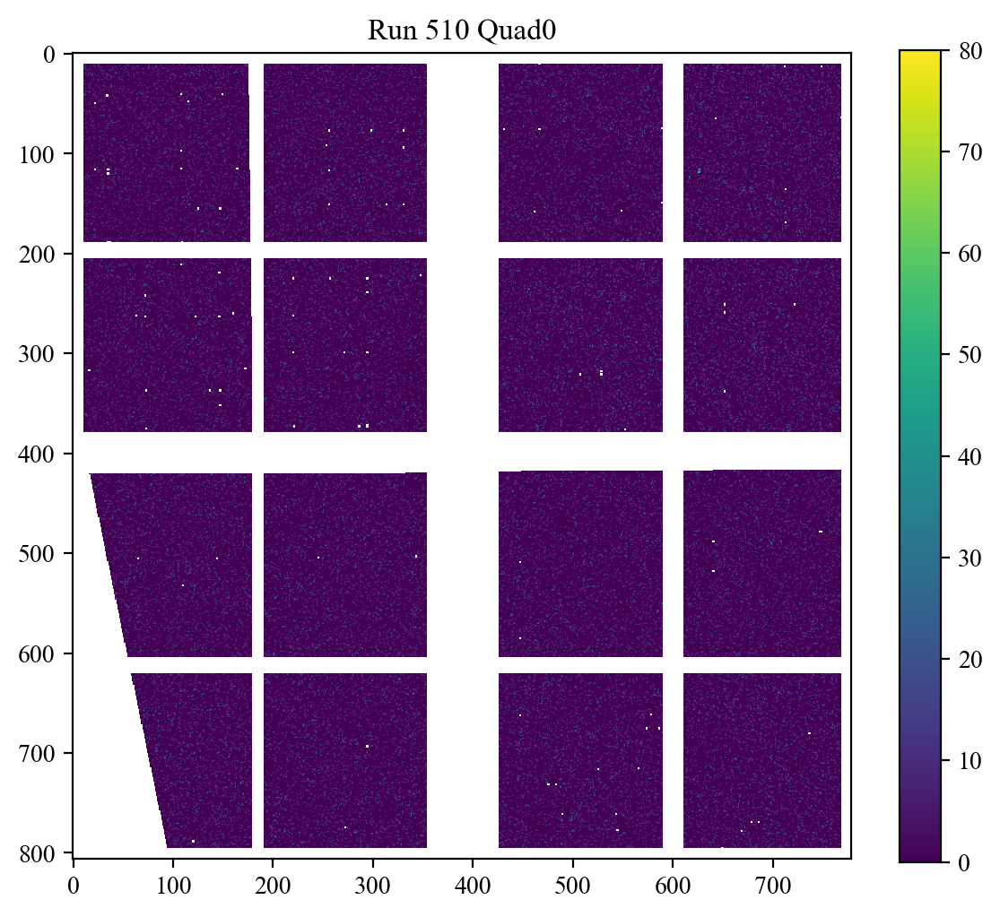

In [23]:
Run = Runs[0]
quad_2_plot = 0
test = Run_images['Run ' +str(Run)] ['Quad' + str(quad_2_plot)]
mask_moduleedge = np.full(np.shape(test), True)
# mask_moduleedge[:, 180:190] = False
# mask_moduleedge[190:205, :] = False
# mask_moduleedge[:, 590:610] = False    # areas which are false are zeros and true is one. 
# mask_moduleedge[605:620, :] = False
# mask_moduleedge[380:400, :] = False
# mask_moduleedge[:, 355:425] = False
mask_moduleedge[:, 180:190] = False
mask_moduleedge[190:205, :] = False
mask_moduleedge[:, 590:610] = False    # areas which are false are zeros and true is one. 
mask_moduleedge[605:620, :] = False
mask_moduleedge[380:400, :] = False
mask_moduleedge[:, 355:425] = False

# mask_moduleedge[:, 180:200] = False
# mask_moduleedge[175:190, :] = False
# mask_moduleedge[:, 600:620] = False    # areas which are false are zeros and true is one. 
# mask_moduleedge[585:600, :] = False
# mask_moduleedge[350:360, :] = False
# mask_moduleedge[:, 375:385] = False

mask_1 = test != 0.0 # masks out the low pixels(<1) (areas between the modules) (i.e these values are true)
mask_2 = test < 500 ## masks out the hot pixels (>500) (areas between the modules)(i.e these values are true)
mask_edge = np.full(np.shape(test), True)
mask_edge[0:edge_mask_width, :] = False
mask_edge[-edge_mask_width:-1, :] = False
mask_edge[:, 0:edge_mask_width] = False    # areas which are false are zeros and true is one. 
mask_edge[:, -edge_mask_width:-1] = False


mask_moduleedge = mask_moduleedge.astype('float')
mask_moduleedge[mask_moduleedge==0] = np.nan

masknew =mask_1*mask_2*mask_edge*mask_moduleedge* mask_tri
#masknew = mask_1 & mask_2 & mask_edge & mask_moduleedge & mask_tri
masknew = masknew.astype('float')
masknew[masknew==0] =  np.nan

plt.imshow(test*masknew, vmin= 0, vmax=80)
plt.colorbar()
plt.title('Run ' +str(Run) + ' Quad' + str(quad_2_plot))

np.shape(test)

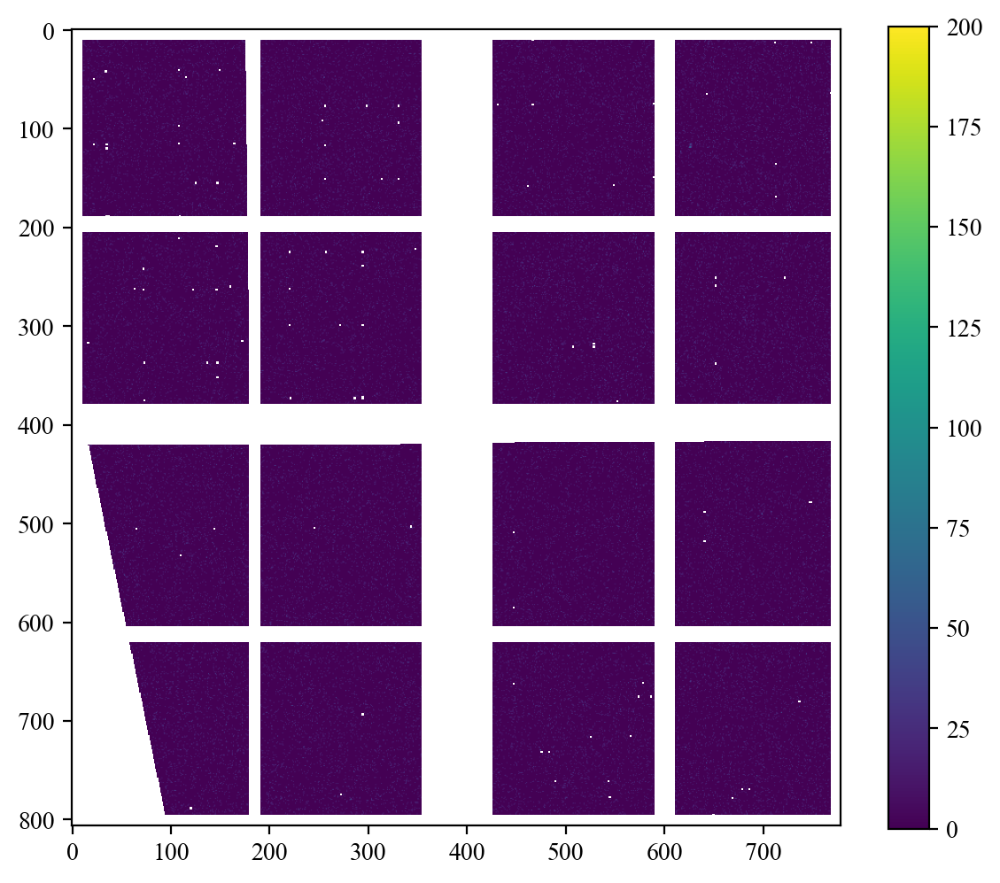

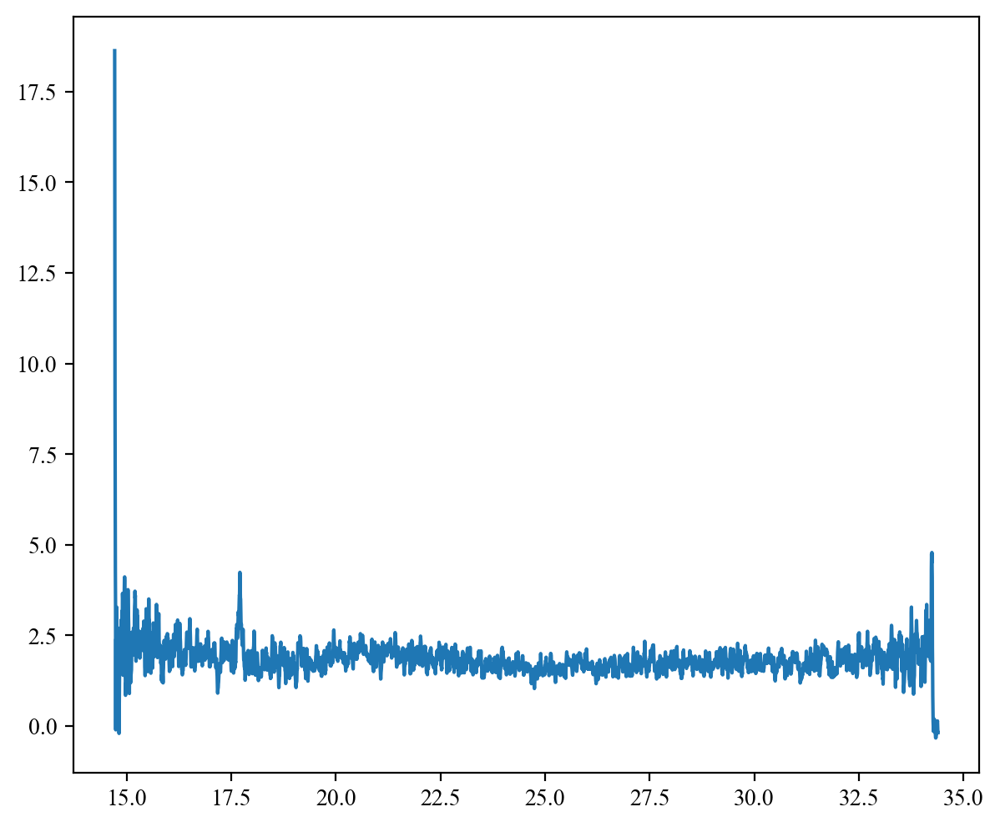

In [24]:

plt.figure()
plt.imshow(test*masknew)
plt.clim(0,200)
plt.colorbar()
#plt.title('Run ' +str(Run) + ' Quad' + str(quad_2_plot))

plt.figure()
Integ_results = calib_all['Calib Quad'+str(quad_2_plot)].integrate1d(test*masknew, npt = 5000, correctSolidAngle = True, unit= "2th_deg")
x = Integ_results[0]
y = Integ_results[1]
y[y == 0] = np.nan
plt.plot(x, y)
#plt.title('Run ' +str(Run) + ' Quad' + str(quad_2_plot))

In [25]:

quad_2_plot = 3
calib_all['Calib Quad'+str(quad_2_plot)]

Detector Detector	 Spline= None	 PixelSize= 1.000e-04, 1.000e-04 m
Wavelength= 7.290000e-11m
SampleDetDist= 1.019933e-01m	PONI= 5.014607e-02, 5.434908e-03m	rot1=0.475808  rot2= -0.002768  rot3= 0.000005 rad
DirectBeamDist= 114.739mm	Center: x=-471.217, y=498.285 pix	Tilt=27.262 deg  tiltPlanRotation= -179.654 deg

# 1D Azimuthal Intergration

In [26]:
## Azimuthal integration
Int_keys = []
Int_quad_keys = []
for j in Runs:
   keys = 'Run ' + str((j))
   Int_keys.append(keys)
Int_1D_results = dict.fromkeys(Int_keys) 

for i in Quads:
   keys = 'Quad' + str((i))
   Int_quad_keys.append(keys)

counter = 0
   
for j in Runs:
   Int_1D_quads = dict.fromkeys(Int_quad_keys)
   for i in Quads:
      img = Run_images['Run ' + str(j)]['Quad'+ str(i)]
      mask_1 = Run_images['Run ' + str(j)]['Quad'+ str(i)] != 0.0 # masks out the low pixels(<1) (areas between the modules) (i.e these values are true)
      mask_2 = Run_images['Run ' + str(j)]['Quad'+ str(i)] < 2050 ## masks out the hot pixels (>500) (areas between the modules)(i.e these values are true)
      mask_moduleedge0 = np.full(np.shape(img), True)
      mask_moduleedge0[:, 180:190] = False
      mask_moduleedge0[190:205, :] = False
      mask_moduleedge0[:, 590:610] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge0[605:620, :] = False
      mask_moduleedge0[380:400, :] = False
      mask_moduleedge0[:, 355:425] = False
      
      mask_moduleedge1 = np.full(np.shape(img), True)
      mask_moduleedge1[:, 180:200] = False
      mask_moduleedge1[175:190, :] = False
      mask_moduleedge1[:, 600:620] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge1[585:600, :] = False
      mask_moduleedge1[350:360, :] = False
      mask_moduleedge1[:, 385:420] = False
      
      mask_moduleedge2 = np.full(np.shape(img), True)
      mask_moduleedge2[:, 180:200] = False
      mask_moduleedge2[175:190, :] = False
      mask_moduleedge2[:, 600:620] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge2[585:600, :] = False
      mask_moduleedge2[400:420, :] = False
      mask_moduleedge2[:, 385:420] = False
      
      mask_moduleedge3 = np.full(np.shape(img), True)
      mask_moduleedge3[:, 180:200] = False
      mask_moduleedge3[175:190, :] = False
      mask_moduleedge3[:, 600:620] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge3[585:600, :] = False
      mask_moduleedge3[350:360, :] = False
      mask_moduleedge3[:, 375:385] = False
      
      mask_edge = np.full(np.shape(img), True)
      mask_edge[0:edge_mask_width, :] = False
      mask_edge[-edge_mask_width:-1, :] = False
      mask_edge[:, 0:edge_mask_width] = False    # areas which are false are zeros and true is one. Actually as true or false its a boolean 
      mask_edge[:, -edge_mask_width:-1] = False
      
      if i == 0:
         mask = mask_1 & mask_2 & mask_tri & mask_edge & mask_moduleedge0
      elif i == 1:
         mask = mask_1 & mask_2 & mask_edge & mask_moduleedge1
      elif i == 2:
         mask = mask_1 & mask_2 & mask_edge & mask_moduleedge2
      elif i == 3:
         mask = mask_1 & mask_2 & mask_edge & mask_moduleedge3
         
      mask = mask.astype('float')
      mask[mask == 0] = np.nan
      calib_all['Calib Quad' + str(i)].wavelength = lams[counter]
      
      dark = dark_run_images['Run 124'] ["Quad"+ str(i)]
      
      Integ_results = calib_all['Calib Quad' + str(i)].integrate1d(img*mask-dark, 5000,  unit="q_A^-1")# unit="2th_deg") # remember to put bin correctSolidAngle = False
      Integ_results[1][Integ_results[1] == 0] = np.nan
       
      Int_1D_quads['Quad' + str((i))] =  Integ_results
   Int_1D_results['Run ' + str((j))] = Int_1D_quads
   counter = counter + 1
      
#print(Int_1D_results)

In [27]:
# for count, _ in enumerate(Runs):
#     print(count)
density_of_points = 50


nbin_run = dict.fromkeys(Run_key_list) 
Range_per_run = dict.fromkeys(Run_key_list)
max_run = dict.fromkeys(Run_key_list)
min_run = dict.fromkeys(Run_key_list)
for j, _ in enumerate(Runs):
   nbin_quads = dict.fromkeys(Quad_key_list)
   range_quads = dict.fromkeys(Quad_key_list)
   max_quad = dict.fromkeys(Quad_key_list)
   min_quad = dict.fromkeys(Quad_key_list)
   for i, _ in enumerate(Quads):
      x = Int_1D_results['Run ' + str(Runs[j])]['Quad' + str(i)][0]
      np.max
      print('shape:', np.shape(x))
      print('max: ', np.max(x))
      print('min: ', np.min(x))
      range = np.max(x) - np.min(x)
      print('range: ', range)
      nbins = np.around(range* density_of_points,0)
      nbin_quads['Quad' + str((i))] = nbins
      #print('density: ', density)
      range_quads['Quad' + str((i))] =  range
      max_quad['Quad' + str((i))] = np.max(x)
      min_quad['Quad' + str((i))] = np.min(x)
   
   nbin_run['Run ' + str(Runs[j])] = nbin_quads
   Range_per_run['Run ' + str(Runs[j])] = range_quads
   max_run['Run ' + str(Runs[j])] = max_quad
   min_run['Run ' + str(Runs[j])] = min_quad
      


shape: (5000,)
max:  5.2970720105311955
min:  2.196704851918717
range:  3.1003671586124786
shape: (5000,)
max:  4.285020485188831
min:  1.4122184472510835
range:  2.8728020379377472
shape: (5000,)
max:  10.18094300330572
min:  6.239353879072593
range:  3.9415891242331265
shape: (5000,)
max:  9.433191006428473
min:  3.6577924561888384
range:  5.775398550239634
shape: (5000,)
max:  5.297195009247938
min:  2.1967557599968175
range:  3.1004392492511204
shape: (5000,)
max:  4.285120423555429
min:  1.4122512622906775
range:  2.8728691612647514
shape: (5000,)
max:  10.181179690186006
min:  6.239498776882962
range:  3.9416809133030446
shape: (5000,)
max:  9.433409783252298
min:  3.657877259993468
range:  5.77553252325883
shape: (5000,)
max:  5.297626076970737
min:  2.196934605832656
range:  3.1006914711380804
shape: (5000,)
max:  4.285469063548417
min:  1.4123661624937638
range:  2.8731029010546534
shape: (5000,)
max:  10.182008210443875
min:  6.240006491378242
range:  3.942001719065633
shape:

## 1D integration with specific bin numbers (get the same nbins per degree)

In [28]:
## Azimuthal integration
Int_keys = []
Int_quad_keys = []
for j in Runs:
   keys = 'Run ' + str((j))
   Int_keys.append(keys)
Int_1D_results = dict.fromkeys(Int_keys) 

for i in Quads:
   keys = 'Quad' + str((i))
   Int_quad_keys.append(keys)

counter = 0
   
for j in Runs:
   Int_1D_quads = dict.fromkeys(Int_quad_keys)
   for i in Quads:
      img = Run_images['Run ' + str(j)]['Quad'+ str(i)]
      mask_1 = Run_images['Run ' + str(j)]['Quad'+ str(i)] != 0.0 # masks out the low pixels(<1) (areas between the modules) (i.e these values are true)
      mask_2 = Run_images['Run ' + str(j)]['Quad'+ str(i)] < 2000 ## masks out the hot pixels (>500) (areas between the modules)(i.e these values are true)
      mask_moduleedge0 = np.full(np.shape(img), True)
      mask_moduleedge0[:, 180:190] = False
      mask_moduleedge0[190:205, :] = False
      mask_moduleedge0[:, 590:610] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge0[605:620, :] = False
      mask_moduleedge0[380:400, :] = False
      mask_moduleedge0[:, 355:425] = False
      
      mask_moduleedge1 = np.full(np.shape(img), True)
      mask_moduleedge1[:, 180:200] = False
      mask_moduleedge1[175:190, :] = False
      mask_moduleedge1[:, 600:620] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge1[585:600, :] = False
      mask_moduleedge1[350:360, :] = False
      mask_moduleedge1[:, 385:420] = False
      
      mask_moduleedge2 = np.full(np.shape(img), True)
      mask_moduleedge2[:, 180:200] = False
      mask_moduleedge2[175:190, :] = False
      mask_moduleedge2[:, 600:620] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge2[585:600, :] = False
      mask_moduleedge2[400:420, :] = False
      mask_moduleedge2[:, 385:420] = False
      
      mask_moduleedge3 = np.full(np.shape(img), True)
      mask_moduleedge3[:, 180:200] = False
      mask_moduleedge3[175:190, :] = False
      mask_moduleedge3[:, 600:620] = False    # areas which are false are zeros and true is one. 
      mask_moduleedge3[585:600, :] = False
      mask_moduleedge3[350:360, :] = False
      mask_moduleedge3[:, 375:385] = False
      
      mask_edge = np.full(np.shape(img), True)
      mask_edge[0:edge_mask_width, :] = False
      mask_edge[-edge_mask_width:-1, :] = False
      mask_edge[:, 0:edge_mask_width] = False    # areas which are false are zeros and true is one. Actually as true or false its a boolean 
      mask_edge[:, -edge_mask_width:-1] = False
      
      if i == 0:
         mask = mask_1 & mask_2 & mask_tri & mask_edge & mask_moduleedge0
      elif i == 1:
         mask = mask_1 & mask_2 & mask_edge & mask_moduleedge1
      elif i == 2:
         mask = mask_1 & mask_2 & mask_edge & mask_moduleedge2
      elif i == 3:
         mask = mask_1 & mask_2 & mask_edge & mask_moduleedge3
         
      mask = mask.astype('float')
      mask[mask == 0] = np.nan
      calib_all['Calib Quad' + str(i)].wavelength = lams[counter]
      
      dark = dark_run_images['Run 124'] ["Quad"+ str(i)]
      
      Integ_results = calib_all['Calib Quad' + str(i)].integrate1d(img*mask-dark, npt = (nbin_run['Run ' + str(j)]['Quad'+ str(i)]) ,   unit="q_A^-1") #unit="2th_deg") 
      # remember to put bin correctSolidAngle = False
      Integ_results[1][Integ_results[1] == 0] = np.nan
       
      Int_1D_quads['Quad' + str((i))] =  Integ_results
   Int_1D_results['Run ' + str((j))] = Int_1D_quads
   counter = counter + 1
      
#print(Int_1D_results)

## Saving the files

In [29]:

# for i in range(len(Runs)): 
#     for j in Quads:
#         x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
#         y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
#         np.savetxt('XRun ' + str(Runs[i])+ ' Quad' + str(j), x, delimiter=",")
#         np.savetxt('YRun ' + str(Runs[i])+ ' Quad' + str(j), y, delimiter=",")
        
# os.getcwd()

## Plotting all the Runs

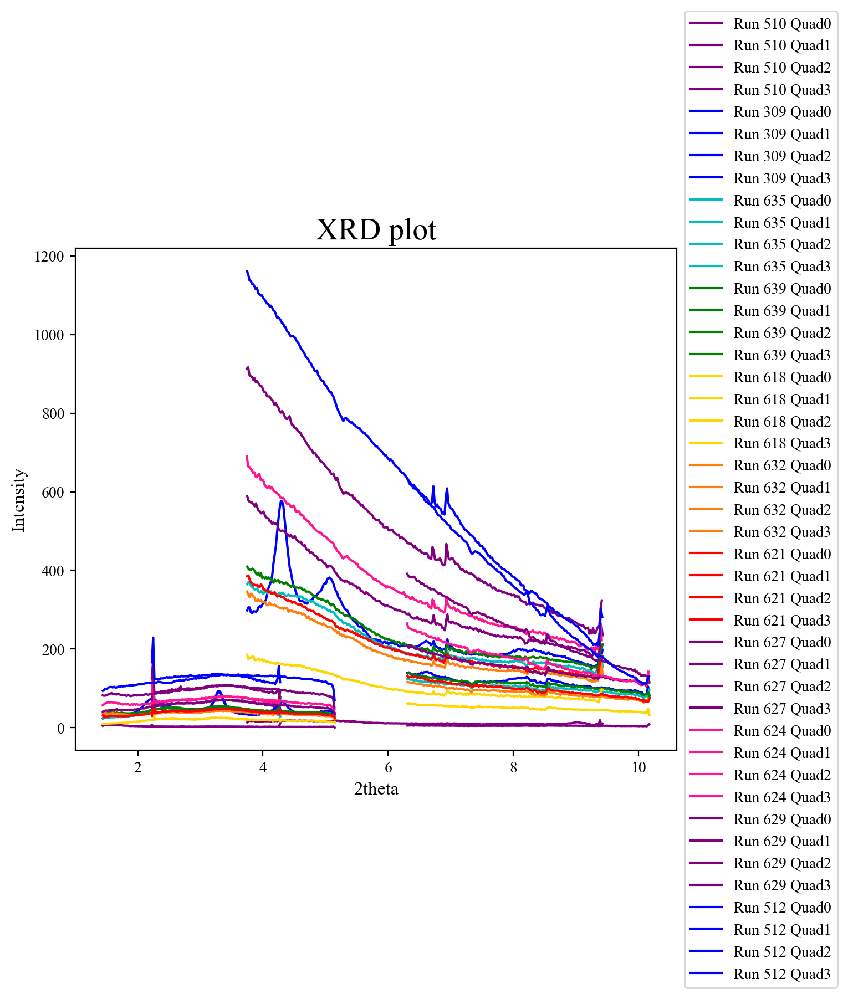

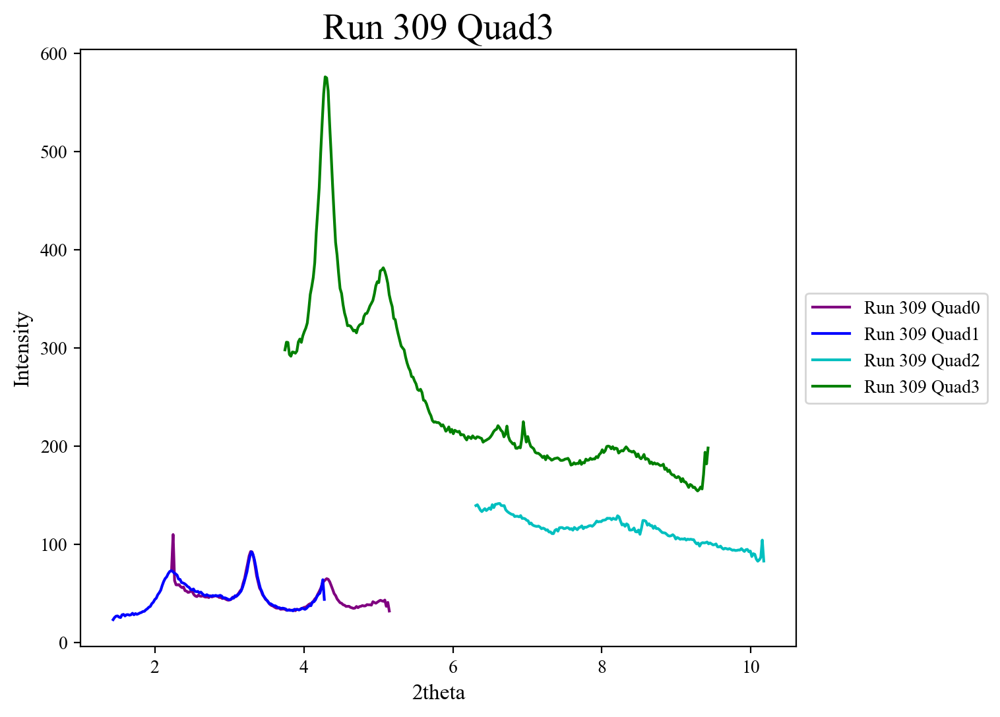

In [30]:
# plotting intergrated results for any Run and all quads
clr = ['purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple']#, 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink'] 
plt.figure()
for i, _ in enumerate(Runs):
    for j, _ in enumerate(Quads):
        x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
        plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i]) 
    
plt.xlabel('2theta', fontsize = 12)
plt.ylabel('Intensity', fontsize = 12) 
plt.title('XRD plot', fontsize = 20)
#plt.ylim([0, 50])
plt.legend()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

distance = [200, 200, 100, 100] # find detector distances from PONI and put that in. There are tilts to account for still
plt.figure()
i =1
for j, _ in enumerate(Quads):
    x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
    y = (Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1])#/(distance[j]*distance[j])
    plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[j]) 
    
plt.xlabel('2theta', fontsize = 12)
plt.ylabel('Intensity', fontsize = 12) 
plt.title('Run ' +str(Runs[i])+' Quad' + str(j), fontsize = 20)
#plt.ylim([0, 50])
plt.legend()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


# max(Integresults[1])

### Solid angle correction cell


In [31]:
calib_all['Calib Quad3']

Detector Detector	 Spline= None	 PixelSize= 1.000e-04, 1.000e-04 m
Wavelength= 7.209935e-11m
SampleDetDist= 1.019933e-01m	PONI= 5.014607e-02, 5.434908e-03m	rot1=0.475808  rot2= -0.002768  rot3= 0.000005 rad
DirectBeamDist= 114.739mm	Center: x=-471.217, y=498.285 pix	Tilt=27.262 deg  tiltPlanRotation= -179.654 deg

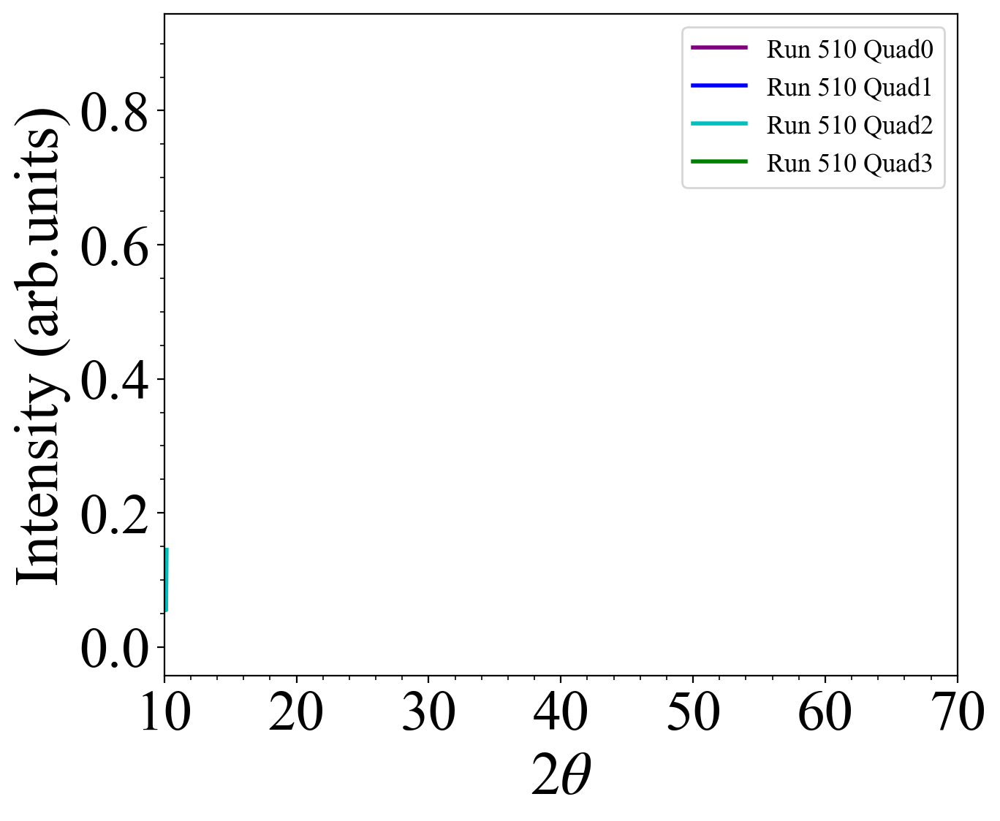

In [32]:
distance = [0.274, 0.279, 0.129, 0.102] # find detector distances from PONI and put that in. There are tilts to account for still
plt.figure()
i = 0
for j, _ in enumerate(Quads):
    x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
    y = (Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1])*(distance[j]*distance[j])
    plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[j], linewidth= 2) 

# j= 0
# x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
# y = (Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1])*(distance[j]*distance[j])
# plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[j]) 
plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
plt.legend(fontsize = legend_size-15)
# plt.title('Normalized with maximum intensity', fontsize = 20)
plt.rcParams["legend.loc"] = 'upper right'
plt.xlim(10,70)
plt.minorticks_on()
# plt.ylim(0, 16)
plt.show() 

  
# plt.xlabel('2theta', fontsize = 12)
# plt.ylabel('Intensity', fontsize = 12) 
# plt.title('Run ' +str(Runs[i]), fontsize = 20)
# #plt.ylim([0, 50])
# plt.legend()
# # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# plt.show()

In [33]:
distance = [0.274, 0.279, 0.129, 0.102]
for j, _ in enumerate(Quads):
    distance[j]
    print(distance[j]*distance[j])

0.07507600000000002
0.07784100000000002
0.016641
0.010403999999999998


## Peak fitting definitions

In [34]:
#fitting a gaussian fit? How does one fit a curve? 
#step 1: Define a peak fitting function. This can be any function you want, just write down the function with all the defining parameters. Pro tip: Plot the function on desmos and see how each fitting parameter affects the curve fit to understand your function better

def gaussfit(x, B, a, x0, sigma):
    return B + a*np.exp(-(x-x0)**2/(2*sigma**2))

def twogaussfit(x, B, a0, x0, sigma0, a1, x1, sigma1):
    return B + a0*np.exp(-(x-x0)**2/(2*sigma0**2))+a1*np.exp(-(x-x1)**2/(2*sigma1**2))

def threegaussfit(x, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2):
    return B + a0*np.exp(-(x-x0)**2/(2*sigma0**2))+a1*np.exp(-(x-x1)**2/(2*sigma1**2))+a2*np.exp(-(x-x2)**2/(2*sigma2**2))

def fourgaussfit(x, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return B + a0*np.exp(-(x-x0)**2/(2*sigma0**2))+a1*np.exp(-(x-x1)**2/(2*sigma1**2))+a2*np.exp(-(x-x2)**2/(2*sigma2**2))+a3*np.exp(-(x-x3)**2/(2*sigma3**2))

def twolorenfit(x, B, a0, x0, sigma0, a1, x1, sigma1):
    return B + (a0/(((x-x0)/sigma0)**2+1))**2 + (a1/(((x-x1)/sigma1)**2+1))**2
#i = 0
# Quad 0

## Resample the data (interpolation)


In [35]:
Resample_keys = []
Resample_quad_keys = []
for j, _ in enumerate(Runs):
   keys = 'Run ' + str(Runs[j])
   Resample_keys.append(keys)
Resample_results = dict.fromkeys(Resample_keys) 

for i, _ in enumerate(Quads):
   keys = 'Quad' + str((i))
   Resample_quad_keys.append(keys)

counter =0 
for j, _ in enumerate(Runs):
   Resample_quads = dict.fromkeys(Resample_quad_keys)
   for i, _ in enumerate(Quads):
      x = Int_1D_results['Run ' + str(Runs[j])]['Quad' + str((i))][0]
      y = Int_1D_results['Run ' + str(Runs[j])]['Quad' + str((i))][1]
      ## create new x and y data
      minimum = np.ceil(min_run['Run ' + str(Runs[j])]['Quad' + str((i))])
      maximum = np.floor(max_run['Run ' + str(Runs[j])]['Quad' + str((i))])
      number = maximum - minimum
      npt = int(number * density_of_points)
      x0_new = np.linspace(minimum, maximum-1/density_of_points, num = npt, endpoint=True, retstep=False, dtype=None, axis=0)
      y0_new = np.interp(x0_new,x, y)
      Resample_quads['Quad' + str((i))] = [x0_new,y0_new]
   Resample_results['Run ' + str(Runs[j])] = Resample_quads
   counter = counter + 1


## Plotting original and resampled data

Text(0.5, 1.0, 'Run 510 Quad0 before resampling')

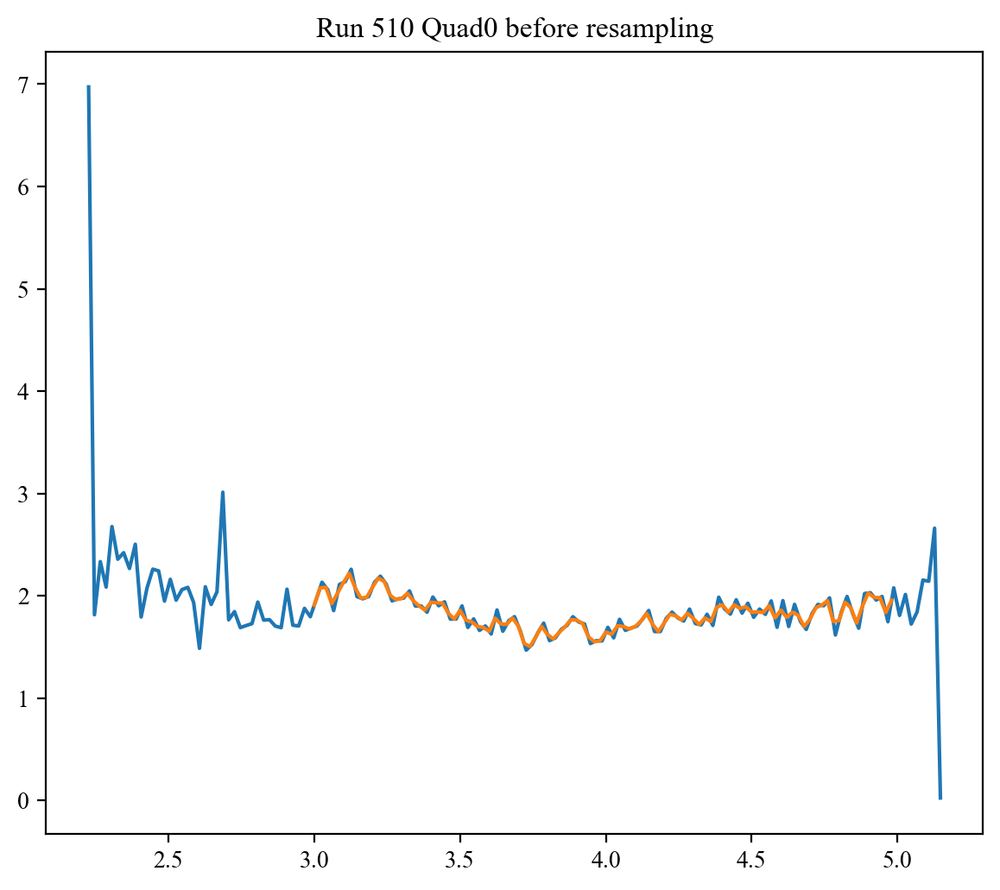

In [36]:
j = 0
i = 0
x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
x0_new = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
y0_new = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]

plt.figure()
plt.plot(x,y)
plt.plot(x0_new,y0_new)
plt.title ('Run ' +str(Runs[i]) + ' Quad' + str(j) + ' before resampling' )

In [37]:
# print(Resample_results['Run 140']['Quad0'][1])

## Quad Stitching

In [38]:
#function to find overlap
def overlapfunc (a, b):
# set the tolerance value
    tolerance = 0.1

    # find the overlap
    overlap = []
    a_indices = []
    b_indices = []
    for i, _ in enumerate(a):
        for j, _ in enumerate(b):
            if abs(a[i] - b[j]) < tolerance:
                overlap.append(a[i])
                a_indices.append(i)
                b_indices.append(j)
    overlap = np.unique(np.array(overlap)) #makes sure you get unique values cos we had a lot of values of the same index. you will see what I mean when you take the unique part of this
    a_indices = np.unique(np.array(a_indices))
    b_indices = np.unique(np.array(b_indices))
    return overlap, a_indices, b_indices



In [39]:

final_ratios_quad_stitch = dict.fromkeys(Int_keys) 
for i, _ in enumerate(Runs):
    x_list = []
    y_list = []
    for j, _ in enumerate(Quads):
        x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
        x_list.append(x)
        y_list.append(y)

    _, a1_indices, b1_indices = overlapfunc(x_list[0],x_list[1])
    _, a2_indices, b2_indices = overlapfunc(x_list[0],x_list[3])
    _, a3_indices, b3_indices = overlapfunc(x_list[2],x_list[3])
    
    # q2_ovelap_mean = np.nanmean(y2[a_indices])
    # q3_ovelap_mean = np.nanmean(y3[b_indices])
    # ratio_q2_q3 = q2_ovelap_mean/q3_ovelap_mean
    
    ratio_q1_q0 = np.nanmean(y_list[1][b1_indices])/np.nanmean(y_list[0][a1_indices])
    ratio_q3_q0 = np.nanmean(y_list[3][b2_indices])/np.nanmean(y_list[0][a2_indices])
    y_list[3] = y_list[3]/ratio_q3_q0
    ratio_q3_q2 = np.nanmean(y_list[3][b3_indices])/np.nanmean(y_list[2][a3_indices])
    
    final_ratios_quad_stitch[Int_keys[i]] = [ratio_q1_q0, ratio_q3_q0, ratio_q3_q2]
    # _, a_indices, b_indices = overlapfunc(x0,x1)
    

In [40]:
quad_2_plot = 3
calib_all['Calib Quad'+str(quad_2_plot)]

Detector Detector	 Spline= None	 PixelSize= 1.000e-04, 1.000e-04 m
Wavelength= 7.209935e-11m
SampleDetDist= 1.019933e-01m	PONI= 5.014607e-02, 5.434908e-03m	rot1=0.475808  rot2= -0.002768  rot3= 0.000005 rad
DirectBeamDist= 114.739mm	Center: x=-471.217, y=498.285 pix	Tilt=27.262 deg  tiltPlanRotation= -179.654 deg

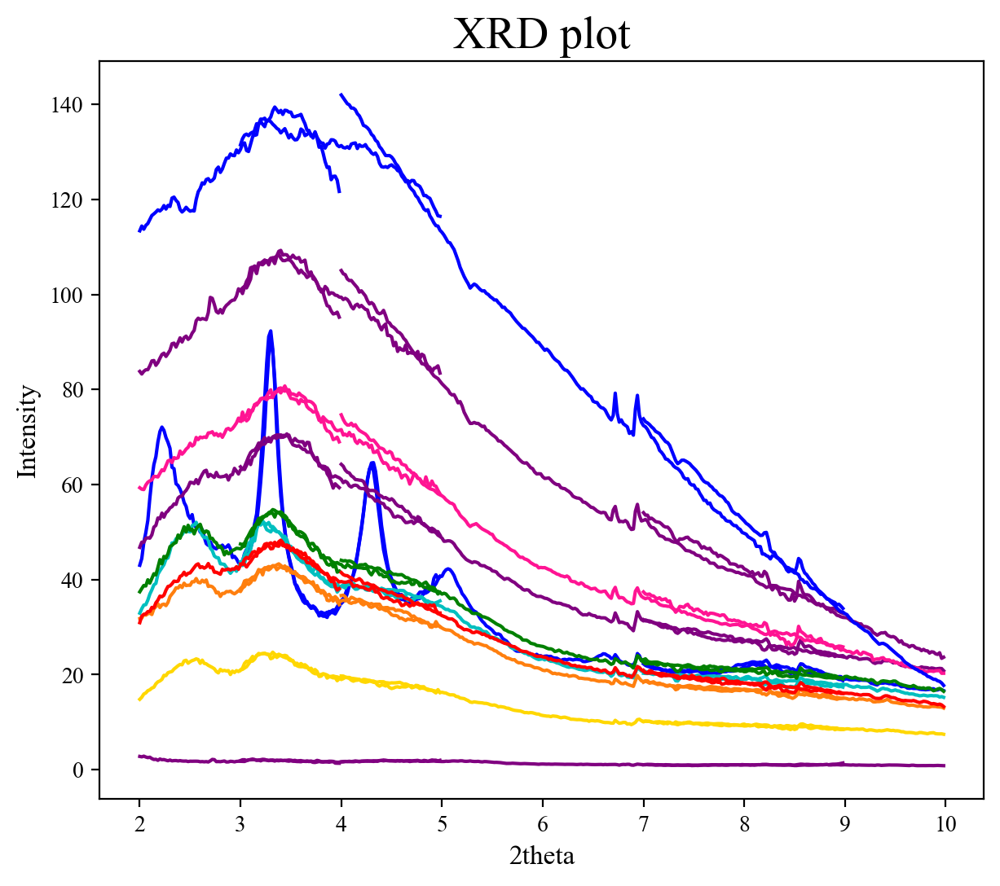

In [41]:
# plotting intergrated results for any Run and all quads
#filter_sigma = 1
#Runs1 = [140, 141, 144, 147, 150, 153, 161, 164]
for i, _ in enumerate(Runs): 
    for j, _ in enumerate(Quads):
        if j == 0:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i]) 
        elif j == 1:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch [Int_keys[i]][0] #scipy.ndimage.gaussian_filter1d (Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][0], sigma=filter_sigma)
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i])
        elif j == 2:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]*final_ratios_quad_stitch[Int_keys[i]][2]
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j),color = clr[i]) 
        elif j == 3:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][1]
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j),color = clr[i]) 
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad1'][0],Int_1D_results['Run ' +str(i)]['Quad1'][1])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad2'][0],Int_1D_results['Run ' + str(i)]['Quad2'][1])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad3'][0],Int_1D_results['Run ' +str(i)]['Quad3'][1])
plt.xlabel('2theta', fontsize = 12)
plt.ylabel('Intensity', fontsize = 12) 
plt.title('XRD plot', fontsize = 20)
#plt.ylim([0, 50])
# plt.legend()
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
# max(Integresults[1])

In [42]:
i = 0
j = 3
x=Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
print('shape:', np.shape(x))
print('max: ', np.max(x))
print('min: ', np.min(x))
range = np.max(x) - np.min(x)
density = np.shape(x)[0]/range
print('density:', density)

# you know what meera? All of the shapes are what you fucking set in the fucking bin! you binned 2000!

shape: (289,)
max:  9.423774623992749
min:  3.6672088386245587
density: 50.20354335818913


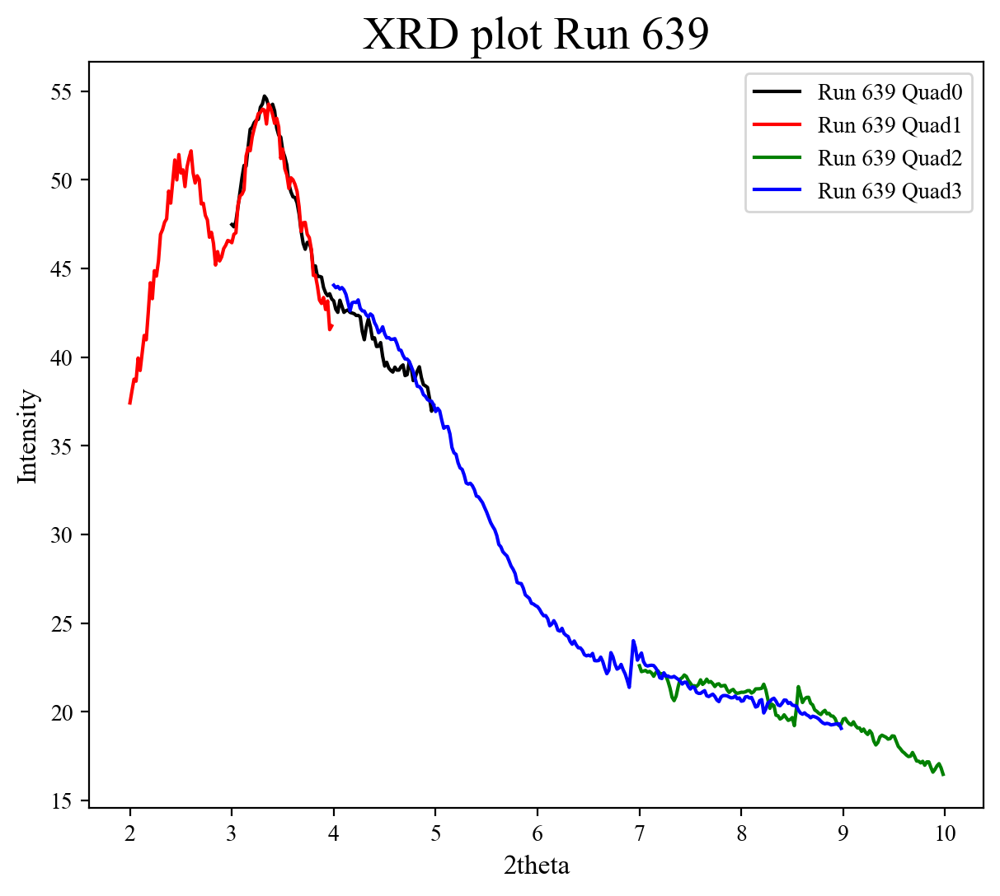

In [43]:
# plotting intergrated results for any Run and all quads

i = 3
for j in Quads:
    if j == 0:
        x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
        plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = 'k') #clr[i]) 
    elif j == 1:
        x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][0]
        plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = 'r') #clr[i])
    elif j == 2:
        x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]*final_ratios_quad_stitch[Int_keys[i]][2]
        plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = 'g') #clr[i]) 
    elif j == 3:
        x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][1]
        plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = 'b') #clr[i]) 
    # plt.plot(Int_1D_results['Run ' + str(i)]['Quad1'][0],Int_1D_results['Run ' +str(i)]['Quad1'][1])
    # plt.plot(Int_1D_results['Run ' + str(i)]['Quad2'][0],Int_1D_results['Run ' + str(i)]['Quad2'][1])
    # plt.plot(Int_1D_results['Run ' + str(i)]['Quad3'][0],Int_1D_results['Run ' +str(i)]['Quad3'][1])
plt.xlabel('2theta', fontsize = 12)
plt.ylabel('Intensity', fontsize = 12) 
plt.title('XRD plot Run ' +str(Runs[i]), fontsize = 20)
#plt.ylim([0, 20])
plt.legend()
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
# max(Integresults[1])
    # _, a1_indices, b1_indices = overlapfunc(df_list[0]['x'],df_list[1]['x'])
    # _, a2_indices, b2_indices = overlapfunc(df_list[0]['x'],df_list[3]['x'])
    # _, a3_indices, b3_indices = overlapfunc(df_list[2]['x'],df_list[3]['x'])
    
    #y_new = combine_lists(df_list[1]['y'][0:min(b1_indices)] ,  average_q1_q0  , average_q3_q0[max(b1_indices):-1] , df_list[3]['y'][max(b2_indices):min(b3_indices)] , average_q3_q2 , df_list[2]['y'][max(a3_indices):-1])
    


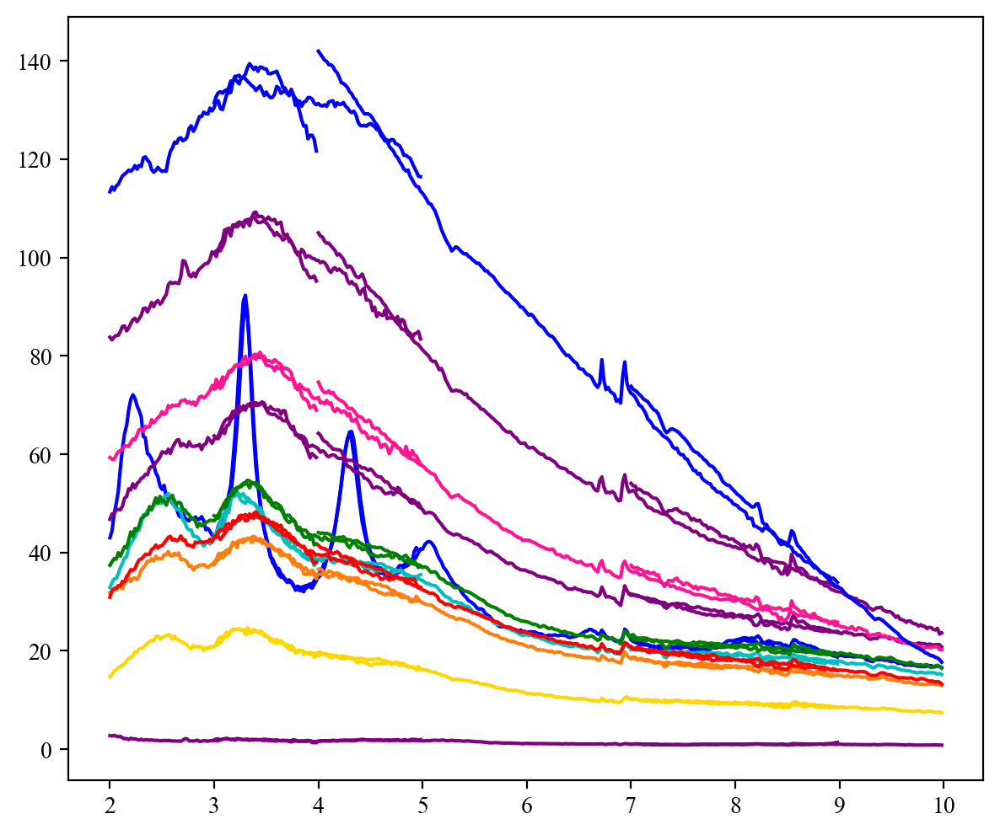

In [44]:
scaled_keys = []
scaled_quad_keys = []
for i, _ in enumerate(Runs):
   keys = 'Run ' + str(Runs[i])
   scaled_keys.append(keys)
Scaled_results = dict.fromkeys(Resample_keys) 

for j, _ in enumerate(Quads):
   keys = 'Quad' + str((j))
   scaled_quad_keys.append(keys)

counter =0 
for i, _ in enumerate(Runs):
   Scaled_quads = dict.fromkeys(Resample_quad_keys)
   for j, _ in enumerate(Quads):
        if j == 0:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
            Scaled_quads['Quad' + str((j))] = [x,y]
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i]) 
        elif j == 1:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][0]
            Scaled_quads['Quad' + str((j))] = [x,y]## I am now overwriting the resampled y data with the scaled data..omg coding takes so long, meow meow meow meow meow
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i])
        elif j == 2:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]*final_ratios_quad_stitch[Int_keys[i]][2]
            Scaled_quads['Quad' + str((j))] = [x,y]
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j),color = clr[i]) 
        elif j == 3:
            x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][1]
            Scaled_quads['Quad' + str((j))] = [x,y]
            plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j),color = clr[i])
        Scaled_results['Run ' + str(Runs[i])] = Scaled_quads 
        counter=counter + 1
   




In [45]:
averaged_quad_stitch = dict.fromkeys(Int_keys) 
for i, _ in enumerate(Runs):
    x_list = []
    y_list = []
    df_list = []
    for j, _ in enumerate(Quads):
        x = np.around(Scaled_results['Run ' + str(Runs[i])]['Quad' + str(j)][0], decimals=2)
        y = Scaled_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
        data_frame = pd.DataFrame(data = {'x':x, 'y':y})
        x_list.append(x)
        y_list.append(y)
        df_list.append(data_frame)
    
    merged_0_1 = pd.merge(df_list[0], df_list[1], on='x', how='outer')
    merged_0_1= merged_0_1.sort_values('x')
    merged_0_1['y'] = merged_0_1.loc[:, ['y_x', 'y_y']].mean(axis = 1)
    merged_0_1 = merged_0_1.drop(['y_x', 'y_y'], axis=1)
    # print(merged_0_1)
    
    merged_0_1.to_csv('test_mearged_0_1.csv')

    merged_0_1_3 = pd.merge(merged_0_1, df_list[3], on='x', how='outer')
    merged_0_1_3= merged_0_1_3.sort_values('x')
    merged_0_1_3['y'] = merged_0_1_3.loc[:, ['y_x', 'y_y']].mean(axis = 1)
    merged_0_1_3 = merged_0_1_3.drop(['y_x', 'y_y'], axis=1)
    # print(merged_0_1_3)
    merged_0_1_3.to_csv('test_mearged_0_1_3.csv')

    merged_0_1_2_3 = pd.merge(merged_0_1_3, df_list[2], on='x', how='outer')
    merged_0_1_2_3= merged_0_1_2_3.sort_values('x')
    merged_0_1_2_3['y'] = merged_0_1_2_3.loc[:, ['y_x', 'y_y']].mean(axis = 1)
    merged_0_1_2_3 = merged_0_1_2_3.drop(['y_x', 'y_y'], axis=1)
    # print(merged_0_1_2_3)
    merged_0_1_2_3.to_csv('test_mearged_0_1_2_3.csv')
    
    averaged_quad_stitch['Run ' + str(Runs[i])] = merged_0_1_2_3

# print(merged_0_1_2_3)
merged_0_1_2_3.to_csv('test_mearged.csv')

In [46]:
# merged_0_1 = pd.merge(df_list[0], df_list[1], on='x', how='outer') #{‘left’, ‘right’, ‘outer’, ‘inner’, ‘cross’}, default ‘inner’
# merged_0_1= merged_0_1.sort_values('x')
# merged_0_1.to_csv('merged_0_1.csv', index=False)

In [47]:
# merged_0_1['y'] = merged_0_1.loc[:, ['y_x', 'y_y']].mean(axis = 1)
# merged_0_1.to_csv('merged_0_1_y.csv', index=False)

In [48]:
# merged_0_1 = merged_0_1.drop(['y_x', 'y_y'], axis=1)
# merged_0_1.to_csv('merged_0_1_droppedx_y.csv', index=False)

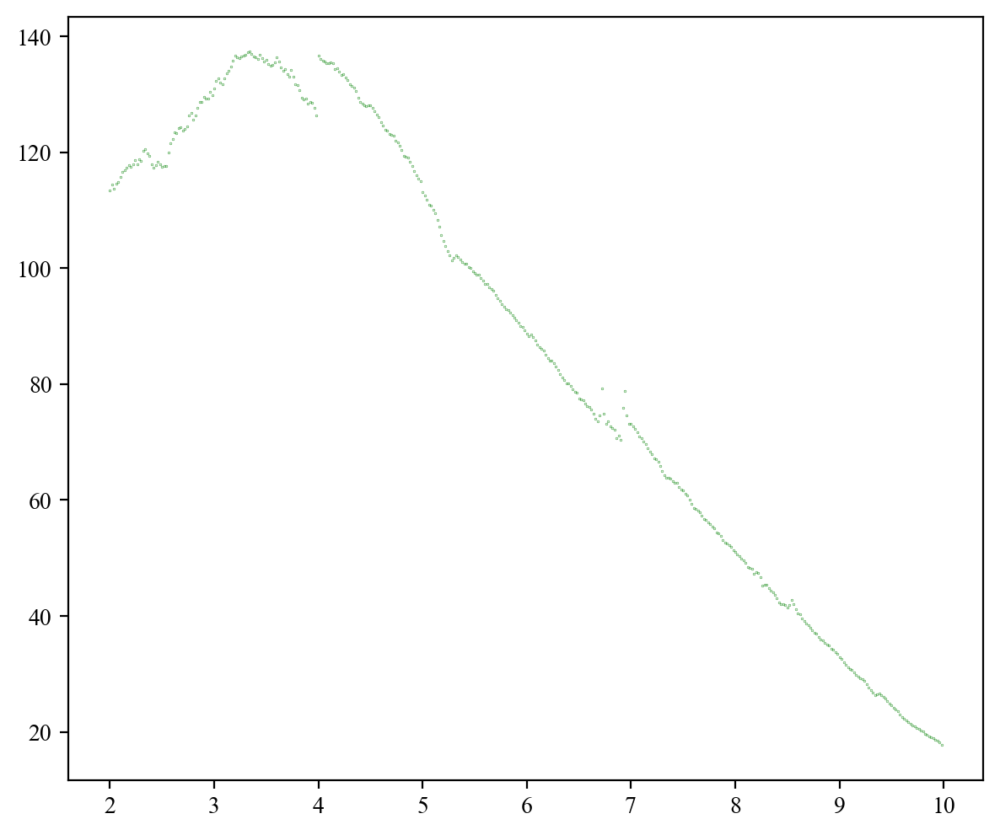

In [49]:

# plt.plot(merged_0_1['x'], merged_0_1['y'], 'o', markersize = 1, color= 'r')
# plt.plot(merged_0_1_3['x'], merged_0_1_3['y'], 'o', markersize = 0.5, color = 'b')
plt.plot(merged_0_1_2_3['x'], merged_0_1_2_3['y'], 'o', markersize = 0.15, color = 'g')
plt.show()

In [50]:
len(averaged_quad_stitch['Run ' + str(Runs[i])]['x'])/(averaged_quad_stitch['Run ' + str(Runs[i])]['x'].iloc[-1]-averaged_quad_stitch['Run ' + str(Runs[i])]['x'].iloc[0])

50.125313283208015

In [51]:
averaged_quad_stitch['Run ' + str(Runs[i])]['x'].iloc[-1]-averaged_quad_stitch['Run ' + str(Runs[i])]['x'].iloc[0]

7.98

In [52]:
for i, _ in enumerate(Runs):
    print(Gas_norm[i])

1.31388
1.39125
1.05459
1.08913
0.948444
0.982287
1.17699
1.21698
1.293
1.32539
1.09392


## Normalization with gas norm

In [53]:
##storing normalized runs in a dictionary
normalized_results = dict.fromkeys(Int_keys)
for i, _ in enumerate(Runs):
    normalized_runs = averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i]
    normalized_results['Run ' + str(Runs[i])] = normalized_runs

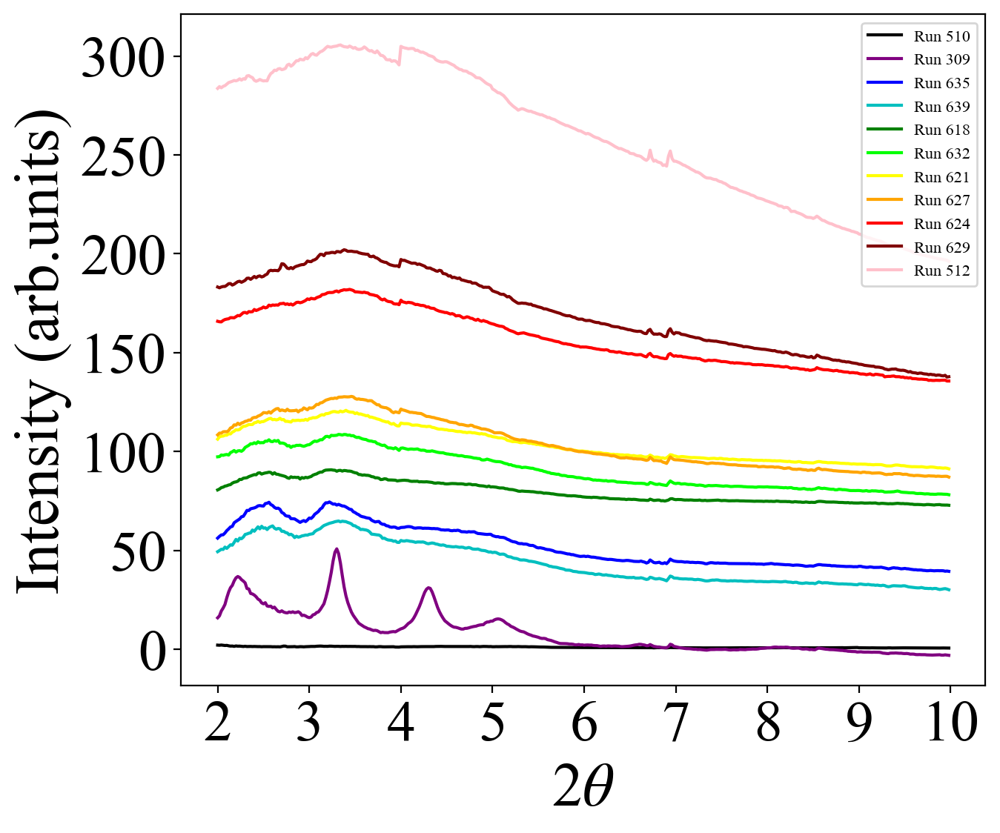

In [54]:
## Plotting the normalized runs
# for i, _ in enumerate(Runs):
#     plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i], markersize =2, color = clr[i], label = 'Run ' + str(Runs[i]))
# cm = plt.get_cmap('gist_rainbow')
# nm = len(Runs)
offset = [0, -15, 25, 15, 65, 65, 80, 70, 120, 120, 180, 190, 34, 34, 34]
# cm(1*i/nm)
clr = ['k', 'purple', 'blue', 'c', 'green', 'lime' , 'yellow', 'orange', 'r', 'maroon' , 'pink', 'skyblue', 'yellow', 'orange', 'r', 'maroon' , 'pink', 'skyblue']
for i, _ in enumerate(Runs):
    plt.plot(normalized_results['Run ' + str(Runs[i])][0], normalized_results['Run ' + str(Runs[i])][1] +offset[i], markersize = 5, color = clr[i], label = 'Run ' + str(Runs[i])) #offset[i]
    
plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
plt.legend(fontsize = legend_size-20)
plt.rcParams["legend.loc"] = 'upper right'
# plt.xlim(10,70)
plt.show() # google how to save as csv in pandas data frame.


## Normalization with maximum intensity

In [55]:
normalizedmax_results = dict.fromkeys(Int_keys)
for i, _ in enumerate(Runs):
    normalizedmax_runs = normalized_results['Run ' + str(Runs[i])][0], (normalized_results['Run ' + str(Runs[i])][1]/np.max(normalized_results['Run ' + str(Runs[i])][1]))
    normalizedmax_results['Run ' + str(Runs[i])] = normalizedmax_runs

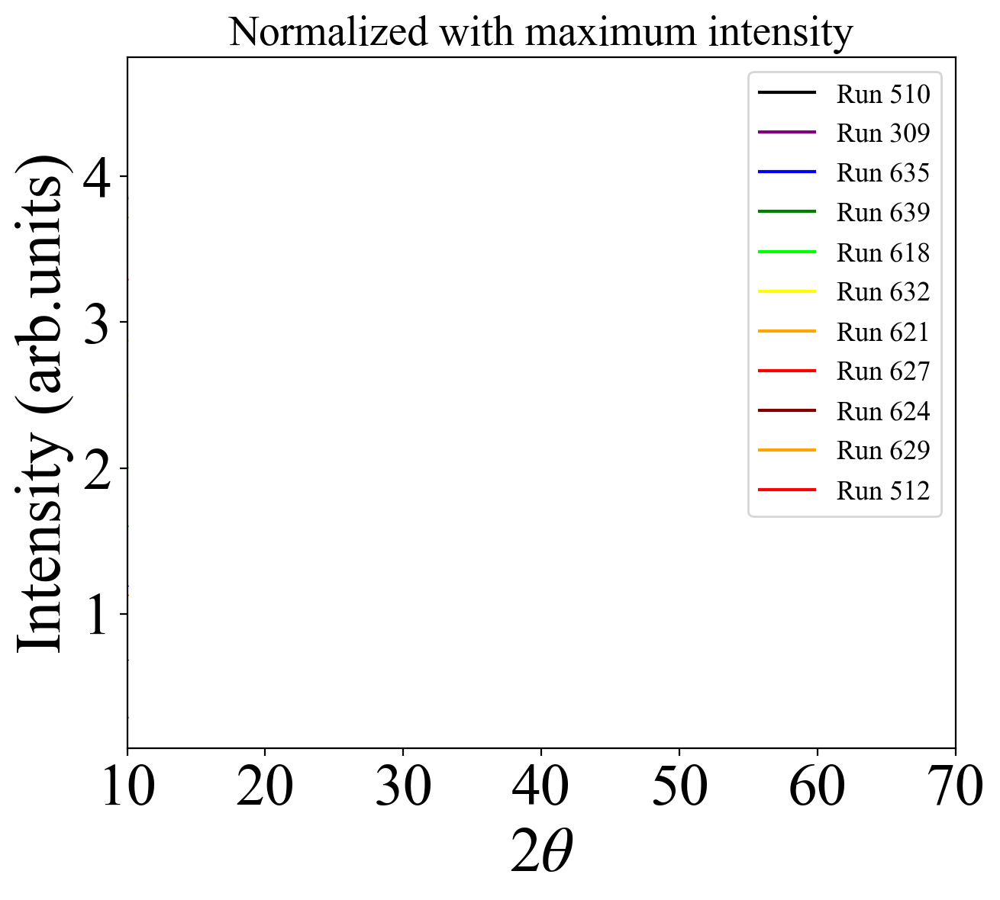

In [56]:

# cm = plt.get_cmap('gist_rainbow')
# nm = len(Runs)
offset = [0, 0.5, 0.9, 1.3, 1.7, 2.2, 2.6, 3, 3.6, 3.5, 1, 1, 1, 1]#, 180, 190]
# cm(1*i/nm)
clr = ['k', 'purple', 'blue','green', 'lime' , 'yellow', 'orange', 'r', 'maroon' ,  'orange', 'r', 'maroon', 'blue','green', 'lime' , 'yellow', 'orange', 'r', 'maroon' ,  'orange' ]#, 'pink', 'skyblue']
# for i, _ in enumerate(Runs):
# clr = [ 'purple', 'blue', 'c','green', 'lime' , 'yellow', 'orange', 'r', 'maroon'  ]
#     plt.plot(normalized_results['Run ' + str(Runs[i])][0], normalized_results['Run ' + str(Runs[i])][1] +offset[i], markersize = 5, color = clr[i], label = 'Run ' + str(Runs[i])) #offset[i]

# for i, _ in enumerate(Runs):
#     plt.plot(normalized_results['Run ' + str(Runs[i])][0], (normalized_results['Run ' + str(Runs[i])][1]/np.max(normalized_results['Run ' + str(Runs[i])][1]))+offset[i] , markersize = 5, color = clr[i], label = 'Run ' + str(Runs[i])) #offset[i]
    

for i, _ in enumerate(Runs):
    plt.plot(normalizedmax_results['Run ' + str(Runs[i])][0], normalizedmax_results['Run ' + str(Runs[i])][1]+offset[i], markersize = 5, color = clr[i], label = 'Run ' + str(Runs[i])) #offset[i]
    # plt.plot(normalized_results['Run ' + str(Runs[i])][0], (normalized_results['Run ' + str(Runs[i])][1]/np.max(normalized_results['Run ' + str(Runs[i])][1]))+offset[i] , markersize = 5, color = 'k', label = 'Run ' + str(Runs[i])) #offset[i]
# i= 1
# plt.plot(normalizedmax_results['Run ' + str(Runs[i])][0], normalizedmax_results['Run ' + str(Runs[i])][1], markersize = 5, color = clr[i], label = 'Run ' + str(Runs[i]))   
plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
plt.legend(fontsize = legend_size-15)
plt.title('Normalized with maximum intensity', fontsize = 20)
plt.rcParams["legend.loc"] = 'upper right'
plt.xlim(10,70)
plt.show() # google how to save as csv in pandas data frame.

## Fourgauss peak fitting with a linear background

In [57]:
#fitting a gaussian fit? How does one fit a curve? 
#step 1: Define a peak fitting function. This can be any function you want, just write down the function with all the defining parameters. Pro tip: Plot the function on desmos and see how each fitting parameter affects the curve fit to understand your function better

def fourgaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2))

#i = 0
# Quad 0

In [58]:
# Full_fit_bounds_params = pd.read_excel(fit_params_file)

In [59]:
# run_num = Runs[1]
# p0, Bounds = mfc.get_fit_guess(Full_fit_bounds_params, run_num, 4)
# print(p0, Bounds)

#### Fitting in loop

In [60]:

# fit_results_runs = dict.fromkeys(Run_key_list) 
# for i, _ in enumerate(Runs):
#     run_num = Runs[i]
#     p0, Bounds = mfc.get_fit_guess(Full_fit_bounds_params, run_num, 4)
#     x = normalized_results['Run ' + str(Runs[i])][0]
#     y = normalized_results['Run ' + str(Runs[i])][1]
#     valid = ~(np.isnan(x)|np.isnan(y))
#     popt, pcov = curve_fit(fourgaussfit, x[valid],y[valid], p0, bounds = Bounds)
#     err_fit = np.sqrt(np.diag(pcov))
#     fit_param = [popt, err_fit]
#     fit_results_runs['Run ' + str(Runs[i])] = fit_param

#### Saving figures in gif

In [61]:
fig_name = []
for i, value in enumerate(Runs):
    x = 'Fit_image_for_' + str(value)
    fig_name.append(x)


In [62]:
fig_name

['Fit_image_for_510',
 'Fit_image_for_309',
 'Fit_image_for_635',
 'Fit_image_for_639',
 'Fit_image_for_618',
 'Fit_image_for_632',
 'Fit_image_for_621',
 'Fit_image_for_627',
 'Fit_image_for_624',
 'Fit_image_for_629',
 'Fit_image_for_512']

In [63]:
import imageio
import glob
def get_sorted_files_path(dir_path, extension):
    # Get a list of all .png files in the directory
    png_files = glob.glob(os.path.join(dir_path, ("*"+extension)))
    # Define a custom sorting function
    def sort_key(file_name):
        # Split the file name by the _ character and take the second to last element
        num = file_name.rsplit('_', 3)[-1]
        num = os.path.splitext(num)[0]
        # Convert the numeric part to an integer and return it
        return int(num)
    # Sort the list of .png files using the custom sorting function
    sorted_png_files = sorted(png_files, key=sort_key)
    return sorted_png_files

def gen_gif(img_files_path, gif_save_dir, gif_name, fps_num):
    ''' Generates a gif from images
    
        == Params ==
        img_file_path : path to the folder containing all the images
        gif_save_dir : path to the folder where you want to save the gif
        gif_name : name of the gif file
        fps_num : frames per second (fps) for the gif
        
        == Returns ==
        gif : generates a gif file
        
    '''
    # filenames = (os.listdir(img_files_path))
    # filenames.sort(key=lambda f: int(re.sub('\d', '', f)))
    filenames = get_sorted_files_path(img_files_path, '.png')
    final_gif_name_save = gif_save_dir + gif_name
    with imageio.get_writer(final_gif_name_save, mode='I', fps=fps_num) as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
        print('GIF exported')

In [64]:
# gif_save_dir = '/Users/meera94/Library/CloudStorage/OneDrive-UniversityofCalifornia,Davis/LX99/Analyzed_fits/Generated_gif/'
# gif_name = 'test246.gif'
# gen_gif(fig_save_dir, gif_save_dir, gif_name, 1)

## plotting the fit results

In [65]:
# i = 0
# Run_to_plot = Runs[i]
# x = normalized_results['Run ' + str(Runs[i])][0]
# y = normalized_results['Run ' + str(Runs[i])][1]
# valid = ~(np.isnan(x)|np.isnan(y))
# plt.plot(x[valid], y[valid], color = 'g',linewidth = 2, label = 'Run ' + str(Runs[i]))
# plt.plot(x[valid], fourgaussfit(x[valid], *fit_results_runs['Run ' + str(Runs[i])][0]), color = 'r',linewidth = 2, label = 'fit')
# plt.title('Run ' + str(Runs[i]))


# print('popt;', fit_results_runs['Run ' + str(Runs[i])][0])
# print('err_fit;' , fit_results_runs['Run ' + str(Runs[i])][1])
# plt.xticks(fontsize = ticksize['xtick'])
# plt.yticks(fontsize = ticksize['ytick'])
# plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
# plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# plt.legend(fontsize = 20)
# plt.show()
# # print(fit_param0)
# # print(popt0)
# # print(err_fit0)
# plt.show()


# chisqr, p_value = chisquare(y[valid], f_exp = fourgaussfit(x[valid], *fit_results_runs['Run ' + str(Runs[i])][0]))
# print("Chi-square:", chisqr) #why is it nan?
# print("P-value:", p_value)

## Subtracting the linear background

In [66]:
# fit_results_runs['Run ' + str(Runs[i])][0]

In [67]:
# line = fit_results_runs['Run ' + str(Runs[i])][0][0]*x + fit_results_runs['Run ' + str(Runs[i])][0][1]
# plt.plot(x[valid], (y[valid]-line), color = 'g',linewidth = 2, label = 'Run ' + str(Runs[i]))
# new_y = fourgaussfit(x[valid], *fit_results_runs['Run ' + str(Runs[i])][0])
# even_newer_y = new_y - line
# plt.plot(x[valid], even_newer_y, color = 'r',linewidth = 2, label = 'fit')
# plt.title('Run ' + str(Runs[i]))
# # plt.plot(line)

In [68]:
# i = 0
# plt.plot(normalized_results['Run ' + str(Runs[i])][0], normalized_results['Run ' + str(Runs[i])][1], markersize =2, color = 'g', label = 'Run ' + str(Runs[i]))
# plt.plot(normalized_results['Run ' + str(Runs[i])][0], fourgaussfit(normalized_results['Run ' + str(Runs[i])][0], *popt), color = 'r',linewidth = 2, label='fit') 
# std_fit = np.sqrt(np.diag(pcov)) #Ahmed gave me this line. Rahul also has the same line he got from Ezio.
# print(popt)
# print(err_fit)
# plt.xticks(fontsize = ticksize['xtick'])
# plt.yticks(fontsize = ticksize['ytick'])
# plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
# plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# plt.legend(fontsize = 20)
# plt.show()

In [69]:
# i =3
# x = normalized_results['Run ' + str(Runs[i])][0]
# y = normalized_results['Run ' + str(Runs[i])][1]
# valid = ~(np.isnan(x)|np.isnan(y))

# fit_sim(x[valid], y[valid], 'least_square', Full_fit_bounds_params , 147)

# Fancy Fit

In [70]:
#fitting a gaussian fit? How does one fit a curve? 
#step 1: Define a peak fitting function. This can be any function you want, just write down the function with all the defining parameters. Pro tip: Plot the function on desmos and see how each fitting parameter affects the curve fit to understand your function better

def fourgaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2))

def threelorentfit(x, m, B, a0, x0, w0, a1, x1, w1, a2, x2, w2):
    return a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2))

def fourlorentfit(x, m, B, a0, x0, w0, a1, x1, w1, a2, x2, w2, a3, x3, w3):
    return a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))   

def fivegaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3,a4, x4, sigma4):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))

   
def mixfit(x, B, m, a0, x0, sigma0, a1, x1, w1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
    return  m*x + B +  a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) +  a3 *(w3/ ((x-x3)**2+w3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))


#i = 0
# Quad 0

In [71]:
# set the fit model 
# model_Gauss = Model(fourgaussfit)
model_Gauss = Model(mixfit)
print('parameter names: {}'.format(model_Gauss.param_names))
print('independent variables: {}'.format(model_Gauss.independent_vars))

parameter names: ['B', 'm', 'a0', 'x0', 'sigma0', 'a1', 'x1', 'w1', 'a2', 'x2', 'w2', 'a3', 'x3', 'w3', 'a4', 'x4', 'sigma4', 'a5', 'x5', 'sigma5', 'a6', 'x6', 'sigma6']
independent variables: ['x']


In [72]:
# fit_params_file = '/Users/meera94/Desktop/LCLS MEC LX99/Full_four_peak_fit.xlsx'
fit_params_file = '/Users/meera94/Desktop/LCLS MEC LX99/Peakfit_BSG_mixfit_new.xlsx'

In [73]:
Full_fit_bounds_params = pd.read_excel(fit_params_file)

In [74]:
Full_fit_bounds_params['fit_type'][0]

'mixfit3l4g'

In [75]:
# def fit_sim(xaxis, amp, algorithm, fitgb, run_no):
#     guess=fitgb.loc[fitgb['Run No']==run_no]
#     params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], signma0=guess['G0_Guess'].values[0],a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], signma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], signma2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], signma3=guess['G3_Guess'].values[0])
    
#     # params_initial.vary = True
#     # params_initial['B'].vary = True
#     # params_initial['a0'].vary = True
#     # params_initial['x0'].vary = True
#     # params_initial['sigma0'].vary = True
#     # params_initial['B'].vary = True
    
#     params_initial['m'].min = guess['m_Low'].values[0]
#     params_initial['m'].max = guess['m_High'].values[0]
#     params_initial['B'].min = guess['B_Low'].values[0]
#     params_initial['B'].max = guess['B_High'].values[0]
#     params_initial['a0'].min = guess['I0_Low'].values[0]
#     params_initial['a0'].max = guess['I0_High'].values[0]
#     params_initial['x0'].min = guess['P0_Low'].values[0]
#     params_initial['x0'].max = guess['P0_High'].values[0]
#     params_initial['sigma0'].min = guess['G0_Low'].values[0]
#     params_initial['sigma0'].max = guess['G0_High'].values[0]
#     params_initial['a1'].min = guess['I1_Low'].values[0]
#     params_initial['a1'].max = guess['I1_High'].values[0]
#     params_initial['x1'].min = guess['P1_Low'].values[0]
#     params_initial['x1'].max = guess['P1_High'].values[0]
#     params_initial['sigma1'].min = guess['G1_Low'].values[0]
#     params_initial['sigma1'].max = guess['G1_High'].values[0]
#     params_initial['a2'].min = guess['I2_Low'].values[0]
#     params_initial['a2'].max = guess['I2_High'].values[0]
#     params_initial['x2'].min = guess['P2_Low'].values[0]
#     params_initial['x2'].max = guess['P2_High'].values[0]
#     params_initial['sigma2'].min = guess['G2_Low'].values[0]
#     params_initial['sigma2'].max = guess['G2_High'].values[0]
#     params_initial['a3'].min = guess['I3_Low'].values[0]
#     params_initial['a3'].max = guess['I3_High'].values[0]
#     params_initial['x3'].min = guess['P3_Low'].values[0]
#     params_initial['x3'].max = guess['P3_High'].values[0]
#     params_initial['sigma3'].min = guess['G3_Low'].values[0]
#     params_initial['sigma3'].max = guess['G3_High'].values[0]
    
    
#     result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

#     print(result.fit_report())
#     fit_error = np.std(result.residual)


#     return params_initial, result, fit_error



In [76]:
def fourgaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2))

def fivegaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3,  a4, x4, sigma4):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) +a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))


def threegaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2))

def twogaussfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))

def gaussfit(x, m, B, a0, x0, sigma0):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))

def fourgauss1lfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, w2, a3, x3, sigma3, a4, x4, sigma4):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2 *(w2/ ((x-x2)**2+w2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))
# def mixfit3l4g(x, B, m, a0, x0, sigma0, a1, x1, w1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
#     return  m*x + B +  a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) +  a3 *(w3/ ((x-x3)**2+w3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

def mixfit3l3g(x, B, m, a0, x0, w0, a1, x1, w1, a2, x2, w2,  a3, x3, sigma3, a4, x4, sigma4, a5, x5, sigma5):
    return  m*x + B +  a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) 


def mixfit3l2g(x, B, m, a0, x0, w0, a1, x1, w1, a2, x2, w2,  a3, x3, sigma3, a4, x4, sigma4):
    return  m*x + B +  a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))

def mixfit3l4g(x, B, m, a0, x0, w0, a1, x1, w1,  a2, x2, w2, a3, x3, sigma3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
    return  m*x + B + a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

   
def mixfit4l3g(x, B, m, a0, x0, w0, a1, x1, w1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
    return  m*x + B +  a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) +  a3 *(w3/ ((x-x3)**2+w3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

   
def mixfit5l3g(x, B, m, a0, x0, w0, a1, x1, w1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6, a7, x7, w7):
    return  m*x + B +  a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) +  a3 *(w3/ ((x-x3)**2+w3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2) + a7 *(w7/ ((x-x7)**2+w7**2)))

def mixfit2l6g(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, w3, a4, x4, w4, a5, x5, sigma5, a6, x6, sigma6, a7, x7, sigma7):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4 *(w4/ ((x-x4)**2+w4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2)) + a7*np.exp(-4*np.log(2)*(x-x7)**2/(sigma7**2))

def mixfit2l5g(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

def mixfit2l4g(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2))

def mixfit5g2l(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, w3, a4, x4, w4, a5, x5, sigma5, a6, x6, sigma6):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4 *(w4/ ((x-x4)**2+w4**2)) + a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

In [77]:
# set the fit model 
# model_Gauss = Model(fourgaussfit)
model_Gauss = Model(mixfit3l4g)
print('parameter names: {}'.format(model_Gauss.param_names))
print('independent variables: {}'.format(model_Gauss.independent_vars))

parameter names: ['B', 'm', 'a0', 'x0', 'w0', 'a1', 'x1', 'w1', 'a2', 'x2', 'w2', 'a3', 'x3', 'sigma3', 'a4', 'x4', 'sigma4', 'a5', 'x5', 'sigma5', 'a6', 'x6', 'sigma6']
independent variables: ['x']


In [78]:
# fit_params_file = '/Users/meera94/Desktop/LCLS MEC LX99/Full_four_peak_fit.xlsx'
fit_params_file = '/Users/meera94/Desktop/LCLS MEC LX99/Peakfit_BSG_mixfit_new.xlsx'

In [79]:
Full_fit_bounds_params = pd.read_excel(fit_params_file)

In [80]:
Full_fit_bounds_params['fit_type'][624]

'mixfit3l4g'

In [81]:
# run_num = 256
# p0, Bounds = mfc.get_fit_guess(Full_fit_bounds_params, run_num, 6)
# print(p0, Bounds)
def fourgauss1lfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, w2, a3, x3, sigma3, a4, x4, sigma4):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2))+a2 *(w2/ ((x-x2)**2+w2**2))+a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))

In [82]:
def fit_sim(xaxis, amp, algorithm, fitgb, run_no):
    guess=fitgb.loc[fitgb['Run No']==run_no]
    fit_name = guess['fit_type'].values[0]
    if fit_name == 'fourgaussfit':
        model_Gauss = Model(fourgaussfit)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))
        
        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], sigma2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], signma3=guess['G3_Guess'].values[0])
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['sigma2'].min = guess['G2_Low'].values[0]
        params_initial['sigma2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['sigma3'].min = guess['G3_Low'].values[0]
        params_initial['sigma3'].max = guess['G3_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    
    elif fit_name == 'fivegaussfit':
        model_Gauss = Model(fivegaussfit)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))
        
        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], sigma2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], sigma3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0])
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['sigma2'].min = guess['G2_Low'].values[0]
        params_initial['sigma2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['sigma3'].min = guess['G3_Low'].values[0]
        params_initial['sigma3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error



    elif fit_name == 'fourgauss1lfit':
        model_Gauss = Model(fourgauss1lfit)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))
        
        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], sigma3=guess['G3_Guess'].values[0], a4 =guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0])
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['sigma3'].min = guess['G3_Low'].values[0]
        params_initial['sigma3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    
    
    elif fit_name == 'gaussfit':
        model_Gauss = Model(gaussfit)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))
        
        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0])
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    
    
    elif fit_name == 'threegaussfit':
        model_Gauss = Model(threegaussfit)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))
        
        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], sigma2=guess['G2_Guess'].values[0])
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['sigma2'].min = guess['G2_Low'].values[0]
        params_initial['sigma2'].max = guess['G2_High'].values[0]
        
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    
    elif fit_name == 'twogaussfit':
        model_Gauss = Model(twogaussfit)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))
        
        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0])#,a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], sigma2=guess['G2_Guess'].values[0])
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        # params_initial['a2'].min = guess['I2_Low'].values[0]
        # params_initial['a2'].max = guess['I2_High'].values[0]
        # params_initial['x2'].min = guess['P2_Low'].values[0]
        # params_initial['x2'].max = guess['P2_High'].values[0]
        # params_initial['sigma2'].min = guess['G2_Low'].values[0]
        # params_initial['sigma2'].max = guess['G2_High'].values[0]
        
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error





    elif fit_name == 'mixfit5l3g':
        model_Gauss = Model(mixfit5l3g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], w0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], w1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], w3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0], a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0], a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], w7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        # params_initial['sigma0'].min = guess['G0_Low'].values[0]
        # params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['w0'].min = guess['G0_Low'].values[0]
        params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['w1'].min = guess['G1_Low'].values[0]
        params_initial['w1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['w3'].min = guess['G3_Low'].values[0]
        params_initial['w3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        params_initial['a6'].min = guess['I6_Low'].values[0]
        params_initial['a6'].max = guess['I6_High'].values[0]
        params_initial['x6'].min = guess['P6_Low'].values[0]
        params_initial['x6'].max = guess['P6_High'].values[0]
        params_initial['sigma6'].min = guess['G6_Low'].values[0]
        params_initial['sigma6'].max = guess['G6_High'].values[0]
        params_initial['a7'].min = guess['I7_Low'].values[0]
        params_initial['a7'].max = guess['I7_High'].values[0]
        params_initial['x7'].min = guess['P7_Low'].values[0]
        params_initial['x7'].max = guess['P7_High'].values[0]
        params_initial['w7'].min = guess['G7_Low'].values[0]
        params_initial['w7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    
    
    elif fit_name == 'mixfit4l3g':
        model_Gauss = Model(mixfit4l3g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], w0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], w1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], w3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0], a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0])#, a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], w7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        # params_initial['sigma0'].min = guess['G0_Low'].values[0]
        # params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['w0'].min = guess['G0_Low'].values[0]
        params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['w1'].min = guess['G1_Low'].values[0]
        params_initial['w1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['w3'].min = guess['G3_Low'].values[0]
        params_initial['w3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        params_initial['a6'].min = guess['I6_Low'].values[0]
        params_initial['a6'].max = guess['I6_High'].values[0]
        params_initial['x6'].min = guess['P6_Low'].values[0]
        params_initial['x6'].max = guess['P6_High'].values[0]
        params_initial['sigma6'].min = guess['G6_Low'].values[0]
        params_initial['sigma6'].max = guess['G6_High'].values[0]
        # params_initial['a7'].min = guess['I7_Low'].values[0]
        # params_initial['a7'].max = guess['I7_High'].values[0]
        # params_initial['x7'].min = guess['P7_Low'].values[0]
        # params_initial['x7'].max = guess['P7_High'].values[0]
        # params_initial['w7'].min = guess['G7_Low'].values[0]
        # params_initial['w7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error

    elif fit_name == 'mixfit3l4g':
        model_Gauss = Model(mixfit3l4g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], w0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], w1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], sigma3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0], a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0])#, a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], w7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        # params_initial['sigma0'].min = guess['G0_Low'].values[0]
        # params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['w0'].min = guess['G0_Low'].values[0]
        params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['w1'].min = guess['G1_Low'].values[0]
        params_initial['w1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['sigma3'].min = guess['G3_Low'].values[0]
        params_initial['sigma3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        params_initial['a6'].min = guess['I6_Low'].values[0]
        params_initial['a6'].max = guess['I6_High'].values[0]
        params_initial['x6'].min = guess['P6_Low'].values[0]
        params_initial['x6'].max = guess['P6_High'].values[0]
        params_initial['sigma6'].min = guess['G6_Low'].values[0]
        params_initial['sigma6'].max = guess['G6_High'].values[0]
        # params_initial['a7'].min = guess['I7_Low'].values[0]
        # params_initial['a7'].max = guess['I7_High'].values[0]
        # params_initial['x7'].min = guess['P7_Low'].values[0]
        # params_initial['x7'].max = guess['P7_High'].values[0]
        # params_initial['w7'].min = guess['G7_Low'].values[0]
        # params_initial['w7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    
    
    elif fit_name == 'mixfit2l6g':
        model_Gauss = Model(mixfit2l6g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], sigma2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], w3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], w4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0], a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0], a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], sigma7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        # params_initial['w0'].min = guess['G0_Low'].values[0]
        # params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['sigma2'].min = guess['G2_Low'].values[0]
        params_initial['sigma2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['w3'].min = guess['G3_Low'].values[0]
        params_initial['w3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['w4'].min = guess['G4_Low'].values[0]
        params_initial['w4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        params_initial['a6'].min = guess['I6_Low'].values[0]
        params_initial['a6'].max = guess['I6_High'].values[0]
        params_initial['x6'].min = guess['P6_Low'].values[0]
        params_initial['x6'].max = guess['P6_High'].values[0]
        params_initial['sigma6'].min = guess['G6_Low'].values[0]
        params_initial['sigma6'].max = guess['G6_High'].values[0]
        params_initial['a7'].min = guess['I7_Low'].values[0]
        params_initial['a7'].max = guess['I7_High'].values[0]
        params_initial['x7'].min = guess['P7_Low'].values[0]
        params_initial['x7'].max = guess['P7_High'].values[0]
        params_initial['sigma7'].min = guess['G7_Low'].values[0]
        params_initial['sigma7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error
    

    elif fit_name == 'mixfit2l5g':
        model_Gauss = Model(mixfit2l5g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], w3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0], a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0])#, a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], sigma7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        # params_initial['w0'].min = guess['G0_Low'].values[0]
        # params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['w3'].min = guess['G3_Low'].values[0]
        params_initial['w3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        params_initial['a6'].min = guess['I6_Low'].values[0]
        params_initial['a6'].max = guess['I6_High'].values[0]
        params_initial['x6'].min = guess['P6_Low'].values[0]
        params_initial['x6'].max = guess['P6_High'].values[0]
        params_initial['sigma6'].min = guess['G6_Low'].values[0]
        params_initial['sigma6'].max = guess['G6_High'].values[0]
        # params_initial['a7'].min = guess['I7_Low'].values[0]
        # params_initial['a7'].max = guess['I7_High'].values[0]
        # params_initial['x7'].min = guess['P7_Low'].values[0]
        # params_initial['x7'].max = guess['P7_High'].values[0]
        # params_initial['sigma7'].min = guess['G7_Low'].values[0]
        # params_initial['sigma7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error  
    
    elif fit_name == 'mixfit2l4g':
        model_Gauss = Model(mixfit2l4g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], w3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0])#, a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0])#, a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], sigma7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        # params_initial['w0'].min = guess['G0_Low'].values[0]
        # params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['w3'].min = guess['G3_Low'].values[0]
        params_initial['w3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        # params_initial['a6'].min = guess['I6_Low'].values[0]
        # params_initial['a6'].max = guess['I6_High'].values[0]
        # params_initial['x6'].min = guess['P6_Low'].values[0]
        # params_initial['x6'].max = guess['P6_High'].values[0]
        # params_initial['sigma6'].min = guess['G6_Low'].values[0]
        # params_initial['sigma6'].max = guess['G6_High'].values[0]
        # params_initial['a7'].min = guess['I7_Low'].values[0]
        # params_initial['a7'].max = guess['I7_High'].values[0]
        # params_initial['x7'].min = guess['P7_Low'].values[0]
        # params_initial['x7'].max = guess['P7_High'].values[0]
        # params_initial['sigma7'].min = guess['G7_Low'].values[0]
        # params_initial['sigma7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error  
    
    elif fit_name == 'mixfit5g2l':
        model_Gauss = Model(mixfit5g2l)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], sigma2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], w3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], w4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0], a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0])#, a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], sigma7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        params_initial['sigma0'].min = guess['G0_Low'].values[0]
        params_initial['sigma0'].max = guess['G0_High'].values[0]
        # params_initial['w0'].min = guess['G0_Low'].values[0]
        # params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['sigma1'].min = guess['G1_Low'].values[0]
        params_initial['sigma1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['sigma2'].min = guess['G2_Low'].values[0]
        params_initial['sigma2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['w3'].min = guess['G3_Low'].values[0]
        params_initial['w3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['w4'].min = guess['G4_Low'].values[0]
        params_initial['w4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        params_initial['a6'].min = guess['I6_Low'].values[0]
        params_initial['a6'].max = guess['I6_High'].values[0]
        params_initial['x6'].min = guess['P6_Low'].values[0]
        params_initial['x6'].max = guess['P6_High'].values[0]
        params_initial['sigma6'].min = guess['G6_Low'].values[0]
        params_initial['sigma6'].max = guess['G6_High'].values[0]
        # params_initial['a7'].min = guess['I7_Low'].values[0]
        # params_initial['a7'].max = guess['I7_High'].values[0]
        # params_initial['x7'].min = guess['P7_Low'].values[0]
        # params_initial['x7'].max = guess['P7_High'].values[0]
        # params_initial['sigma7'].min = guess['G7_Low'].values[0]
        # params_initial['sigma7'].max = guess['G7_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error  
    
    elif fit_name == 'mixfit3l3g':
        model_Gauss = Model(mixfit3l3g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], sigma1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], sigma3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0], a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0])#, a6=guess['I6_Guess'].values[0], x6=guess['P6_Guess'].values[0], sigma6=guess['G6_Guess'].values[0])#, a7=guess['I7_Guess'].values[0], x7=guess['P7_Guess'].values[0], sigma7=guess['G7_Guess'].values[0]) # a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], sigma0=guess['G0_Guess'].values[0],
    
        # params_initial.vary = True
        # params_initial['B'].vary = True
        # params_initial['a0'].vary = True
        # params_initial['x0'].vary = True
        # params_initial['sigma0'].vary = True
        # params_initial['B'].vary = True
        
        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        # params_initial['sigma0'].min = guess['G0_Low'].values[0]
        # params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['w0'].min = guess['G0_Low'].values[0]
        params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['w1'].min = guess['G1_Low'].values[0]
        params_initial['w1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['sigma3'].min = guess['G3_Low'].values[0]
        params_initial['sigma3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        params_initial['a5'].min = guess['I5_Low'].values[0]
        params_initial['a5'].max = guess['I5_High'].values[0]
        params_initial['x5'].min = guess['P5_Low'].values[0]
        params_initial['x5'].max = guess['P5_High'].values[0]
        params_initial['sigma5'].min = guess['G5_Low'].values[0]
        params_initial['sigma5'].max = guess['G5_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error  

    
    elif fit_name == 'mixfit3l2g':
        model_Gauss = Model(mixfit3l2g)
        print('parameter names: {}'.format(model_Gauss.param_names))
        print('independent variables: {}'.format(model_Gauss.independent_vars))

        params_initial = model_Gauss.make_params(m=guess['m_Guess'].values[0], B=guess['B_Guess'].values[0], a0=guess['I0_Guess'].values[0], x0=guess['P0_Guess'].values[0], w0=guess['G0_Guess'].values[0], a1=guess['I1_Guess'].values[0], x1=guess['P1_Guess'].values[0], w1=guess['G1_Guess'].values[0],a2=guess['I2_Guess'].values[0], x2=guess['P2_Guess'].values[0], w2=guess['G2_Guess'].values[0],a3=guess['I3_Guess'].values[0], x3=guess['P3_Guess'].values[0], sigma3=guess['G3_Guess'].values[0], a4=guess['I4_Guess'].values[0], x4=guess['P4_Guess'].values[0], sigma4=guess['G4_Guess'].values[0])#, a5=guess['I5_Guess'].values[0], x5=guess['P5_Guess'].values[0], sigma5=guess['G5_Guess'].values[0])

        params_initial['m'].min = guess['m_Low'].values[0]
        params_initial['m'].max = guess['m_High'].values[0]
        params_initial['B'].min = guess['B_Low'].values[0]
        params_initial['B'].max = guess['B_High'].values[0]
        params_initial['a0'].min = guess['I0_Low'].values[0]
        params_initial['a0'].max = guess['I0_High'].values[0]
        params_initial['x0'].min = guess['P0_Low'].values[0]
        params_initial['x0'].max = guess['P0_High'].values[0]
        # params_initial['sigma0'].min = guess['G0_Low'].values[0]
        # params_initial['sigma0'].max = guess['G0_High'].values[0]
        params_initial['w0'].min = guess['G0_Low'].values[0]
        params_initial['w0'].max = guess['G0_High'].values[0]
        params_initial['a1'].min = guess['I1_Low'].values[0]
        params_initial['a1'].max = guess['I1_High'].values[0]
        params_initial['x1'].min = guess['P1_Low'].values[0]
        params_initial['x1'].max = guess['P1_High'].values[0]
        params_initial['w1'].min = guess['G1_Low'].values[0]
        params_initial['w1'].max = guess['G1_High'].values[0]
        params_initial['a2'].min = guess['I2_Low'].values[0]
        params_initial['a2'].max = guess['I2_High'].values[0]
        params_initial['x2'].min = guess['P2_Low'].values[0]
        params_initial['x2'].max = guess['P2_High'].values[0]
        params_initial['w2'].min = guess['G2_Low'].values[0]
        params_initial['w2'].max = guess['G2_High'].values[0]
        params_initial['a3'].min = guess['I3_Low'].values[0]
        params_initial['a3'].max = guess['I3_High'].values[0]
        params_initial['x3'].min = guess['P3_Low'].values[0]
        params_initial['x3'].max = guess['P3_High'].values[0]
        params_initial['sigma3'].min = guess['G3_Low'].values[0]
        params_initial['sigma3'].max = guess['G3_High'].values[0]
        params_initial['a4'].min = guess['I4_Low'].values[0]
        params_initial['a4'].max = guess['I4_High'].values[0]
        params_initial['x4'].min = guess['P4_Low'].values[0]
        params_initial['x4'].max = guess['P4_High'].values[0]
        params_initial['sigma4'].min = guess['G4_Low'].values[0]
        params_initial['sigma4'].max = guess['G4_High'].values[0]
        # params_initial['a5'].min = guess['I5_Low'].values[0]
        # params_initial['a5'].max = guess['I5_High'].values[0]
        # params_initial['x5'].min = guess['P5_Low'].values[0]
        # params_initial['x5'].max = guess['P5_High'].values[0]
        # params_initial['sigma5'].min = guess['G5_Low'].values[0]
        # params_initial['sigma5'].max = guess['G5_High'].values[0]
        
        
        result = model_Gauss.fit(amp, params_initial, x = xaxis, method = algorithm, nan_policy='raise')

        print(result.fit_report())
        fit_error = np.std(result.residual)


        return params_initial, result, fit_error  

In [83]:



# def mixfit5g2l(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, w3, a4, x4, w4, a5, x5, sigma5, a6, x6, sigma6):
#     return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4 *(w4/ ((x-x4)**2+w4**2)) + a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

## Trying one fit

In [84]:
i = 1
x = normalizedmax_results['Run ' + str(Runs[i])][0]
y = normalizedmax_results['Run ' + str(Runs[i])][1]
valid = ~(np.isnan(x)|np.isnan(y))
init_params, results, error_fit = fit_sim(x[valid], y[valid], 'Least_square', Full_fit_bounds_params , Runs[i])

# plt.plot(results)
# Fancyfit_results_runs['Run ' + str(Runs[i])] = results

parameter names: ['B', 'm', 'a0', 'x0', 'w0', 'a1', 'x1', 'w1', 'a2', 'x2', 'w2', 'a3', 'x3', 'w3', 'a4', 'x4', 'sigma4', 'a5', 'x5', 'sigma5', 'a6', 'x6', 'sigma6']
independent variables: ['x']
[[Model]]
    Model(mixfit4l3g)
[[Fit Statistics]]
    # fitting method   = least_squares
    # function evals   = 2062
    # data points      = 400
    # variables        = 23
    chi-square         = 2.59321311
    reduced chi-square = 0.00687855
    Akaike info crit   = -1969.42674
    Bayesian info crit = -1877.62306
    R-squared          = 0.76599953
##  Warning: uncertainties could not be estimated:
    a0:      at boundary
    x0:      at boundary
    a1:      at boundary
    x1:      at boundary
    a2:      at boundary
    x2:      at boundary
    a3:      at boundary
    a4:      at initial value
    a4:      at boundary
    x4:      at initial value
    sigma4:  at initial value
    a5:      at initial value
    a5:      at boundary
    x5:      at initial value
    sigma5:  at init

In [85]:
Runs[i]

309

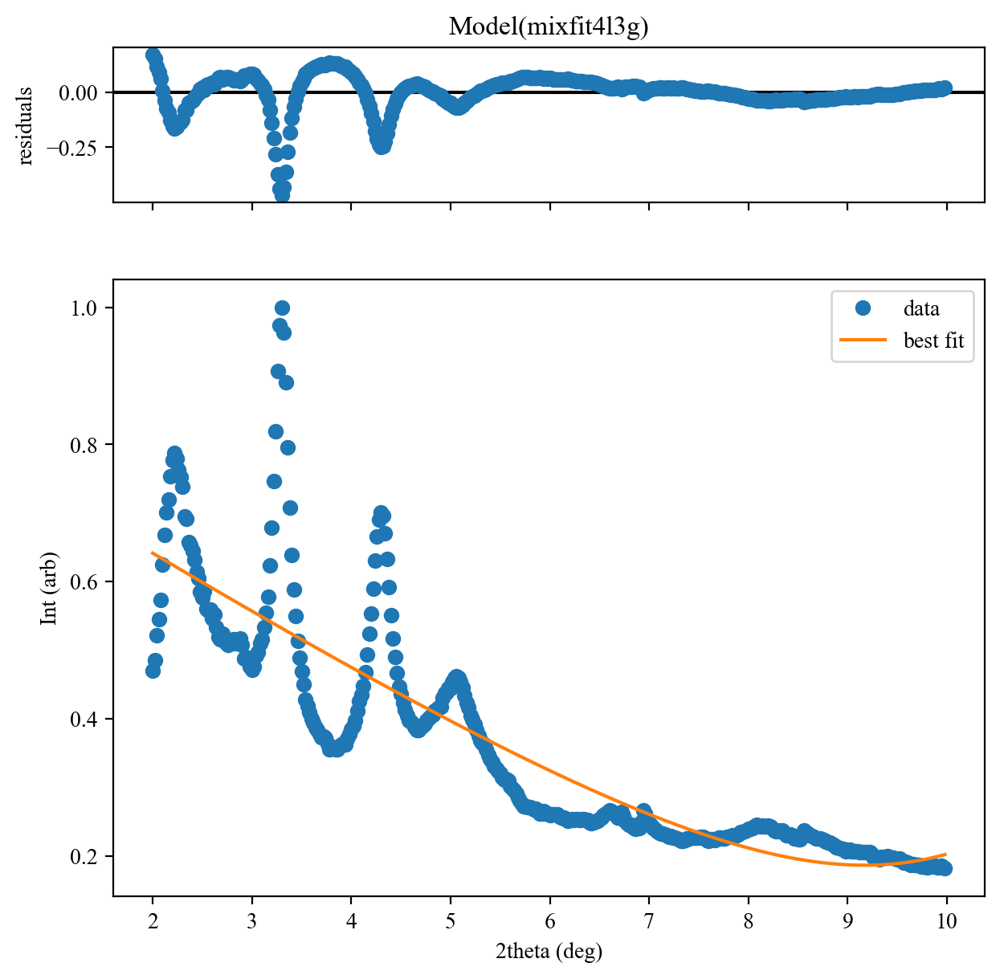

In [86]:
fig_1 = (results.plot(xlabel='2theta (deg)', ylabel='Int (arb)', numpoints = 1000))
# plt.ylim(0.55,1.05)
# plt.xlim(-2.5, 10.5)
plt.show(fig_1)

In [87]:

# m = results.params['m'].value
# B = results.params['B'].value
# a0 = results.params['a0'].value
# sigma0 = results.params['sigma0'].value
# x0 = results.params['x0'].value

# a1 = results.params['a1'].value
# sigma1 = results.params['sigma1'].value
# x1 = results.params['x1'].value

# a2 = results.params['a2'].value
# sigma2 = results.params['sigma2'].value
# x2 = results.params['x2'].value

# a3 = results.params['a3'].value
# sigma3 = results.params['sigma3'].value
# x3 = results.params['x3'].value

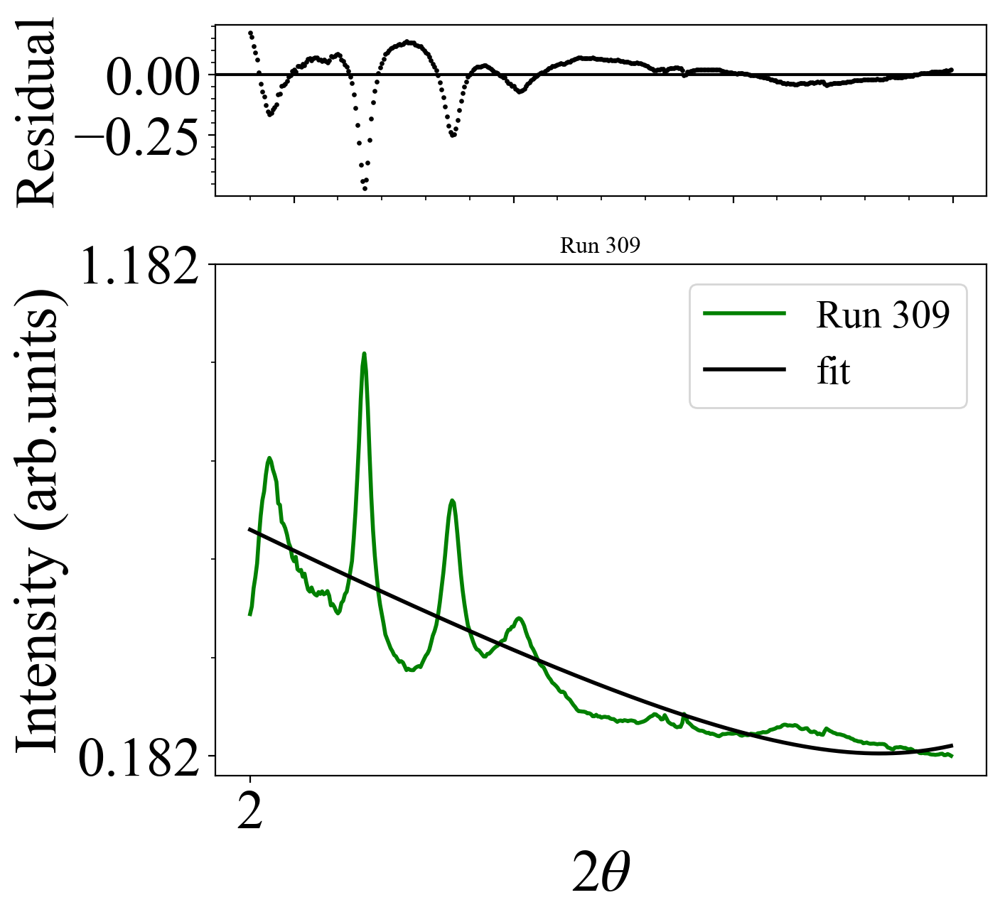

In [88]:
fig, axs = plt.subplots(2,1,figsize=(7,7), gridspec_kw={'height_ratios': [1, 3]})

axs[0].scatter(x[valid], results.eval(x = x[valid]) - y[valid], color = 'k', label = 'residual', s=2)
axs[0].axhline(y = 0.0, color = 'k', linestyle = '-')
axs[0].set_ylabel('Residual', fontsize = labelsize['ylabel']-2)
axs[0].set_xticklabels([])
# axs[0].set_ylim([-3,3])
axs[0].minorticks_on()
# axs[0].xticks(fontsize = ticksize['ytick'])
axs[0].tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
axs[1].plot(x[valid], y[valid], linewidth = 2, color = 'g', label = 'Run ' + str(Runs[i]))
axs[1].plot(x[valid], results.eval(x = x[valid]), linewidth = 2, color = 'k', label = 'fit')
# axs[1].plot(x[valid], m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2)), color = 'purple', linewidth = 2.5)
# axs[1].plot(x[valid], m*x + B + a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)), color = 'gold', linewidth = 2.5)
# axs[1].plot(x[valid], m*x + B + a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)), color = 'crimson', linewidth = 2.5)
plt.title('Run ' + str(Runs[i]))
axs[1].set_xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
axs[1].set_ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
axs[1].legend(fontsize = 20)
axs[1].tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
axs[1].set_xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
axs[1].set_yticks(np.arange(min(y[valid]), max(y[valid])+1, 1))
axs[1].minorticks_on()

In [89]:
# def mixfit2l5g(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, w3, a4, x4, w4, a5, x5, sigma5, a6, x6, sigma6):
#     return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4 *(w4/ ((x-x4)**2+w4**2)) + a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

# def mixfit2l5g(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
#     return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))

In [90]:
print(Runs[i])
results

309


## Fitting in a loop

In [91]:
Fancyfit_results_runs = dict.fromkeys(Run_key_list) 
for i, _ in enumerate(Runs):
    x = normalizedmax_results['Run ' + str(Runs[i])][0]
    y = normalizedmax_results['Run ' + str(Runs[i])][1]
    valid = ~(np.isnan(x)|np.isnan(y))
    init_params, results, error_fit = fit_sim(x[valid], y[valid], 'least_square', Full_fit_bounds_params , Runs[i]) #least_square basinhopping
    Fancyfit_results_runs['Run ' + str(Runs[i])] = results

# globals()['Fitresults_'+ 'Run_' + str(Runs[i])] = results

parameter names: ['m', 'B', 'a0', 'x0', 'sigma0', 'a1', 'x1', 'sigma1', 'a2', 'x2', 'sigma2', 'a3', 'x3', 'sigma3']
independent variables: ['x']
[[Model]]
    Model(fourgaussfit)
[[Fit Statistics]]
    # fitting method   = least_squares
    # function evals   = 1635
    # data points      = 400
    # variables        = 14
    chi-square         = 1.77266727
    reduced chi-square = 0.00459240
    Akaike info crit   = -2139.59168
    Bayesian info crit = -2083.71118
    R-squared          = 0.81400831
##  Warning: uncertainties could not be estimated:
    a0:      at initial value
    a0:      at boundary
    a1:      at initial value
    a1:      at boundary
    x1:      at initial value
    sigma1:  at initial value
    sigma1:  at boundary
    a2:      at initial value
    a2:      at boundary
    x2:      at initial value
    sigma2:  at initial value
    a3:      at initial value
    a3:      at boundary
    x3:      at initial value
    sigma3:  at initial value
    sigma3:  at bo

## saving fits


In [ ]:
# Assuming you have performed the fit for multiple runs and stored the results in Fancyfit_results_runs
# And you want to create a DataFrame containing fit results for all runs

# dfs = []
# for i, _ in enumerate(Runs):
#     fit_result_run_i = Fancyfit_results_runs['Run ' + str(Runs[i])]
#     param_names = list(fit_result_run_i.params.keys())
#     param_values = [param.value for param in fit_result_run_i.params.values()]
#     df_i = pd.DataFrame({'Parameter': param_names, 'Run ' + str(Runs[i]): param_values})
#     dfs.append(df_i)

# # Concatenate the DataFrames for each run
# fit_results_df = pd.concat(dfs, axis=1)

# # Save the DataFrame to a CSV file
# savedfilename = 'Pressure_series_comm. BSG'
# csv_file_name = 'fit_results_'+ savedfilename +'.csv'
# fit_results_df.to_csv(csv_file_name, index=False)


## saving fits plus r squared


In [ ]:
# fit_results_df

# Assuming you have performed the fit for multiple runs and stored the results in Fancyfit_results_runs
# And you have the model names and R2 values in lists model_names_list and r_squared_list

model_name_list = []
for i, _ in enumerate(Runs):
    model_name_list.append(Fancyfit_results_runs['Run ' + str(Runs[i])].model)

# model_name_list = []
# for i, _ in enumerate(Runs):
#     model_name_list.append(Full_fit_bounds_params['fit_type'][Runs[i]])

r_squared_list = []
for i, _ in enumerate(Runs):
    r_squared_list.append(Fancyfit_results_runs['Run ' + str(Runs[i])].rsquared)


dfs = []
for i, _ in enumerate(Runs):
    fit_result_run_i = Fancyfit_results_runs['Run ' + str(Runs[i])]
    param_names = list(fit_result_run_i.params.keys())
    param_values = [param.value for param in fit_result_run_i.params.values()]
    df_i = pd.DataFrame({
        'Parameter': param_names,
        'Run ' + str(Runs[i]) + ' Value': param_values,
        'Model': model_name_list[i],
        'R2': r_squared_list[i]
    })
    dfs.append(df_i)

# Concatenate the DataFrames for each run
fit_results_df = pd.concat(dfs, axis=1)


savepath = '/Users/meera94/Desktop/LCLS MEC LX99/MEC2022_results/fit_results/'
savedfilename = 'pressure_series_SLG_2'
csv_file_name = savepath +'fit_results_with_r2'+ savedfilename +'.csv'
fit_results_df.to_csv(csv_file_name, index=False)

In [108]:
#DIFFERENT METHODS OF FIT
# 
# ’leastsq’: Levenberg-Marquardt (default)
# ’least_squares’: Least-Squares minimization, using Trust Region Reflective method
# ’differential_evolution’: differential evolution
# ’brute’: brute force method
# ’basinhopping’: basinhopping
# ’ampgo’: Adaptive Memory Programming for Global Optimization
# ’nelder’: Nelder-Mead
# ’lbfgsb’: L-BFGS-B
# ’powell’: Powell
# ’cg’: Conjugate-Gradient
# ’newton’: Newton-CG
# ’cobyla’: Cobyla
# ’bfgs’: BFGS
# ’tnc’: Truncated Newton
# ’trust-ncg’: Newton-CG trust-region
# ’trust-exact’: nearly exact trust-region
# ’trust-krylov’: Newton GLTR trust-region
# ’trust-constr’: trust-region for constrained optimization
# ’dogleg’: Dog-leg trust-region
# ’slsqp’: Sequential Linear Squares Programming
# ’emcee’: Maximum likelihood via Monte-Carlo Markov Chain
# ’shgo’: Simplicial Homology Global Optimization
# ’dual_annealing’: Dual Annealing optimization

## Plotting Results

In [109]:
i = 3
Run_to_plot = Runs[i]
x = normalizedmax_results['Run ' + str(Runs[i])][0]
y = normalizedmax_results['Run ' + str(Runs[i])][1]
valid = ~(np.isnan(x)|np.isnan(y))

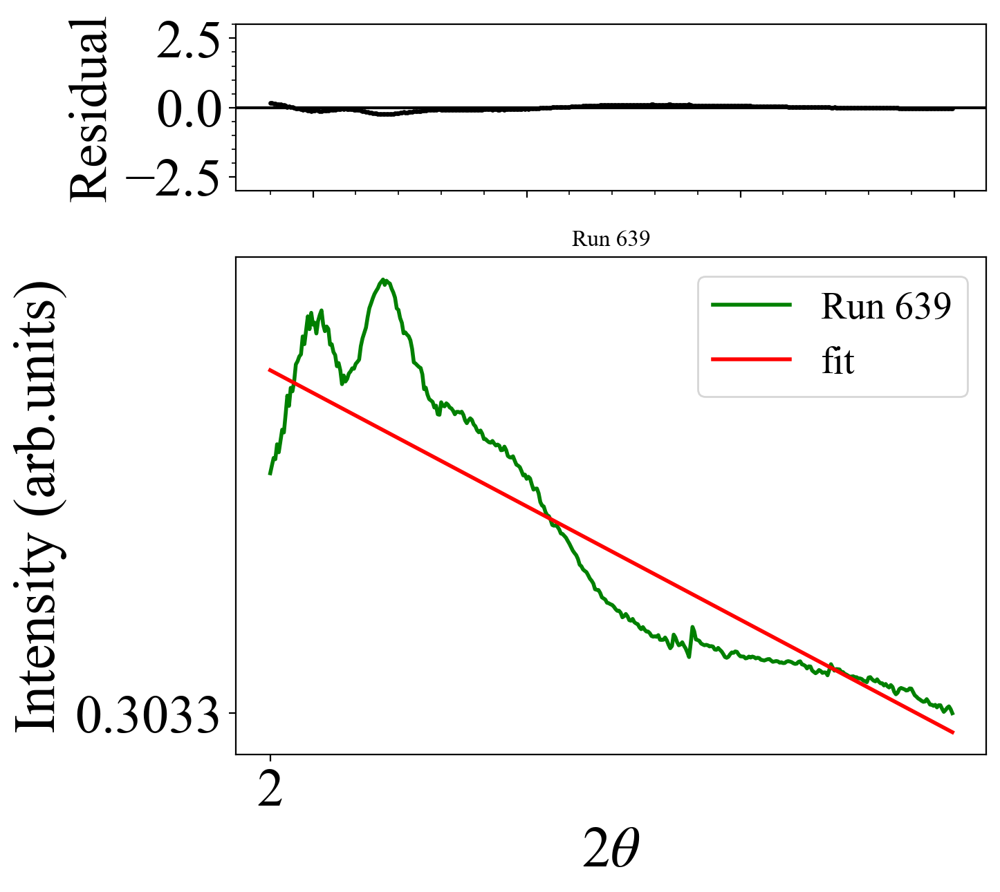

In [110]:
fig, axs = plt.subplots(2,1,figsize=(7,7), gridspec_kw={'height_ratios': [1, 3]})

axs[0].scatter(x[valid], Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]) - y[valid], color = 'k', label = 'residual', s=2)
axs[0].axhline(y = 0.0, color = 'k', linestyle = '-')
axs[0].set_ylabel('Residual', fontsize = labelsize['ylabel']-2)
axs[0].set_xticklabels([])
axs[0].set_ylim([-3,3])
axs[0].minorticks_on()
# axs[0].xticks(fontsize = ticksize['ytick'])
axs[0].tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
axs[1].plot(x[valid], y[valid], linewidth = 2, color = 'g', label = 'Run ' + str(Runs[i]))
axs[1].plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]), linewidth = 2, color = 'r', label = 'fit')
plt.title('Run ' + str(Runs[i]))
axs[1].set_xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
axs[1].set_ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
axs[1].legend(fontsize = 20)
axs[1].tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
axs[1].set_xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
axs[1].set_yticks(np.arange(min(y[valid]), max(y[valid])+1, 20))
axs[1].minorticks_on()
# save_fig_bool = True

# # Saving figure
# fig_name1 = 'SFig7_a.pdf'
# fig_name2 = 'SFig7_a.png'
# if save_fig_bool == True:
#     plt.savefig(RJ.concat(2).format(fig_save_dir, fig_name1), dpi = 300, bbox_inches = "tight")
#     plt.savefig(RJ.concat(2).format(fig_save_dir, fig_name2), dpi = 300, bbox_inches = "tight")
# else:
#     pass

plt.show()

save_fig_bool = False

In [111]:
i = 3
print('Run '+ str(Runs[i]))
Fancyfit_results_runs['Run '+ str(Runs[i])]

Run 639


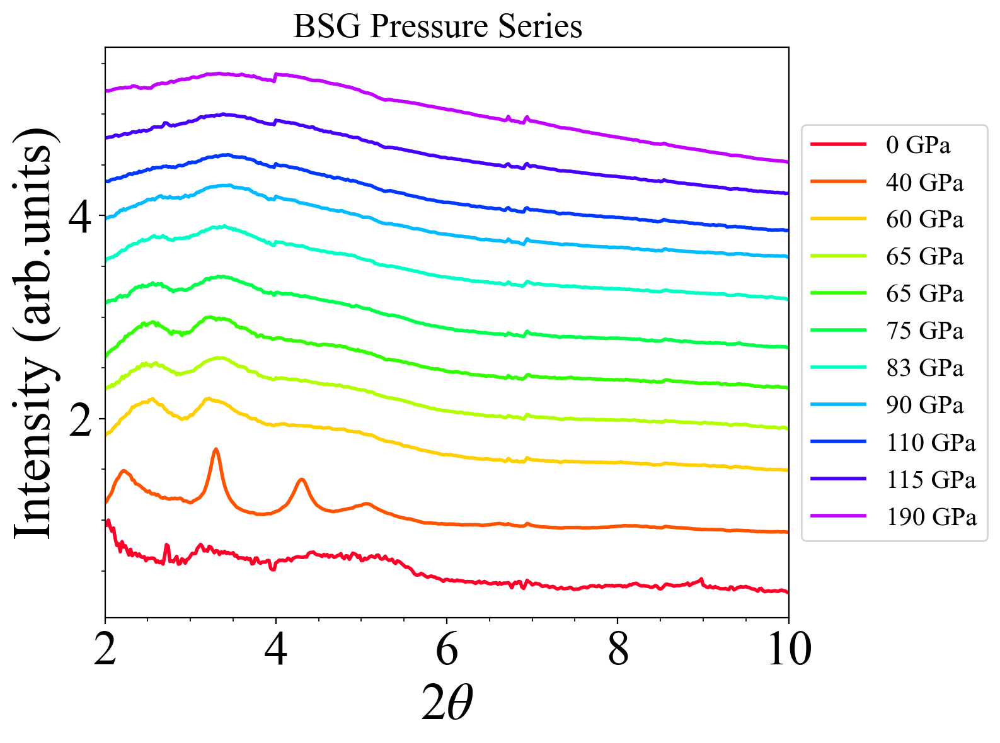

In [113]:

# cm(1*i/nm)
cm = cm = plt.get_cmap('gist_rainbow')
# cm = cm = plt.get_cmap('jet')
nm = len(Runs)
# offset = [0, 0.35
# , 0.5, 0.8, 1, 1.2, 1.3, 3, 3.2, 3.5, 3.9]
# offset = [0, 0.6, 1.1, 1.6, 2.1, 2.6, 3, 3.5, 4, 4.4,  4.9, 5.4, 3.5, 3.6, 1.75, 2, 2.2] #40 GPa
# offset = [0, 0.6, 1, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 2.95, 3.2, 3.5, 3.8, 4.1, 1.75, 2, 2.2]
offset = [0, 0.7, 1.2, 1.6, 2, 2.4, 2.9, 3.3, 3.6, 4, 4.4, 4.8, 5.1]#, 180, 190]
# offset = [0, 0.3, 0.7, 1, 1.4, 1.7, 2.3, 2.5]
# cm(1*i/nm)
clr = [ 'purple','darkviolet','rebeccapurple', 'blue','dodgerblue','c','lime', 'green','olive',  'yellow', 'coral','orangered', 'firebrick','deeppink','maroon', 'lightpink' , 'chocolate']# cm(1*i/nm)
clr = ['r','orange', 'gold', 'lime','c','blue', 'purple']

for i, _ in enumerate(Runs):
    Run_to_plot = Runs[i]
    x = normalizedmax_results['Run ' + str(Runs[i])][0]
    y = normalizedmax_results['Run ' + str(Runs[i])][1]
    valid = ~(np.isnan(x)|np.isnan(y))
    plt.plot(x[valid], y[valid] + offset[i] , linewidth = 2 , color = cm(1*i/nm) , label = str(Pressures[i])+' GPa')
    # plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid])+ offset[i] , '--', linewidth = 1.5, color = 'k')
    # plt.scatter(Fancyfit_results_runs['Run ' + str(Runs[i])].params['x0'].value,  Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = Fancyfit_results_runs['Run ' + str(Runs[i])].params['x0'].value)+ offset[i], s = 35, color = 'k',  zorder=3) # edgecolors='chocolate',
    # plt.scatter(Fancyfit_results_runs['Run ' + str(Runs[i])].params['x1'].value,  Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = Fancyfit_results_runs['Run ' + str(Runs[i])].params['x1'].value)+ offset[i], s = 35, color = 'k',   zorder=3)
    # plt.scatter(Fancyfit_results_runs['Run ' + str(Runs[i])].params['x2'].value,  Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = Fancyfit_results_runs['Run ' + str(Runs[i])].params['x2'].value)+ offset[i], s = 35, color = 'k',  zorder=3)
    
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# plt.legend(fontsize = 10)
plt.legend(fontsize = 15, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
plt.xlim(2, 10)
# plt.ylim(0, 4.5)
# plt.xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
plt.title('BSG Pressure Series  ', fontsize = 20)
# plt.set_xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
# plt.set_yticks(np.arange(min(y[valid]), max(y[valid])+1, 20))
plt.minorticks_on()

In [100]:
# Fancyfit_results_runs['Run '+ str(Runs[8])].params['x1'].value

## plotting individual components

In [101]:
def mixfit2l6g(x, B, m, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, w3, a4, x4, w4, a5, x5, sigma5, a6, x6, sigma6, a7, x7, sigma7):
    return  m*x + B + a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2))+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)) + a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)) + a3 *(w3/ ((x-x3)**2+w3**2))+ a4 *(w4/ ((x-x4)**2+w4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2)) + a7*np.exp(-4*np.log(2)*(x-x7)**2/(sigma7**2))

In [102]:
i = 2
m = Fancyfit_results_runs['Run '+ str(Runs[i])].params['m'].value
B = Fancyfit_results_runs['Run '+ str(Runs[i])].params['B'].value
a0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].value
# sigma0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma0'].value
w0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w0'].value
x0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x0'].value
a1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].value
# sigma1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma1'].value
w1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w1'].value
x1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x1'].value
a2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].value
# sigma2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma2'].value
w2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w2'].value
x2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x2'].value
# a3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
# sigma3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma3'].value
# x3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x3'].value
a3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
w3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w3'].value
x3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x3'].value
a4 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a4'].value
x4 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x4'].value
sigma4 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma4'].value
a5 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a5'].value
x5 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x5'].value
sigma5 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma5'].value
a6 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a6'].value
x6 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x6'].value
sigma6 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma6'].value
# a7 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a7'].value
# x7 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x7'].value
# sigma7 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma7'].value


KeyError: 'w0'

In [103]:
# i = 2
Run_to_plot = Runs[i]
x = normalizedmax_results['Run ' + str(Runs[i])][0]
y = normalizedmax_results['Run ' + str(Runs[i])][1]
valid = ~(np.isnan(x)|np.isnan(y))
plt.plot(x[valid], y[valid] , linewidth = 2 , color = 'g', label = str(time_delay[i])+' ns')
plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]) , '--', linewidth = 1.5, color = 'k')
plt.plot(x[valid], m*x + B, color = 'k', linewidth = 2.5)
# plt.plot(x[valid], m*x + B+ a0*np.exp(-4*np.log(2)*(x-x0)**2/(sigma0**2)), color = 'purple', linewidth = 2.5)
# plt.plot(x[valid], m*x + B+ a1*np.exp(-4*np.log(2)*(x-x1)**2/(sigma1**2)), color = 'gold', linewidth = 2.5)
# plt.plot(x[valid], m*x + B+ a2*np.exp(-4*np.log(2)*(x-x2)**2/(sigma2**2)) , color = 'crimson', linewidth = 2.5)
# plt.plot(x[valid], m*x + B+ a3*np.exp(-4*np.log(2)*(x-x3)**2/(sigma3**2)) , color = 'lightcoral', linewidth = 2.5)
plt.plot(x[valid],  a0 *(w0/ ((x-x0)**2+w0**2)) , color = 'purple', linewidth = 2.5)
plt.plot(x[valid],  a1 *(w1/ ((x-x1)**2+w1**2)) , color = 'gold', linewidth = 2.5)
plt.plot(x[valid],  a2 *(w2/ ((x-x2)**2+w2**2)) , color = 'crimson', linewidth = 2.5)
plt.plot(x[valid],  a3 *(w3/ ((x-x3)**2+w3**2)) , color = 'darkorange', linewidth = 2.5)
# plt.plot(x[valid], a4 *(w4/ ((x-x4)**2+w4**2)), color = 'maroon', linewidth = 2.5)
plt.plot(x[valid],   a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2)), color = 'deeppink', linewidth = 2.5)
plt.plot(x[valid],   a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)), color = 'navy', linewidth = 2.5)
plt.plot(x[valid],  a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2)) , color = 'lightcoral', linewidth = 2.5)
# plt.plot(x[valid], a7*np.exp(-4*np.log(2)*(x-x7)**2/(sigma7**2)) , color = 'r', linewidth = 2.5)

# plt.title('Run ' + str(Runs[i]))
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# plt.legend(fontsize = 15)
plt.tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
plt.xlim(10, 70)
plt.xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
plt.title('XRD comm. BSG @ 40 GPa, Run ' + str(Runs[i]), fontsize = 20)
# plt.set_xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
# plt.set_yticks(np.arange(min(y[valid]), max(y[valid])+1, 20))
plt.minorticks_on()

NameError: name 'time_delay' is not defined

In [104]:
# def mixfit4l3g(x, B, m, a0, x0, w0, a1, x1, w1, a2, x2, w2, a3, x3, w3, a4, x4, sigma4, a5, x5, sigma5, a6, x6, sigma6):
#     return  m*x + B +  a0 *(w0/ ((x-x0)**2+w0**2)) + a1 *(w1/ ((x-x1)**2+w1**2)) + a2 *(w2/ ((x-x2)**2+w2**2)) +  a3 *(w3/ ((x-x3)**2+w3**2)) + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2))+ a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)) + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2))


In [118]:
i = 3
m = Fancyfit_results_runs['Run '+ str(Runs[i])].params['m'].value
B = Fancyfit_results_runs['Run '+ str(Runs[i])].params['B'].value
a0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].value
w0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w0'].value
x0 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x0'].value
a1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].value
w1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w1'].value
x1 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x1'].value
a2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].value
w2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w2'].value
x2 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x2'].value
a3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
w3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['w3'].value
x3 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x3'].value
a4 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a4'].value
x4 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x4'].value
sigma4 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma4'].value
a5 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a5'].value
x5 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x5'].value
sigma5 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma5'].value
a6 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a6'].value
x6 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x6'].value
sigma6 = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma6'].value


KeyError: 'w0'

NameError: name 'w0' is not defined

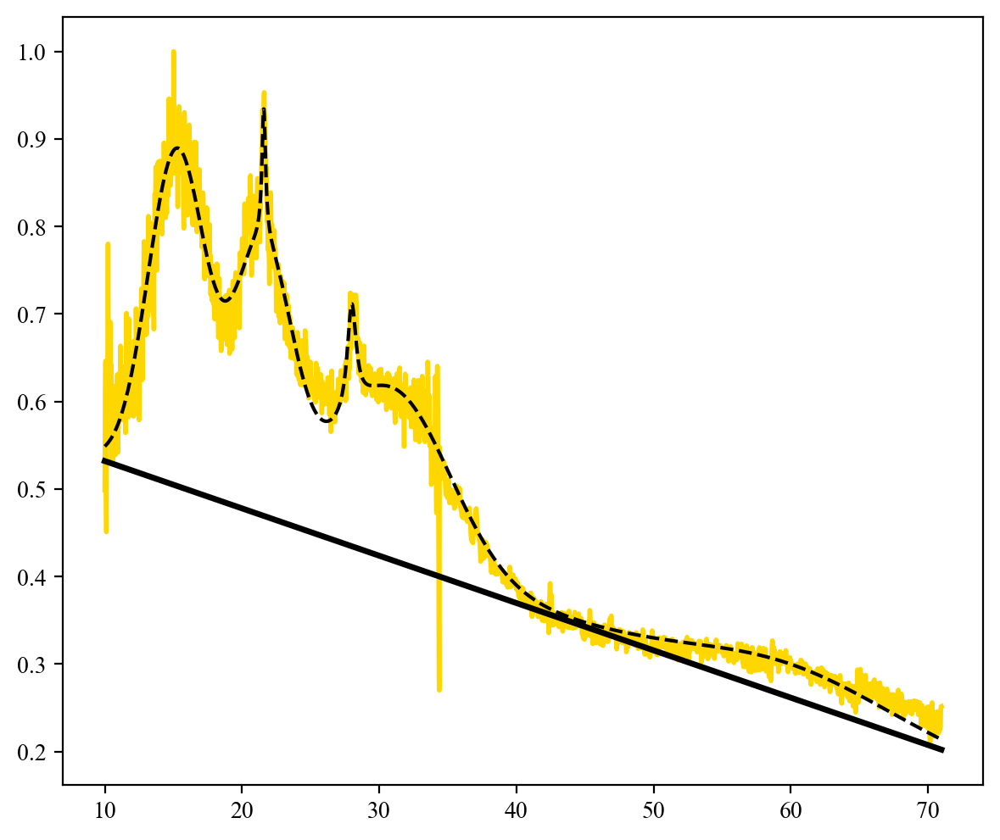

In [119]:
i = 3
Run_to_plot = Runs[i]
x = normalizedmax_results['Run ' + str(Runs[i])][0]
y = normalizedmax_results['Run ' + str(Runs[i])][1]
valid = ~(np.isnan(x)|np.isnan(y))
plt.plot(x[valid], y[valid] , linewidth = 2 , color = clr [i], label = str(time_delay[i])+' ns')
plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]) , '--', linewidth = 1.5, color = 'k')
plt.plot(x[valid], m*x + B, color = 'k', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a0 *(w0/ ((x-x0)**2+w0**2)), color = 'purple', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a1 *(w1/ ((x-x1)**2+w1**2)), color = 'gold', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a2 *(w2/ ((x-x2)**2+w2**2)), color = 'crimson', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a3 *(w3/ ((x-x3)**2+w3**2)), color = 'darkorange', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a4*np.exp(-4*np.log(2)*(x-x4)**2/(sigma4**2)), color = 'maroon', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a5*np.exp(-4*np.log(2)*(x-x5)**2/(sigma5**2)), color = 'deeppink', linewidth = 2.5)
plt.plot(x[valid], m*x + B + a6*np.exp(-4*np.log(2)*(x-x6)**2/(sigma6**2)), color = 'lightcoral', linewidth = 2.5)

# plt.title('Run ' + str(Runs[i]))
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
plt.legend(fontsize = 15)
plt.tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
plt.xlim(10, 70)
plt.xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
plt.title('XRD BSG @ 40 GPa', fontsize = 20)
# plt.set_xticks(np.arange(min(x[valid]), max(x[valid])+1, 10))
# plt.set_yticks(np.arange(min(y[valid]), max(y[valid])+1, 20))
plt.minorticks_on()

In [315]:
# fig, axs = plt.subplots(8, 1, figsize=(7, 7), gridspec_kw={'height_ratios': [1, 1, 1, 1, 1, 1, 1, 1]})

# for i, _ in enumerate(Runs):
#     Run_to_plot = Runs[i]
#     x = normalized_results['Run ' + str(Runs[i])][0]
#     y = normalized_results['Run ' + str(Runs[i])][1]
#     valid = ~(np.isnan(x) | np.isnan(y))
    
#     axs[i].plot(x[valid], y[valid], linewidth=2, color='g', label='Run ' + str(Runs[i]))
#     axs[i].plot(x[valid], Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x=x[valid]), linewidth=2, color='r', label='fit')

#     axs[i].set_xlabel('2$\\theta$', fontsize=labelsize['xlabel'])
#     axs[i].set_ylabel('Intensity (arb.units)', fontsize=labelsize['ylabel'])
#     axs[i].tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
#     axs[i].legend(fontsize=5)

# plt.tight_layout()
# plt.show()


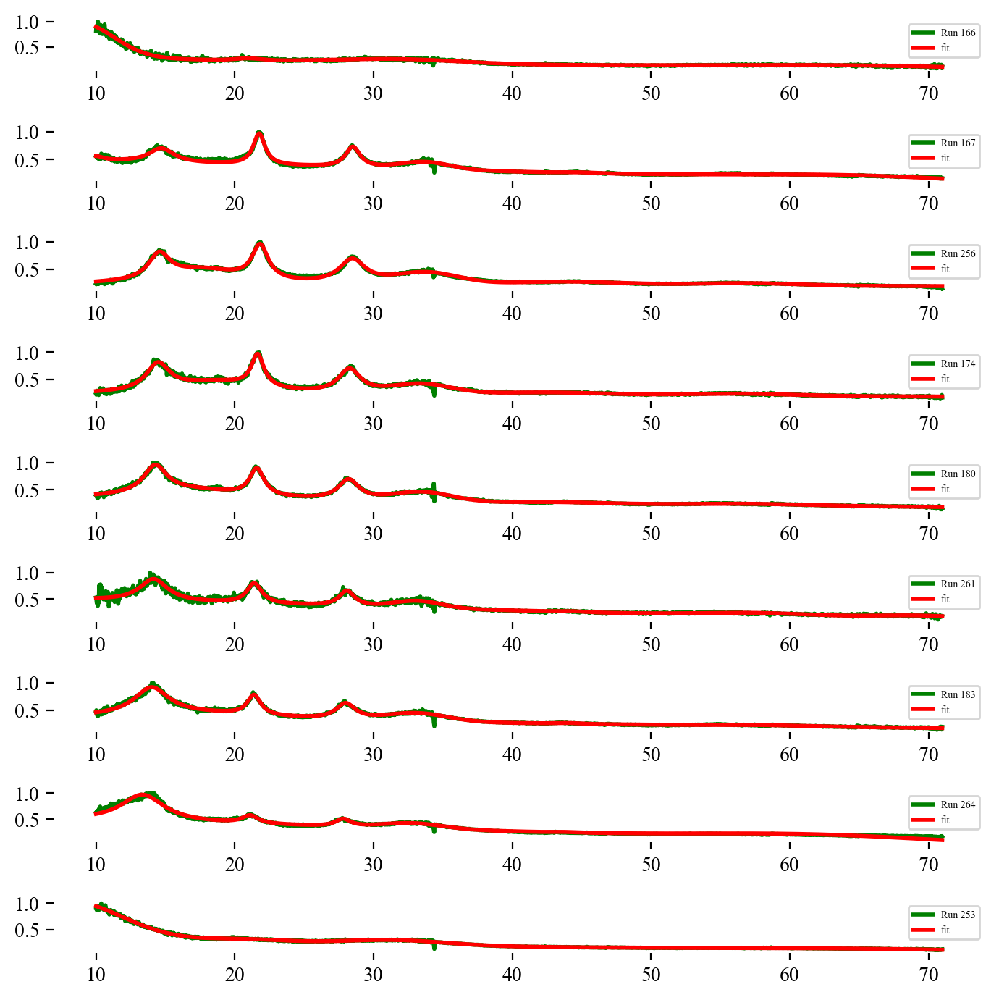

In [322]:
fig, axs = plt.subplots(len(Runs), 1, figsize=(7, 7), gridspec_kw={'height_ratios': [1] * len(Runs)})

for i, _ in enumerate(Runs):
    Run_to_plot = Runs[i]
    x = normalizedmax_results['Run ' + str(Runs[i])][0]
    y = normalizedmax_results['Run ' + str(Runs[i])][1]
    valid = ~(np.isnan(x) | np.isnan(y))
    
    axs[i].plot(x[valid], y[valid], linewidth=2, color='g', label='Run ' + str(Runs[i]))
    axs[i].plot(x[valid], Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x=x[valid]), linewidth=2, color='r', label='fit')
    axs[i].legend(fontsize=5)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['bottom'].set_visible(False)
    axs[i].spines['left'].set_visible(False)

# axs[i].set_xlabel('2$\\theta$', fontsize=labelsize['xlabel'])
# axs[i].set_ylabel('Intensity (arb.units)', fontsize=labelsize['ylabel'])
# axs[i].tick_params(axis='both', which='major', labelsize=ticksize['ytick'])
plt.tight_layout()
plt.show()


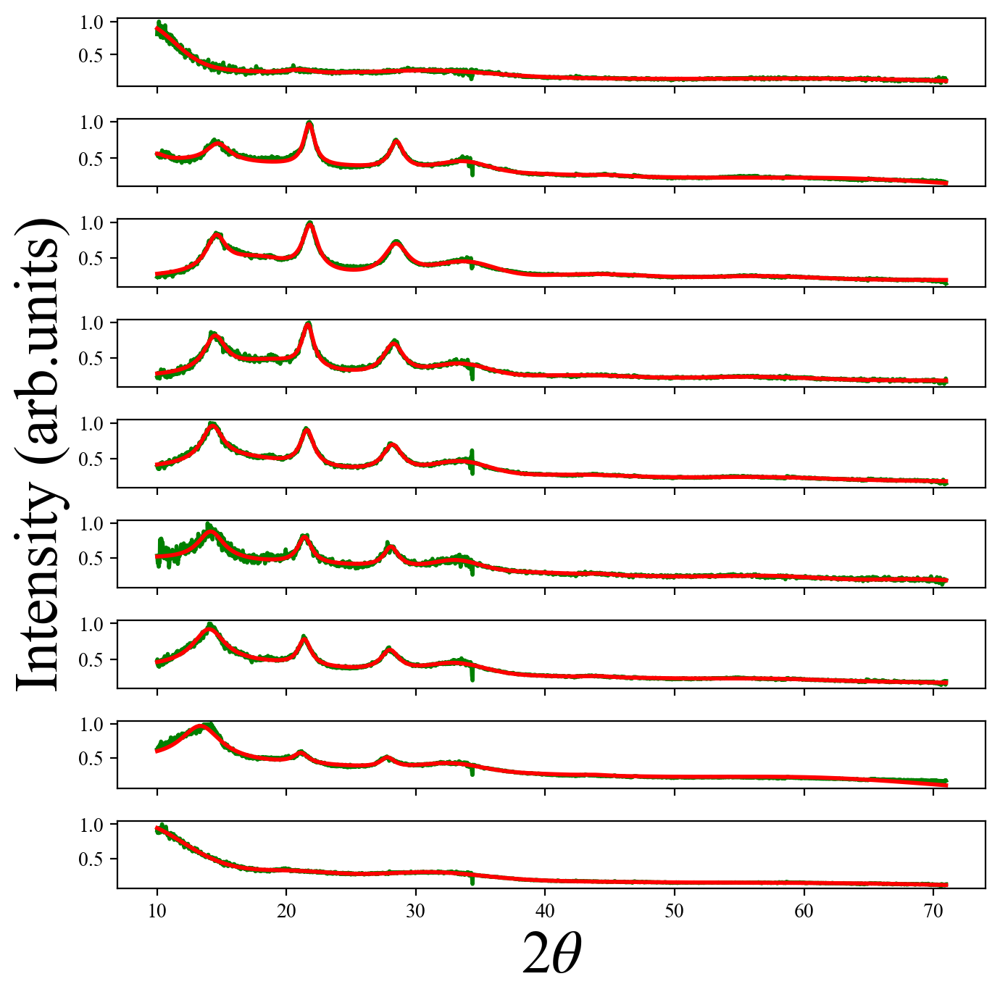

In [323]:
fig, axs = plt.subplots(len(Runs), 1, figsize=(7, 7), sharex=True)

for i, _ in enumerate(Runs):
    Run_to_plot = Runs[i]
    x = normalizedmax_results['Run ' + str(Runs[i])][0]
    y = normalizedmax_results['Run ' + str(Runs[i])][1]
    valid = ~(np.isnan(x) | np.isnan(y))
    
    axs[i].plot(x[valid], y[valid], linewidth=2, color='g', label='Run ' + str(Runs[i]))
    axs[i].plot(x[valid], Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x=x[valid]), linewidth=2, color='r', label='fit')
    axs[4].set_ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# axs[0].spines['top'].set_visible(False)
# axs[1].spines['top'].set_visible(False)
# axs[1].spines['right'].set_visible(False)
# axs[1].spines['bottom'].set_visible(False)
# axs[1].spines['left'].set_visible(False)
# axs[i].spines['top'].set_visible(False)
# axs[i].spines['right'].set_visible(False)
# axs[i].spines['bottom'].set_visible(False)
# axs[i].spines['left'].set_visible(False)

plt.xlabel('2$\\theta$', fontsize=labelsize['xlabel'])
# plt.ylabel('Intensity', fontsize=labelsize['ylabel'])
plt.tight_layout()
plt.show()


## Plotting results 

## Peak position versus timedelay

In [318]:
# Fancyfit_results_runs['Run '+ str(Runs[8])].params['x1'].value

In [319]:
# pressures

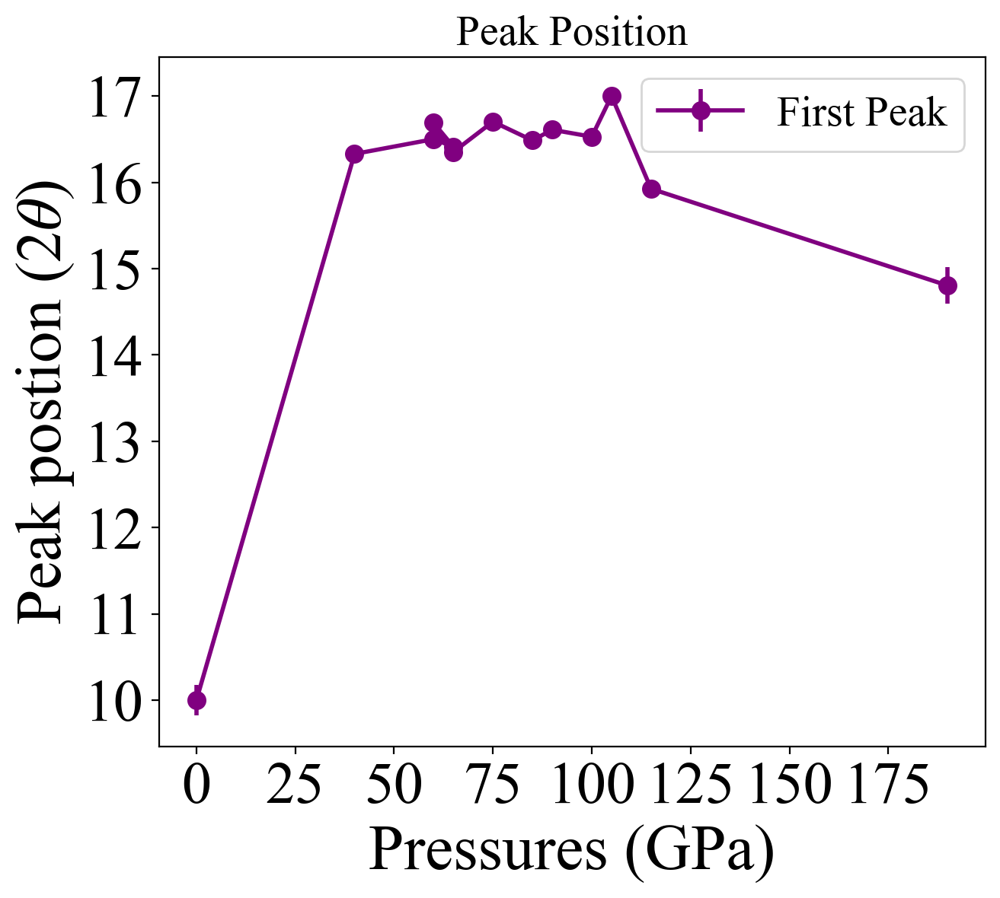

In [112]:

first_peak_pos_delay_x = []
first_peak_pos_delay_y = []
first_peak_pos_delay_err = []

second_peak_pos_delay_y = []
second_peak_pos_delay_err = []

third_peak_pos_delay_y = []
third_peak_pos_delay_err = []

four_peak_pos_delay_y = []
four_peak_pos_delay_err = []


for i, _ in enumerate(Runs):
    amp1_x = Pressures[i]
    amp1_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x0'].value
    amp1_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x0'].stderr
    first_peak_pos_delay_x.append(amp1_x)
    first_peak_pos_delay_y.append(amp1_y)
    first_peak_pos_delay_err.append(amp1_y_err)
    
for i, _ in enumerate(Runs):
    amp2_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x1'].value
    amp2_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x1'].stderr
    second_peak_pos_delay_y.append(amp2_y)
    second_peak_pos_delay_err.append(amp2_y_err)

# for i, _ in enumerate(Runs):
#     amp3_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x2'].value
#     amp3_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x2'].stderr
#     third_peak_pos_delay_y.append(amp3_y)
#     third_peak_pos_delay_err.append(amp3_y_err)

# for i, _ in enumerate(Runs):
#     amp4_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x3'].value
#     amp4_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['x3'].stderr
#     four_peak_pos_delay_y.append(amp4_y)
#     four_peak_pos_delay_err.append(amp4_y_err)


plt.errorbar(first_peak_pos_delay_x, first_peak_pos_delay_y, yerr=first_peak_pos_delay_err, linewidth= 2,  color = 'purple', ecolor = 'purple', marker = 'o', markersize = 8, label = 'First Peak')
# plt.errorbar(first_peak_pos_delay_x, second_peak_pos_delay_y, yerr=second_peak_pos_delay_err, linewidth= 2 , color = 'gold', ecolor = 'gold',marker = 'o', markersize = 8, label='Second peak')
# plt.errorbar(first_peak_pos_delay_x, third_peak_pos_delay_y, yerr=third_peak_pos_delay_err, linewidth= 2, color = 'orange', ecolor = 'orange', marker = 'o' , markersize = 8,  label='Third peak')
# plt.errorbar(first_peak_pos_delay_x, four_peak_pos_delay_y, yerr=four_peak_pos_delay_err, linewidth= 2 , color = 'r', ecolor = 'r' , marker='o',markersize = 8,label='Fourth peak')



plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('Pressures (GPa)', fontsize = labelsize['xlabel'])
plt.ylabel('Peak postion (2$\\theta$)', fontsize = labelsize['ylabel'])
plt.legend( fontsize = 20)
# plt.legend(fontsize = 15, loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Peak Position', fontsize = 20)
# plt.xlim(40,110)
# plt.ylim(16,17)
plt.show()



In [96]:
first_peak_pos_delay_x

[40, 55, 60, 65, 75, 90, 100, 105, 110, 115]

## Peak amplitudes versus time delay

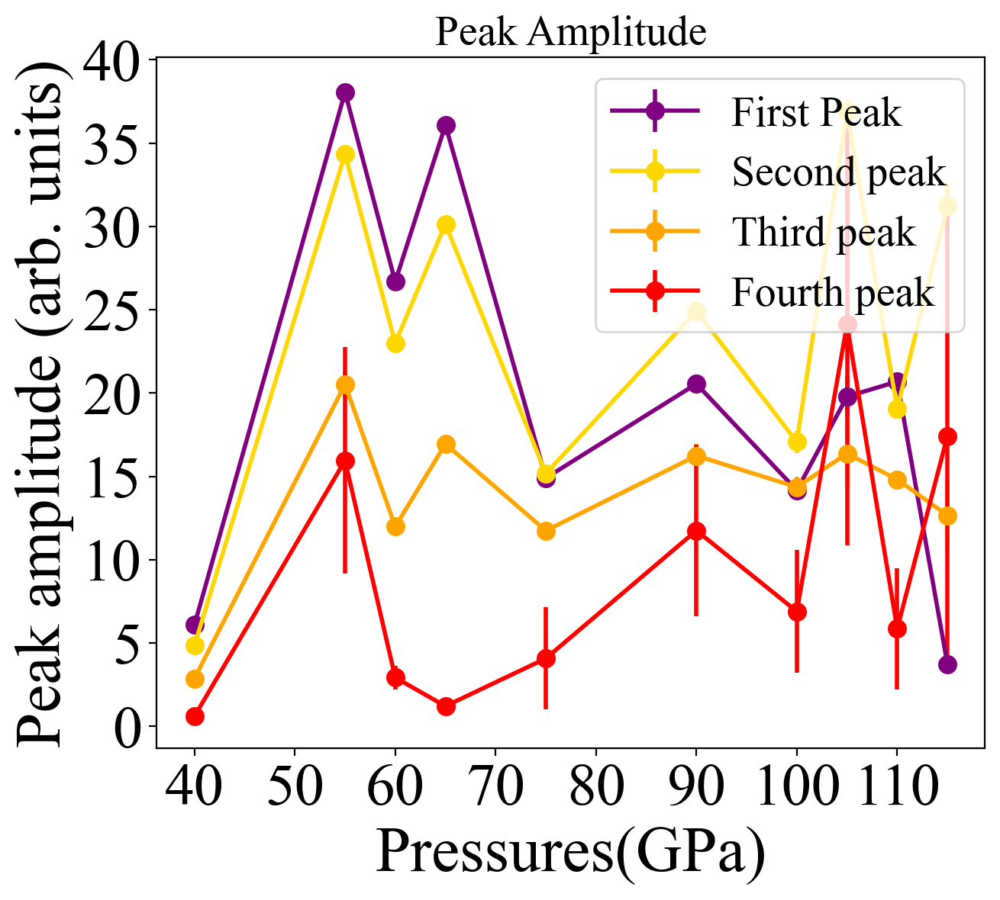

In [102]:

first_peak_amp_delay_x = []
first_peak_amp_delay_y = []
first_peak_amp_delay_err = []

second_peak_amp_delay_y = []
second_peak_amp_delay_err = []

third_peak_amp_delay_y = []
third_peak_amp_delay_err = []

four_peak_amp_delay_y = []
four_peak_amp_delay_err = []


for i, _ in enumerate(Runs):
    amp1_x = pressures[i]
    amp1_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].value
    amp1_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].stderr
    first_peak_amp_delay_x.append(amp1_x)
    first_peak_amp_delay_y.append(amp1_y)
    first_peak_amp_delay_err.append(amp1_y_err)
    
for i, _ in enumerate(Runs):
    amp2_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].value
    amp2_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].stderr
    second_peak_amp_delay_y.append(amp2_y)
    second_peak_amp_delay_err.append(amp2_y_err)

for i, _ in enumerate(Runs):
    amp3_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].value
    amp3_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].stderr
    third_peak_amp_delay_y.append(amp3_y)
    third_peak_amp_delay_err.append(amp3_y_err)

for i, _ in enumerate(Runs):
    amp4_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
    amp4_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].stderr
    four_peak_amp_delay_y.append(amp4_y)
    four_peak_amp_delay_err.append(amp4_y_err)


plt.errorbar(first_peak_amp_delay_x, first_peak_amp_delay_y, yerr=first_peak_amp_delay_err, linewidth= 2,  color = 'purple', ecolor = 'purple', marker = 'o', markersize = 8, label = 'First Peak')
plt.errorbar(first_peak_amp_delay_x, second_peak_amp_delay_y, yerr=second_peak_amp_delay_err, linewidth= 2 , color = 'gold', ecolor = 'gold',marker = 'o', markersize = 8, label='Second peak')
plt.errorbar(first_peak_amp_delay_x, third_peak_amp_delay_y, yerr=third_peak_amp_delay_err, linewidth= 2, color = 'orange', ecolor = 'orange', marker = 'o' , markersize = 8,  label='Third peak')
plt.errorbar(first_peak_amp_delay_x, four_peak_amp_delay_y, yerr=four_peak_amp_delay_err, linewidth= 2 , color = 'r', ecolor = 'r' , marker='o',markersize = 8,label='Fourth peak')

plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('Pressures(GPa)', fontsize = labelsize['xlabel'])
plt.ylabel('Peak amplitude (arb. units)', fontsize = labelsize['ylabel'])
plt.legend( fontsize = 20)
plt.title('Peak Amplitude', fontsize = 20)
# plt.xlim(0,6)
# plt.ylim(16,17)
plt.show()



## FWHM as a function of time delay

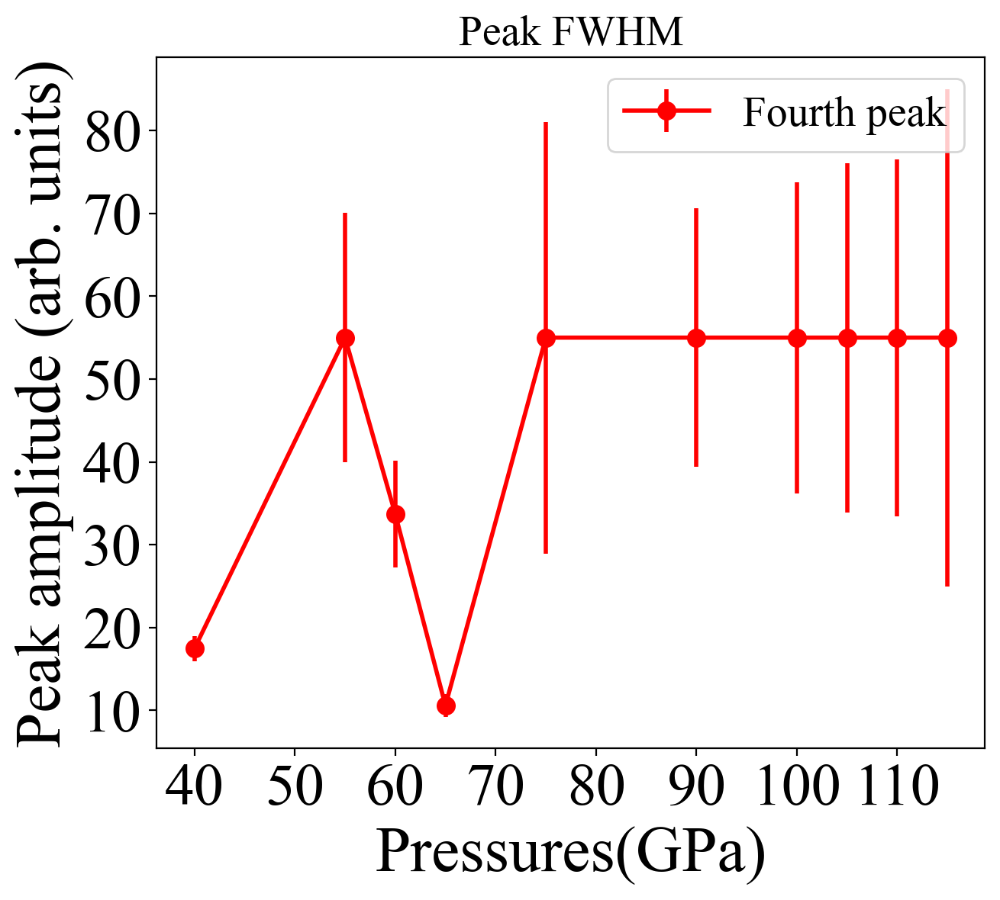

In [107]:

first_peak_FWHM_delay_x = []
first_peak_FWHM_delay_y = []
first_peak_FWHM_delay_err = []

second_peak_FWHM_delay_y = []
second_peak_FWHM_delay_err = []

third_peak_FWHM_delay_y = []
third_peak_FWHM_delay_err = []

four_peak_FWHM_delay_y = []
four_peak_FWHM_delay_err = []


for i, _ in enumerate(Runs):
    amp1_x = pressures[i]
    amp1_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma0'].value
    amp1_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma0'].stderr
    first_peak_FWHM_delay_x.append(amp1_x)
    first_peak_FWHM_delay_y.append(amp1_y)
    first_peak_FWHM_delay_err.append(amp1_y_err)
    
for i, _ in enumerate(Runs):
    amp2_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma1'].value
    amp2_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma1'].stderr
    second_peak_FWHM_delay_y.append(amp2_y)
    second_peak_FWHM_delay_err.append(amp2_y_err)

for i, _ in enumerate(Runs):
    amp3_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma2'].value
    amp3_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma2'].stderr
    third_peak_FWHM_delay_y.append(amp3_y)
    third_peak_FWHM_delay_err.append(amp3_y_err)

for i, _ in enumerate(Runs):
    amp4_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma3'].value
    amp4_y_err = Fancyfit_results_runs['Run '+ str(Runs[i])].params['sigma3'].stderr
    four_peak_FWHM_delay_y.append(amp4_y)
    four_peak_FWHM_delay_err.append(amp4_y_err)


# plt.errorbar(first_peak_FWHM_delay_x, first_peak_FWHM_delay_y, yerr=first_peak_FWHM_delay_err, linewidth= 2,  color = 'purple', ecolor = 'purple', marker = 'o', markersize = 8, label = 'First Peak')
# plt.errorbar(first_peak_FWHM_delay_x, second_peak_FWHM_delay_y, yerr=second_peak_FWHM_delay_err, linewidth= 2 , color = 'gold', ecolor = 'gold',marker = 'o', markersize = 8, label='Second peak')
# plt.errorbar(first_peak_FWHM_delay_x, third_peak_FWHM_delay_y, yerr=third_peak_FWHM_delay_err, linewidth= 2, color = 'orange', ecolor = 'orange', marker = 'o' , markersize = 8,  label='Third peak')
plt.errorbar(first_peak_FWHM_delay_x, four_peak_FWHM_delay_y, yerr=four_peak_FWHM_delay_err, linewidth= 2 , color = 'r', ecolor = 'r' , marker='o',markersize = 8,label='Fourth peak')

plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('Pressures(GPa)', fontsize = labelsize['xlabel'])
plt.ylabel('Peak amplitude (arb. units)', fontsize = labelsize['ylabel'])
plt.legend( fontsize = 20)
plt.title('Peak FWHM', fontsize = 20)
# plt.xlim(0,6)
# plt.ylim(16,17)
plt.show()


## Peak amplitudes ratio versus time delay

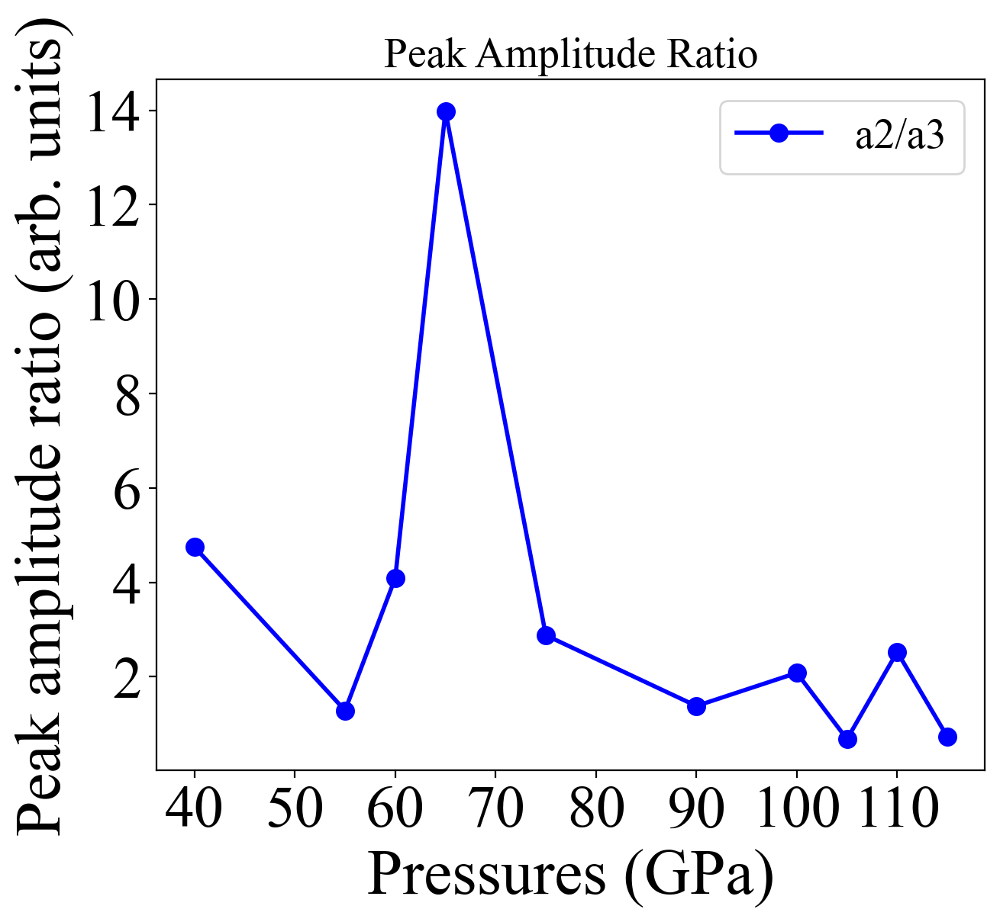

In [114]:
first_second_peak_ampratio_delay_x = []
first_second_peak_ampratio_delay_y = []
first_third_peak_ampratio_delay_y= []
first_fourth_peak_ampratio_delay_y = []
second_third_peak_ampratio_delay_y = []
second_fourth_peak_ampratio_delay_y = []
third_fourth_peak_ampratio_delay_y = []



for i, _ in enumerate(Runs):
    amp_x = pressures[i]
    amp1_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].value/Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].value
    amp2_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].value/Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].value
    amp3_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a0'].value/Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
    amp4_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].value/Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].value
    amp5_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a1'].value/Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
    amp6_y = Fancyfit_results_runs['Run '+ str(Runs[i])].params['a2'].value/Fancyfit_results_runs['Run '+ str(Runs[i])].params['a3'].value
    first_second_peak_ampratio_delay_x.append(amp_x)
    first_second_peak_ampratio_delay_y.append(amp1_y)
    first_third_peak_ampratio_delay_y.append(amp2_y)
    first_fourth_peak_ampratio_delay_y.append(amp3_y)
    second_third_peak_ampratio_delay_y.append(amp4_y)
    second_fourth_peak_ampratio_delay_y.append(amp5_y)
    third_fourth_peak_ampratio_delay_y.append(amp6_y)

clr = ['r', 'k', 'g','c', 'b', 'gold', 'purple', 'orange', 'magenta']

# plt.plot(first_second_peak_ampratio_delay_x, first_second_peak_ampratio_delay_y, linewidth= 2,  color = 'purple', marker = 'o', markersize = 8, label = 'a0/a1')
# plt.plot(first_second_peak_ampratio_delay_x, first_third_peak_ampratio_delay_y , linewidth= 2 , color = 'gold',marker = 'o', markersize = 8, label='a0/a2')
# plt.plot(first_second_peak_ampratio_delay_x, first_fourth_peak_ampratio_delay_y,  linewidth= 2, color = 'orange',  marker = 'o' , markersize = 8,  label='a0/a3')
# plt.plot(first_second_peak_ampratio_delay_x, second_third_peak_ampratio_delay_y,  linewidth= 2 , color = 'r',  marker='o',markersize = 8,label='a1/a2')
# plt.plot(first_second_peak_ampratio_delay_x, second_fourth_peak_ampratio_delay_y,  linewidth= 2 , color = 'g' , marker='o',markersize = 8,label='a1/a3')
plt.plot(first_second_peak_ampratio_delay_x, third_fourth_peak_ampratio_delay_y,  linewidth= 2 , color = 'blue' , marker='o',markersize = 8,label='a2/a3')



plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('Pressures (GPa)', fontsize = labelsize['xlabel'])
plt.ylabel('Peak amplitude ratio (arb. units)', fontsize = labelsize['ylabel'])
plt.legend( fontsize = 20)
plt.title('Peak Amplitude Ratio', fontsize = 20)
# plt.xlim(0,6)
# plt.ylim(16,17)
plt.show()



In [96]:
first_peak_position_delay
# first_peak_position_delay_err

[[0, 11.106499975301398],
 [0.5, 16.328743241297442],
 [2.3, 16.446051268052948],
 [2.3, 16.576993324191537],
 [3.3, 16.32478972934302],
 [4, 16.19643862143658],
 [6.7, 14.105810988148944],
 [24, 11.165759206057116],
 [104, 11.142264066470926]]

In [572]:

# fig_1 = (results.plot(xlabel='2theta (deg)', ylabel='Int (arb)', numpoints = 1000))
# # plt.ylim(0.55,1.05)
# # plt.xlim(-2.5, 10.5)
# plt.show(fig_1)

## Two Lorentz Two Gauss Fit

In [ ]:
# i = 0
# Run_to_plot = Runs[i]
# x = normalized_results['Run ' + str(Runs[i])][0]
# y = normalized_results['Run ' + str(Runs[i])][1]
# valid = ~(np.isnan(x)|np.isnan(y))
# plt.plot(x[valid], y[valid], linewidth = 2, color = 'g', label = 'Run ' + str(Runs[i]))
# plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]), linewidth = 2, color = 'r', label = 'fit')
# plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]) - y[valid], linewidth = 2, color = 'r', label = 'residual')


# plt.title('Run ' + str(Runs[i]))
# plt.xticks(fontsize = ticksize['xtick'])
# plt.yticks(fontsize = ticksize['ytick'])
# plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
# plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# plt.legend(fontsize = 20)
# plt.show()


In [222]:
def fourgaussfit_old(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return  m*x + B + a0*np.exp(-(x-x0)**2/(2*sigma0**2))+a1*np.exp(-(x-x1)**2/(2*sigma1**2))+a2*np.exp(-(x-x2)**2/(2*sigma2**2))+a3*np.exp(-(x-x3)**2/(2*sigma3**2))


def twolorenfit(x, B, a0, x0, sigma0, a1, x1, sigma1):
    return B + (a0/(((x-x0)/sigma0)**2+1))**2 + (a1/(((x-x1)/sigma1)**2+1))**2

In [223]:
def mixfit(x, m, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return  m*x + B + (a0/(((x-x0)/sigma0)**2+1))**2 + (a1/(((x-x1)/sigma1)**2+1))**2+ a2*np.exp(-(x-x2)**2/(2*sigma2**2))+a3*np.exp(-(x-x3)**2/(2*sigma3**2))

In [224]:

          ##        m     B     A0     P0     w0   A1     P1    w1    A2      P2     w2   A3      P3     w3
p0 =     np.array([-0.18, 16,  50,    17,    2,   10,    21,   2,    30,     32,    5,   10,     60,     20])#,   47,   1])
B_low =  np.array([-3,    0,   0,    15,    0,   0,     20,   0,    10,     28,    3,   0,      55,     10])#,   47,   0])
B_high = np.array([0,     50,  100,   18,    5,   50,    23,   5,   50,     35,    10,  30,     68,    50])#,   51,   3])
Bounds = (B_low,B_high)

[-0.44771828 24.32272909  6.8597178  16.30674968  2.94323283  5.44560047
 21.29106099  2.79194188 20.39540147 29.15839199  5.25503252 23.96875947
 68.         40.86386724]
[5.86088210e-01 2.66234357e+01 1.53126088e-02 6.24016940e-03
 1.91066371e-02 1.83341874e-02 9.84902972e-03 3.00427079e-02
 3.94542832e-01 4.79554989e-02 7.45101809e-02 6.64354322e+01
 3.94932789e+01 4.67996190e+01]


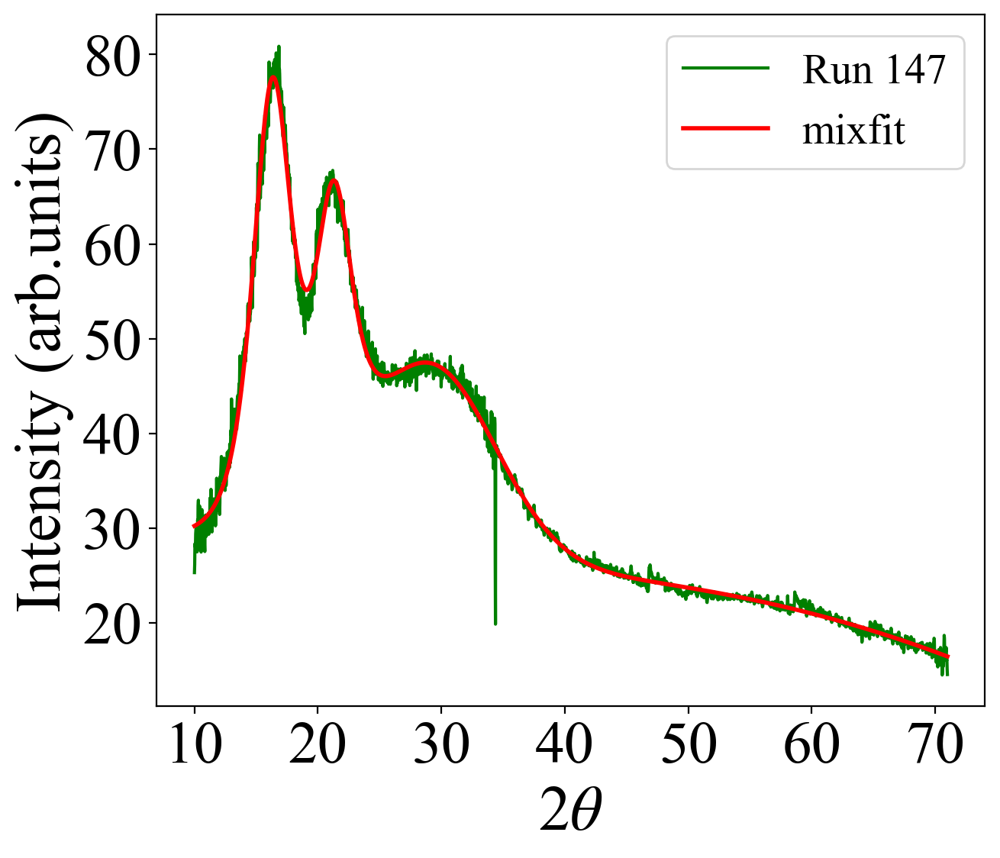

In [226]:
i = 3
plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i], markersize =2, color = 'g', label = 'Run ' + str(Runs[i]))
plt.legend()
popt, pcov = curve_fit(mixfit, averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i], p0, bounds = Bounds)
err_fit = np.sqrt(np.diag(pcov))
plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], mixfit(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], *popt), color = 'r',linewidth = 2, label = 'mixfit') 
std_fit = np.sqrt(np.diag(pcov)) #Ahmed gave me this line. Rahul also has the same line he got from Ezio.
print(popt)
print(err_fit)


plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
plt.legend(fontsize = 20)
plt.show()

## Fourgauss peak fitting with a constant background

In [67]:
#fitting a gaussian fit? How does one fit a curve? 
#step 1: Define a peak fitting function. This can be any function you want, just write down the function with all the defining parameters. Pro tip: Plot the function on desmos and see how each fitting parameter affects the curve fit to understand your function better

def fourgaussconstBfit(x, B, a0, x0, sigma0, a1, x1, sigma1, a2, x2, sigma2, a3, x3, sigma3):
    return  B + a0*np.exp(-(x-x0)**2/(2*sigma0**2))+a1*np.exp(-(x-x1)**2/(2*sigma1**2))+a2*np.exp(-(x-x2)**2/(2*sigma2**2))+a3*np.exp(-(x-x3)**2/(2*sigma3**2))

#i = 0
# Quad 0

In [68]:

          ##       B      A0     P0     w0   A1     P1    w1    A2      P2     w2   A3      P3     w3
p0 =     np.array([20,    50,    15,    2,   10,    21,   2,    30,     32,    5,   10,     60,     20])#,   47,   1])
B_low =  np.array([0,     30,    12,    0,   0,     18,   0,    10,     28,    3,   0,      55,     10])#,   47,   0])
B_high = np.array([50,    100,   18,    5,   50,    23,   10,   50,     35,    10,  30,     68,    50])#,   51,   3])
Bounds = (B_low,B_high)

[2.10445891e+01 4.40654080e+01 1.61989032e+01 2.00154455e+00
 2.57857048e+01 2.13866396e+01 1.31050172e+00 2.56395891e+01
 2.80000000e+01 8.01421867e+00 5.82536992e-12 5.50000000e+01
 5.00000000e+01]
[1.21629141 0.38771245 0.01533765 0.02123421 0.38359599 0.02151253
 0.02392011 0.21656089 0.13277425 0.10888428 1.22691065 0.
 0.        ]


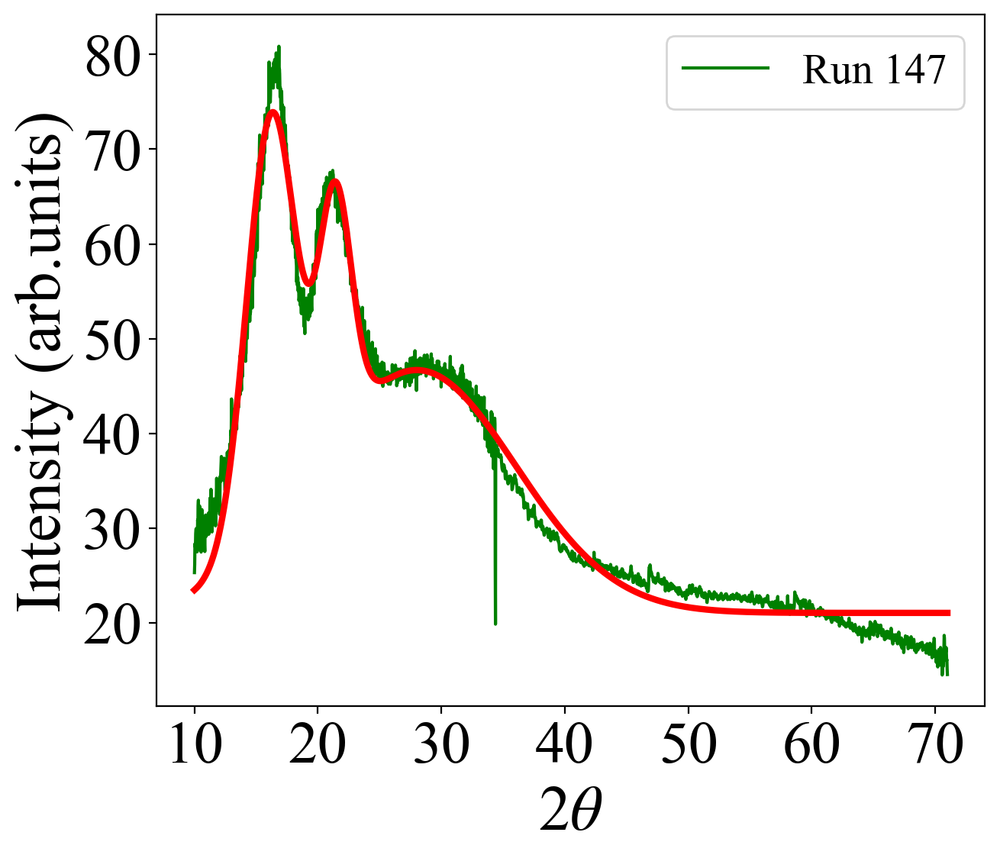

In [69]:
i = 3
plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i], markersize =2, color = 'g', label = 'Run ' + str(Runs[i]))
plt.legend()
popt, pcov = curve_fit(fourgaussconstBfit, averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i], p0, bounds = Bounds)
err_fit = np.sqrt(np.diag(pcov))
plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], fourgaussconstBfit(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], *popt), color = 'r',linewidth = 3) 
std_fit = np.sqrt(np.diag(pcov)) #Ahmed gave me this line. Rahul also has the same line he got from Ezio.
print(popt)
print(err_fit)


plt.xticks(fontsize = ticksize['xtick'])
plt.yticks(fontsize = ticksize['ytick'])
plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
plt.legend(fontsize = 20)
plt.show()

 
 
#  plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0], threegaussfit(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0], *popt),color = 'r',linewidth = 5)

## FILTERING

##  FFT filter 

In [101]:
# Filter requirements.
i = 3
T = averaged_quad_stitch['Run ' + str(Runs[i])]['x'].values[-1]-averaged_quad_stitch['Run ' + str(Runs[i])]['x'].values[0]       # Sample Period
fs = density_of_points     # sample rate, Hz
cutoff = 3      # desired cutoff frequency of the filter, Hz ,      slightly higher than actual 1.2 Hz
nyq = 0.5 * fs  # Nyquist Frequency
order = 3       # sin wave can be approx represented as quadratic #do fft and take out the outside cuttoff frequency and then inversefft and bring back the original smoother data (low pass filter, high frequency noise gone)
n = int(T * fs) # total number of samples

In [102]:
def butter_lowpass_filter(data, cutoff, fs, order): 
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y


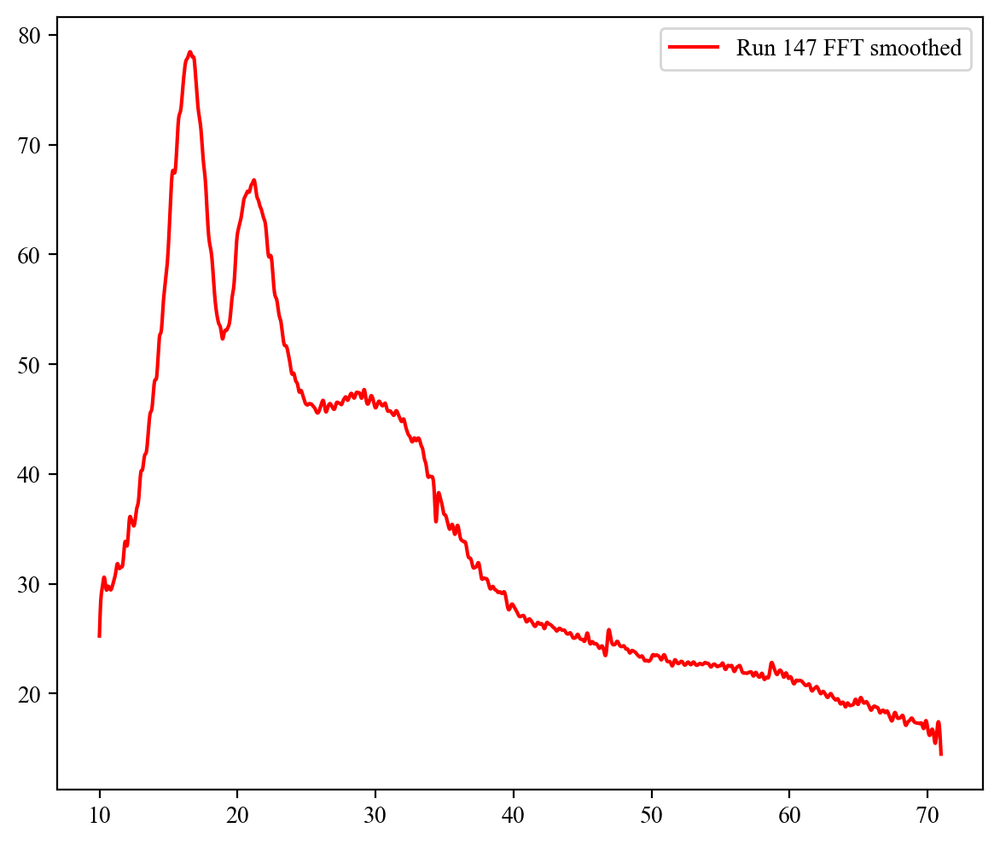

In [104]:
#plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y'], color='g', label = 'Run ' + str(Runs[i]))
reduced_noise = butter_lowpass_filter(normalized_results['Run ' + str(Runs[i])][1].values, cutoff, fs, order)
plt.plot(normalized_results['Run ' + str(Runs[i])][0], reduced_noise,  color='r', label = 'Run ' + str(Runs[i]) + ' FFT smoothed')
plt.legend()

## Savitzky-Golay filter

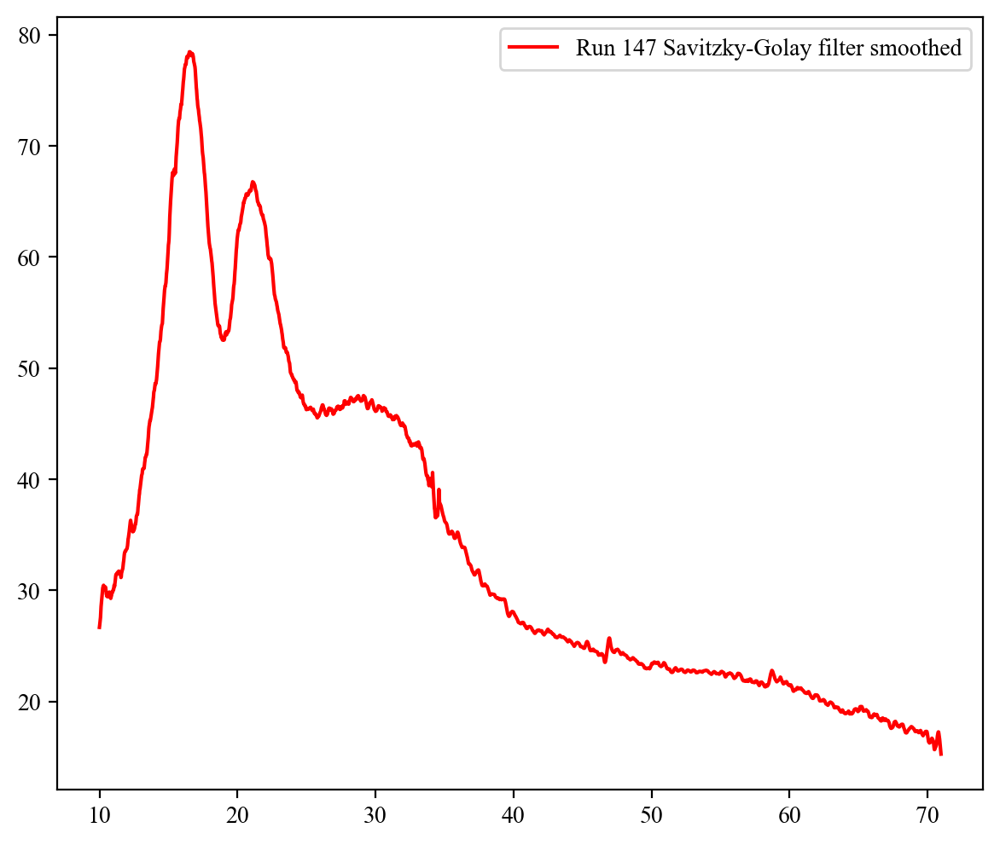

In [106]:
i = 3
#plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y'], color = 'g', label = 'Run ' + str(Runs[i]))
reduced_noise = savgol_filter(normalized_results['Run ' + str(Runs[i])][1].values, 25, 2, mode='nearest') #‘mirror’, ‘constant’, ‘nearest’, ‘wrap’ or ‘interp’.
plt.plot(normalized_results['Run ' + str(Runs[i])][0], reduced_noise, color = 'r',label = 'Run ' + str(Runs[i]) + ' Savitzky-Golay filter smoothed')
plt.legend()

## 2theta conversion with wavelength (For comparison with literature)

### Converting one value

In [2]:
import math

def convert_2theta_one_value(wavelength1, wavelength2, theta1):
    theta2 = math.asin(wavelength2 / (wavelength1) * math.sin(math.radians(theta1)))  # Apply Bragg's law

    return math.degrees(theta2)


In [13]:
convert_2theta_one_value(0.309962, 0.7293, 13.88/2)*2

33.033650760033545

### Converting a series (this doesnt work somehow)

In [111]:
import numpy as np
import math

def convert_2theta(wavelength1, wavelength2, twotheta1):
    theta1_rad = np.radians(twotheta1/2)
    sin_theta1 = np.sin(theta1_rad)
    sin_theta2 = wavelength2 / (wavelength1) * sin_theta1
    print(sin_theta2)
    theta2_rad = np.arcsin(sin_theta2)
    theta2_deg = np.degrees(theta2_rad)
    
    return theta2_deg



In [112]:
# averaged_quad_stitch['Run ' + str(Runs[i])]['x'][np.array([0, 1, 2])]

In [113]:
i = 3
valid_values = np.where(averaged_quad_stitch['Run ' + str(Runs[i])]['x'] != np.NaN)
th_17keV = averaged_quad_stitch['Run ' + str(Runs[i])]['x']/2
theta_new = convert_2theta(0.7293, 0.539, th_17keV)
twotheta_new = theta_new*2

0       0.092143
1       0.092327
2       0.092512
3       0.092696
4       0.092880
          ...   
3045    0.643129
3046    0.643304
3047    0.643480
3048    0.643655
3049    0.643831
Name: x, Length: 3050, dtype: float64


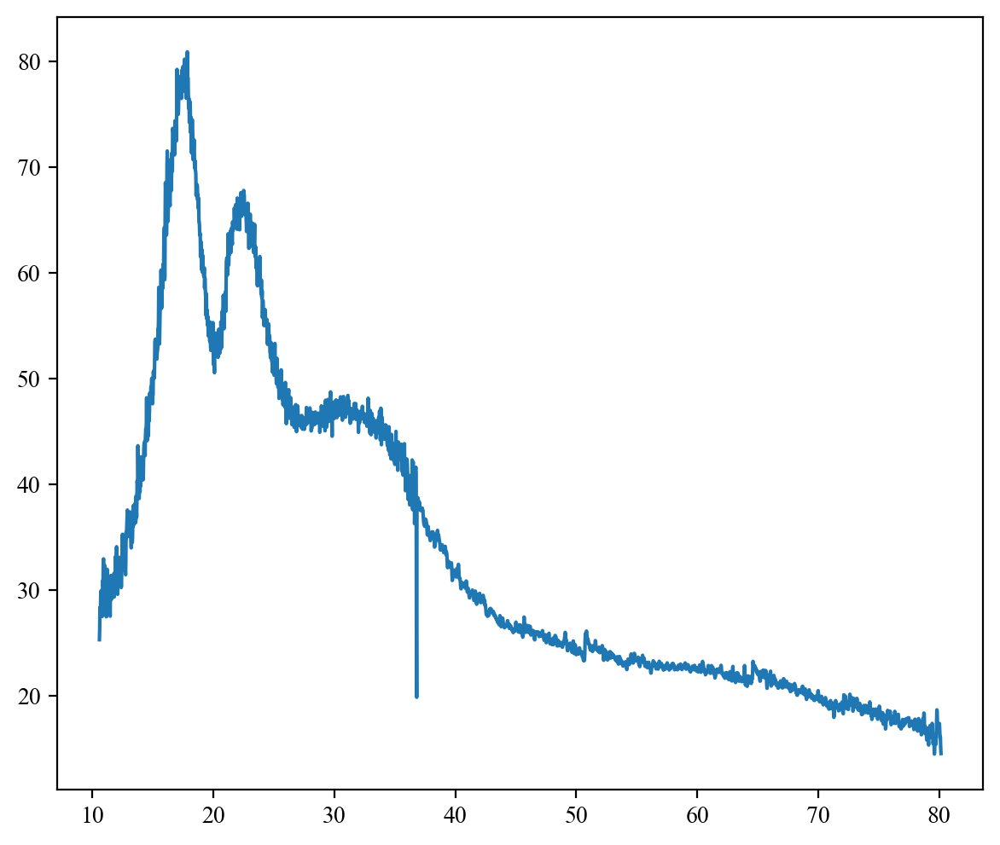

In [114]:
i = 3
plt.plot(twotheta_new, averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i])
# plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y']/Gas_norm[i], markersize =2, color = 'g', label = 'Run ' + str(Runs[i]))


## Old test codes

In [ ]:
# i = 0
# Run_to_plot = Runs[i]
# x = normalized_results['Run ' + str(Runs[i])][0]
# y = normalized_results['Run ' + str(Runs[i])][1]
# valid = ~(np.isnan(x)|np.isnan(y))
# plt.plot(x[valid], y[valid], linewidth = 2, color = 'g', label = 'Run ' + str(Runs[i]))
# plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]), linewidth = 2, color = 'r', label = 'fit')
# plt.plot(x[valid],Fancyfit_results_runs['Run ' + str(Runs[i])].eval(x = x[valid]) - y[valid], linewidth = 2, color = 'r', label = 'residual')


# plt.title('Run ' + str(Runs[i]))
# plt.xticks(fontsize = ticksize['xtick'])
# plt.yticks(fontsize = ticksize['ytick'])
# plt.xlabel('2$\\theta$', fontsize = labelsize['xlabel'])
# plt.ylabel('Intensity (arb.units)', fontsize = labelsize['ylabel'])
# plt.legend(fontsize = 20)
# plt.show()


## Fitting all runs (automated) by each quad

## Importing the fit guess and bounds

In [115]:

Quad0_fit_bounds_params = pd.read_excel(fit_params_file, sheet_name='Quad0')
Quad1_fit_bounds_params = pd.read_excel(fit_params_file, sheet_name='Quad1')
Quad2_fit_bounds_params = pd.read_excel(fit_params_file, sheet_name='Quad2')
Quad3_fit_bounds_params = pd.read_excel(fit_params_file, sheet_name='Quad3')

ValueError: Worksheet named 'Quad0' not found

## Peak fitting

In [116]:
# for i in range(len(Runs)):
#     run_num = Runs[i]
#     print(run_num)

In [117]:
Runs[0]

140

In [118]:
run_num = Runs[1]
p0, Bounds = mfc.get_fit_guess(Quad0_fit_bounds_params, run_num, 3)
print(p0, Bounds)

NameError: name 'Quad0_fit_bounds_params' is not defined

In [119]:

fit_results_byruns = dict.fromkeys(Run_key_list) 

for i, _ in enumerate(Runs):
    run_num = Runs[i]
    fit_results_byquads = dict.fromkeys(Quad_key_list)
    for j, _ in enumerate(Quads):
        if j == 0:
            p0, Bounds = mfc.get_fit_guess(Quad0_fit_bounds_params, run_num, 3)
            x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
            valid = ~(np.isnan(x)|np.isnan(y))
            popt0, pcov0 = curve_fit(threegaussfit, x[valid],y[valid], p0, bounds = Bounds)
            err_fit0 = np.sqrt(np.diag(pcov0))
            fit_param0 = [popt0, err_fit0]
            fit_results_byquads['Quad' + str((j))] = fit_param0
        elif j == 1:
            p0, Bounds = mfc.get_fit_guess(Quad1_fit_bounds_params, run_num, 3)
            x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
            valid = ~(np.isnan(x)|np.isnan(y))
            popt1, pcov1 = curve_fit(threegaussfit, x[valid],y[valid], p0, bounds = Bounds)
            err_fit1 = np.sqrt(np.diag(pcov1))
            fit_param1 = [popt1, err_fit1]
            fit_results_byquads['Quad' + str((j))] = fit_param1
        elif j == 2:
            p0, Bounds = mfc.get_fit_guess(Quad2_fit_bounds_params, run_num, 2)
            x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
            valid = ~(np.isnan(x)|np.isnan(y))
            popt2, pcov2 = curve_fit(twogaussfit, x[valid],y[valid], p0, bounds = Bounds)
            err_fit2 = np.sqrt(np.diag(pcov2))
            fit_param2 = [popt2, err_fit2]
            fit_results_byquads['Quad' + str((j))] = fit_param2
        elif j == 3:
            p0, Bounds = mfc.get_fit_guess(Quad3_fit_bounds_params, run_num, 2)
            x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
            y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
            valid = ~(np.isnan(x)|np.isnan(y))
            popt3, pcov3 = curve_fit(twogaussfit, x[valid],y[valid], p0, bounds = Bounds)
            err_fit3 = np.sqrt(np.diag(pcov3))
            fit_param3 = [popt3, err_fit3]
            fit_results_byquads['Quad' + str((j))] = fit_param3
    fit_results_byruns['Run ' + str(Runs[i])] = fit_results_byquads

NameError: name 'Quad0_fit_bounds_params' is not defined

## Plotting fits

In [120]:
i = 0
j = 2
fit_results_byruns['Run ' + str(Runs[i])]['Quad' + str(j)][0]

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

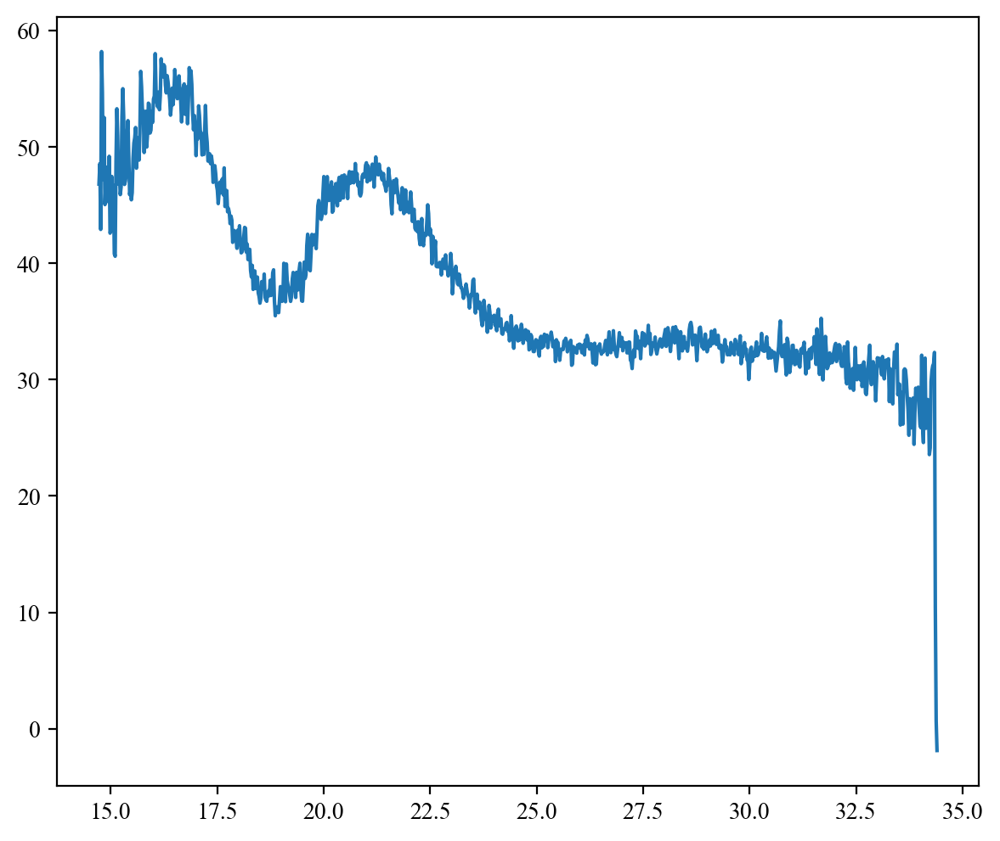

In [121]:
i = 3
Run_to_plot = Runs[i]

for j, _ in enumerate(Quads):
    if j == 0:
        x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
        valid = ~(np.isnan(x)|np.isnan(y))
        plt.plot(x[valid], y[valid])
        plt.plot(x[valid], threegaussfit(x[valid], *fit_results_byruns['Run ' + str(Runs[i])]['Quad' + str(j)][0]),color = 'r',linewidth = 5)
        plt.title('Run ' + str(Runs[i])+ ' Quad'+  str(j))
        # print(fit_param0)
        # print(popt0)
        # print(err_fit0)
        plt.show()
        
    
    elif j == 1:
        x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
        valid = ~(np.isnan(x)|np.isnan(y))
        plt.plot(x[valid], y[valid])
        plt.plot(x[valid], threegaussfit(x[valid], *fit_results_byruns['Run ' + str(Runs[i])]['Quad' + str(j)][0]),color = 'r',linewidth = 5)
        plt.title('Run ' + str(Runs[i])+ ' Quad'+  str(j))
        # print(popt1)
        # print(err_fit1)
        plt.show()
        
    elif j == 2:
        x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
        valid = ~(np.isnan(x)|np.isnan(y))
        plt.plot(x[valid], y[valid])
        plt.plot(x[valid], twogaussfit(x[valid], *fit_results_byruns['Run ' + str(Runs[i])]['Quad' + str(j)][0]),color = 'r',linewidth = 5)
        plt.title('Run ' + str(Runs[i])+ ' Quad'+ str(j))
        # print(popt2)
        # print(err_fit2)
        plt.show()
       
        
    elif j == 3:
        x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]
        valid = ~(np.isnan(x)|np.isnan(y))
        plt.plot(x[valid], y[valid])
        plt.plot(x[valid], twogaussfit(x[valid], *fit_results_byruns['Run ' + str(Runs[i])]['Quad' + str(j)][0]),color = 'r',linewidth = 5)
        plt.title('Run ' + str(Runs[i])+ ' Quad'+  str(j))
        # print(popt3)
        # print(err_fit3)
        plt.show()

for j, _ in enumerate(Quads): 
    print('Fit param Run '+str(Runs[i])+ ' Quad' + str((j))+':', fit_results_byruns['Run ' + str(Runs[i])] ['Quad' + str((j))][0])
for j, _ in enumerate(Quads): 
    print('Fit error Run '+str(Runs[i])+ ' Quad' + str((j))+':', fit_results_byruns['Run ' + str(Runs[i])] ['Quad' + str((j))][1])

In [ ]:
## Coding steps this week
## Resample the data


In [ ]:
print(fit_results_byruns)

{'Run 140': {'Quad0': [array([ 9.5       , 17.58746489, 12.0000001 ,  2.76639802,  3.20699423,
       20.41078983,  2.24776839,  3.17725851, 28.07010493,  2.96303343]), array([ 0.35377153, 11.00369236,  2.85729913,  1.26144983,  0.35451567,
        0.41571893,  0.39807643,  0.33324717,  0.18944402,  0.39473306])], 'Quad1': [array([13.05264641, 16.18366871, 11.38922158,  2.87828202,  1.42415744,
       20.7286378 ,  0.41743891,  1.34258676, 17.92898373,  0.09312848]), array([0.07486483, 0.1320307 , 0.04690973, 0.04920296, 0.29336952,
       0.09791459, 0.10190782, 0.61440016, 0.0490237 , 0.04959116])], 'Quad2': [array([19.49582026, 32.84603194, 32.        ,  8.774221  , 10.85434061,
       58.09908907,  8.71623104]), array([ 1.86465133, 26.66784652, 11.46332611,  5.09491627,  2.53297122,
        1.44751989,  1.82937668])], 'Quad3': [array([28.246505  , 76.26549747, 26.36290478,  9.62968997, 20.        ,
       56.        , 11.6895879 ]), array([11.31649036,  9.5846653 ,  0.28677957,  0.

# TEST FILTERING, IGNORE

## Trying FFT filter 

In [91]:
# Filter requirements.
i = 3
T = averaged_quad_stitch['Run ' + str(Runs[i])]['x'].values[-1]-averaged_quad_stitch['Run ' + str(Runs[i])]['x'].values[0]       # Sample Period
fs = density_of_points     # sample rate, Hz
cutoff = 3      # desired cutoff frequency of the filter, Hz ,      slightly higher than actual 1.2 Hz
nyq = 0.5 * fs  # Nyquist Frequency
order = 3       # sin wave can be approx represented as quadratic #do fft and take out the outside cuttoff frequency and then inversefft and bring back the original smoother data (low pass filter, high frequency noise gone)
n = int(T * fs) # total number of samples

In [92]:
def butter_lowpass_filter(data, cutoff, fs, order): 
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y


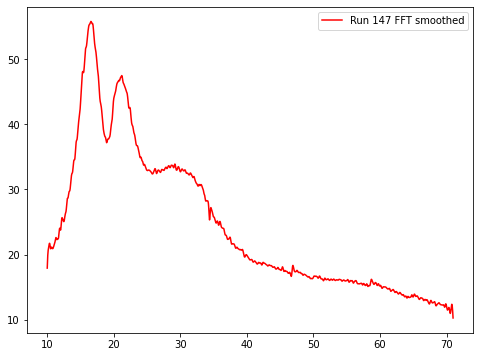

In [93]:
#plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y'], color='g', label = 'Run ' + str(Runs[i]))
reduced_noise = butter_lowpass_filter(averaged_quad_stitch['Run ' + str(Runs[i])]['y'].values, cutoff, fs, order)
plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], reduced_noise,  color='r', label = 'Run ' + str(Runs[i]) + ' FFT smoothed')
plt.legend()

In [94]:
reduced_noise

array([17.94047301, 18.50919758, 19.04523784, ..., 11.02036463,
       10.66366626, 10.29698932])

## Trying Savitzky-Golay filter

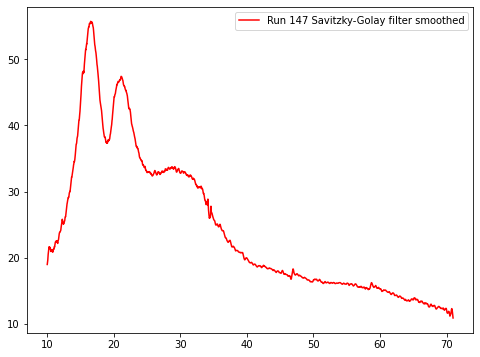

In [95]:
i = 3
#plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], averaged_quad_stitch['Run ' + str(Runs[i])]['y'], color = 'g', label = 'Run ' + str(Runs[i]))
reduced_noise = savgol_filter(averaged_quad_stitch['Run ' + str(Runs[i])]['y'].values, 25, 2, mode='nearest') #‘mirror’, ‘constant’, ‘nearest’, ‘wrap’ or ‘interp’.
plt.plot(averaged_quad_stitch['Run ' + str(Runs[i])]['x'], reduced_noise, color = 'r',label = 'Run ' + str(Runs[i]) + ' Savitzky-Golay filter smoothed')
plt.legend()

In [96]:
averaged_quad_stitch['Run ' + str(Runs[i])]['y'].values.shape

(3050,)

In [97]:
averaged_quad_stitch

{'Run 140':           x          y
 0     10.00  24.654741
 1     10.02  24.102932
 2     10.04  25.000232
 3     10.06  28.867048
 4     10.08  28.315035
 ...     ...        ...
 3045  70.90   5.602469
 3046  70.92   5.228533
 3047  70.94   3.671487
 3048  70.96   3.532664
 3049  70.98   4.556415
 
 [3050 rows x 2 columns],
 'Run 141':           x         y
 0     10.00  6.042146
 1     10.02  7.227281
 2     10.04  7.250599
 3     10.06  6.392224
 4     10.08  6.443688
 ...     ...       ...
 3045  70.90  3.716784
 3046  70.92  3.633583
 3047  70.94  3.574795
 3048  70.96  3.409408
 3049  70.98  3.471961
 
 [3050 rows x 2 columns],
 'Run 144':           x         y
 0     10.00  6.367901
 1     10.02  6.000096
 2     10.04  6.028853
 3     10.06  6.704720
 4     10.08  6.368756
 ...     ...       ...
 3045  70.90  3.536313
 3046  70.92  3.416174
 3047  70.94  3.387761
 3048  70.96  3.570274
 3049  70.98  3.525763
 
 [3050 rows x 2 columns],
 'Run 147':           x          y
 0     1

## Caked Images (2D intergration)

In [ ]:
## Azimuthal integration
Int_keys = []
Int_quad_keys = []
for j in Runs:
   keys = 'Run ' + str((j))
   Int_keys.append(keys)
Int_2D_results = dict.fromkeys(Int_keys) 

for i in Quads:
   keys = 'Quad' + str((i))
   Int_quad_keys.append(keys)

counter = 0
   
for j in Runs:
   Int_2D_quads = dict.fromkeys(Int_quad_keys)
   for i in Quads:
      img = Run_images['Run ' + str(j)]['Quad'+ str(i)]
      mask_1 = Run_images['Run ' + str(j)]['Quad'+ str(i)] != 0.0 # masks out the low pixels(<1) (areas between the modules) (i.e these values are true)
      mask_2 = Run_images['Run ' + str(j)]['Quad'+ str(i)] < 500 ## masks out the hot pixels (>500) (areas between the modules)(i.e these values are true)
      mask_edge = np.full(np.shape(img), True)
      mask_edge[0:edge_mask_width, :] = False
      mask_edge[-edge_mask_width:-1, :] = False
      mask_edge[:, 0:edge_mask_width] = False    # areas which are false are zeros and true is one. 
      mask_edge[:, -edge_mask_width:-1] = False
      
      if i == 0:
         mask = mask_1 & mask_2 & mask_tri
      else:
         mask = mask_1 & mask_2 & mask_edge
      mask = mask.astype('float')
      mask[mask == 0] = np.nan
      calib_all['Calib Quad' + str(i)].wavelength = lams[counter]
      
      dark = dark_run_images['Run 124'] ["Quad"+ str(i)]
      
      Integ_results = calib_all['Calib Quad' + str(i)].integrate2d(img*mask-dark, 2000, 360, unit="2th_deg", polarization_factor=0.99, method='full_csr') # remember to put 
      Integ_results[1][Integ_results[1] == 0] = np.nan
      
      Int_2D_quads['Quad' + str((i))] =  Integ_results
   Int_2D_results['Run ' + str((j))] = Int_2D_quads
   counter = counter + 1
      
#print(Int_1D_results)

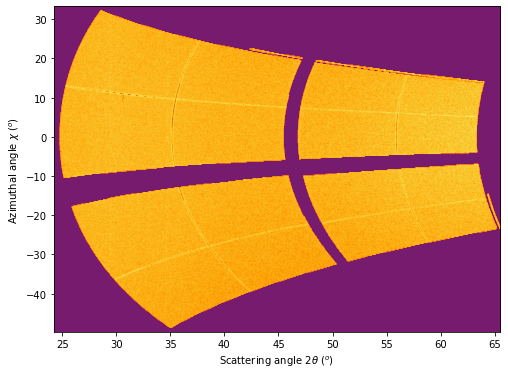

In [ ]:
from pyFAI.gui import jupyter
run_to_plot = 'Run 140'

quad_2_plot = 3
ax = jupyter.plot2d (Int_2D_results[run_to_plot]["Quad{0}".format(quad_2_plot)])


Text(0.5, 1.0, 'XRD plot Run Run 140 Quad3')

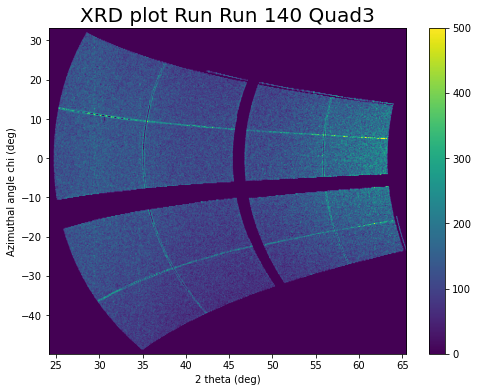

In [ ]:
I, tth, chi = Int_2D_results[run_to_plot]["Quad{0}".format(quad_2_plot)]
plt.imshow(I, origin="lower", extent=[tth.min(), tth.max(), chi.min(), chi.max()], aspect="auto", vmin=0, vmax = 500)
plt.xlabel("2 theta (deg)")
plt.ylabel("Azimuthal angle chi (deg)")
plt.colorbar()
plt.title('XRD plot Run ' +str(run_to_plot)+ ' Quad'+ str(quad_2_plot), fontsize = 20)


## Quad stitching

In [ ]:

x0 = Int_1D_results['Run ' + str(Runs[i])]['Quad0'][0]
x1 = Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0]
x2 = Int_1D_results['Run ' + str(Runs[i])]['Quad2'][0]
x3 = Int_1D_results['Run ' + str(Runs[i])]['Quad3'][0]


y0 = Int_1D_results['Run ' + str(Runs[i])]['Quad0'][1]
y1 = Int_1D_results['Run ' + str(Runs[i])]['Quad1'][1]
y2 = Int_1D_results['Run ' + str(Runs[i])]['Quad2'][1]
y3 = Int_1D_results['Run ' + str(Runs[i])]['Quad3'][1]



703
0.0
1.0945939


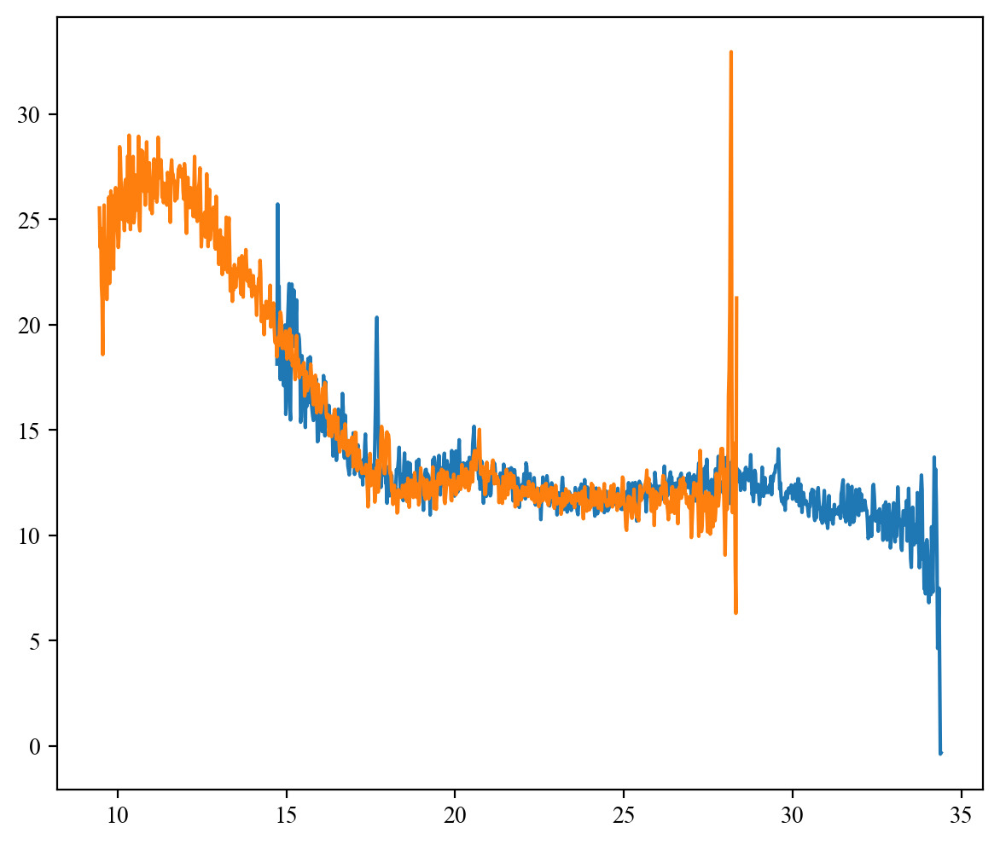

In [ ]:
#Sanity check
print(len(b_indices))
test= np.linspace(np.min(b_indices), np.max(b_indices), np.max(b_indices)-np.min(b_indices)+1) # something Rahul did. Ask him for more. Hes being a meanie and not explaining properly
print(np.sum(b_indices-test))
q0_ovelap_mean = np.nanmean(y0[a_indices])
q1_ovelap_mean = np.nanmean(y1[b_indices])
ratio_q1_q0 = q1_ovelap_mean/q0_ovelap_mean
print(ratio_q1_q0)
plt.plot(x0, y0, x1, y1/ratio_q1_q0)

562
0.0
8.437864


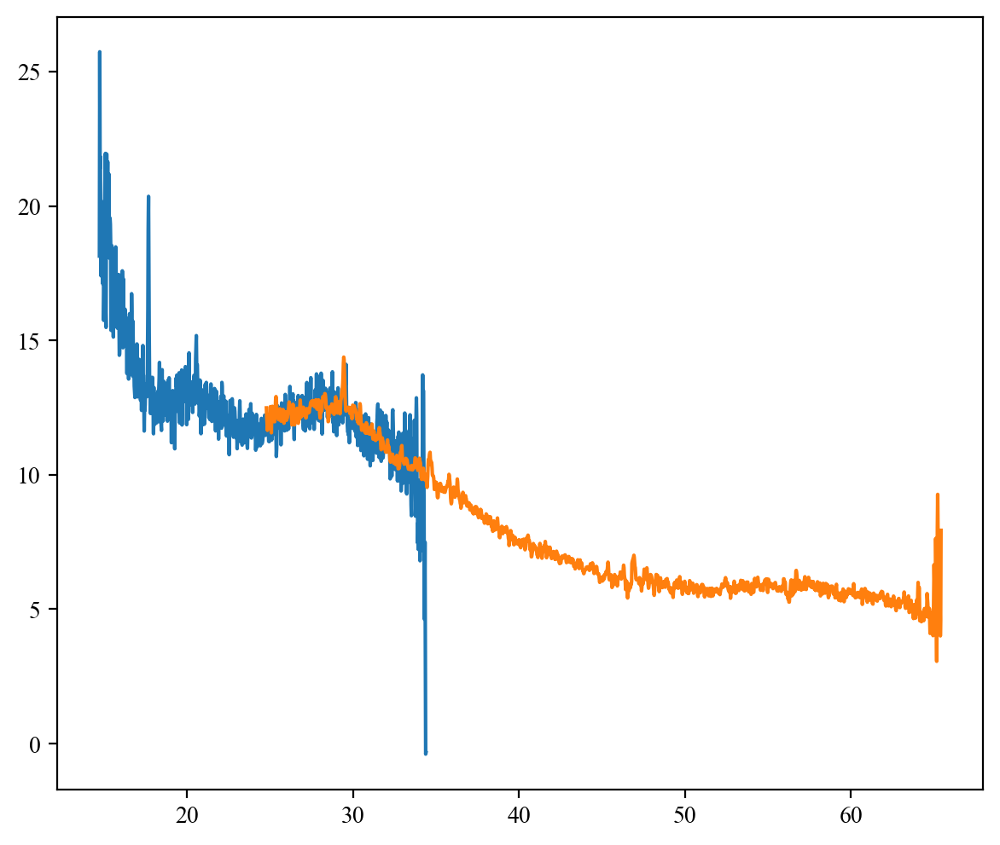

In [ ]:
_, a_indices, b_indices = overlapfunc(x0,x3)
print(len(b_indices))
test= np.linspace(np.min(b_indices), np.max(b_indices), np.max(b_indices)-np.min(b_indices)+1) # something Rahul did. Ask him for more. Hes being a meanie and not explaining properly
print(np.sum(b_indices-test))
q0_ovelap_mean = np.nanmean(y0[a_indices])
q3_ovelap_mean = np.nanmean(y3[b_indices])
ratio_q3_q0 = q3_ovelap_mean/q0_ovelap_mean
print(ratio_q3_q0)
plt.plot(x0, y0, x3, y3/ratio_q3_q0)

1183
0.0
0.6290791


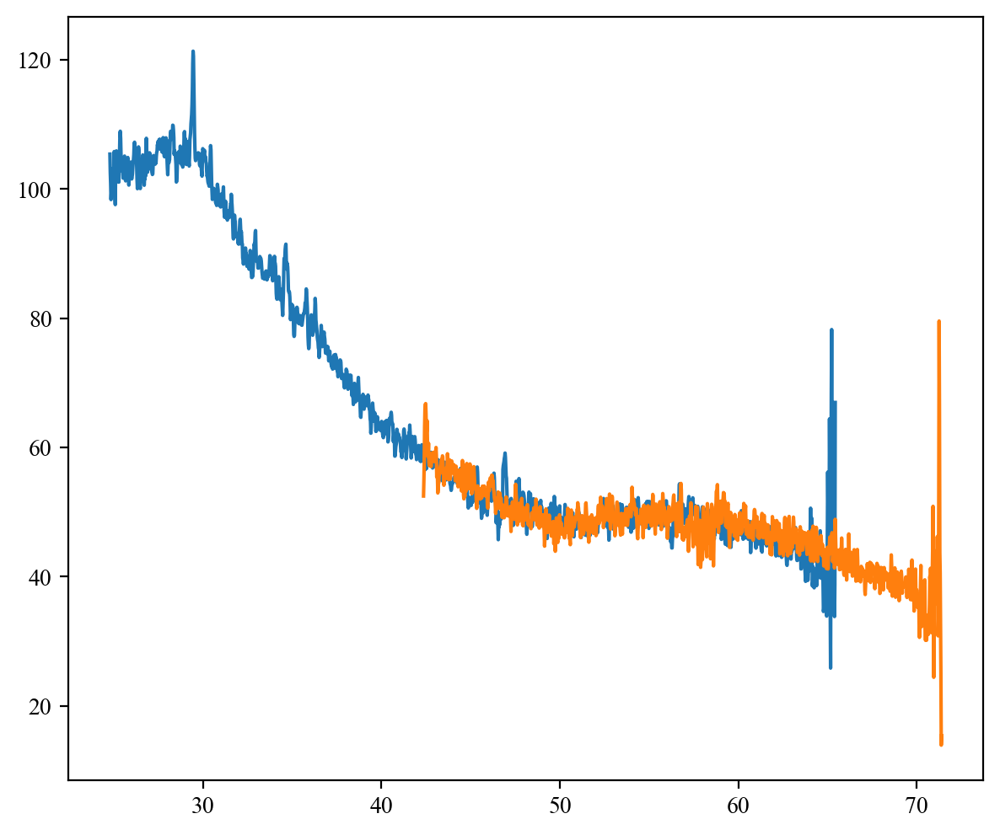

In [ ]:
_, a_indices, b_indices = overlapfunc(x2,x3)
print(len(b_indices))
test= np.linspace(np.min(b_indices), np.max(b_indices), np.max(b_indices)-np.min(b_indices)+1) # something Rahul did. Ask him for more. Hes being a meanie and not explaining properly
print(np.sum(b_indices-test))
q2_ovelap_mean = np.nanmean(y2[a_indices])
q3_ovelap_mean = np.nanmean(y3[b_indices])
ratio_q2_q3 = q2_ovelap_mean/q3_ovelap_mean
print(ratio_q2_q3)
plt.plot(x3, y3, x2, y2/ratio_q2_q3)

## TESTING

In [ ]:
from itertools import chain

def combine_lists(*args):
    combined_list = list(chain(*args))
    return combined_list


In [ ]:
def combine_lists(*args):
    combined_list = []
    seen = set()
    for lst in args:
        for item in lst:
            if item not in seen:
                combined_list.append(item)
                seen.add(item)
    return combined_list

In [ ]:
# Sample data frames
df1 = pd.DataFrame({'A': [1, 2, 3], 'B': [10, 20, 30]})
df2 = pd.DataFrame({'A': [2, 3, 4, 5], 'B': [40, 50, 60, np.nan]})
print(df1)
print(df2)

   A   B
0  1  10
1  2  20
2  3  30
   A     B
0  2  40.0
1  3  50.0
2  4  60.0
3  5   NaN


In [ ]:
# Merge data frames on common columns with outer join
merged = pd.merge(df1, df2, on='A', how='outer')
print(merged)

   A   B_x   B_y
0  1  10.0   NaN
1  2  20.0  40.0
2  3  30.0  50.0
3  4   NaN  60.0
4  5   NaN   NaN


In [ ]:
# Calculate the average of the values in the second column for common rows
merged['B'] = merged.loc[:, ['B_x', 'B_y']].mean(axis = 1)
print(merged)

   A   B_x   B_y     B
0  1  10.0   NaN  10.0
1  2  20.0  40.0  30.0
2  3  30.0  50.0  40.0
3  4   NaN  60.0  60.0
4  5   NaN   NaN   NaN


In [ ]:
merged_0_1 = merged.drop(['B_x', 'B_y'], axis=1)
print(merged_0_1)

   A     B
0  1  10.0
1  2  30.0
2  3  40.0
3  4  60.0
4  5   NaN


In [100]:
averaged_quad_stitch = dict.fromkeys(Int_keys) 
for i, _ in enumerate(Runs):
    x_list = []
    y_list = []
    df_list = []
    for j, _ in enumerate(Quads):
        x = Resample_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
        y = Resample_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
        data_frame = pd.DataFrame(data = {'x':x, 'y':y})
        x_list.append(x)
        y_list.append(y)
        df_list.append(data_frame)

    _, a1_indices, b1_indices = overlapfunc(df_list[0]['x'],df_list[1]['x'])
    _, a2_indices, b2_indices = overlapfunc(df_list[0]['x'],df_list[3]['x'])
    _, a3_indices, b3_indices = overlapfunc(df_list[2]['x'],df_list[3]['x'])
    
    
    average_q1_q0 = np.nanmean([df_list[0]['y'][a1_indices], df_list[1]['y'][b1_indices]], 0)
    average_q3_q0 = np.nanmean([df_list[0]['y'][a2_indices], df_list[3]['y'][b2_indices]], 0)
    average_q3_q2 = np.nanmean([df_list[2]['y'][a3_indices], df_list[3]['y'][b3_indices]], 0)
    
    minimum = min(df_list[1]['x'])
    maximum = max(df_list[2]['x'])
    number = maximum - minimum
    npt = int(number * density_of_points)
    x_new = np.linspace(minimum, maximum, num = npt, endpoint=True, retstep=False, dtype=None, axis=0)
    # y_new = [y_list[1][0:min(b1_indices)] + average_q1_q0 + y_list[0][max(a1_indices):min(a2_indices)]+ average_q3_q0 + y_list[3][max(b2_indices):min(b3_indices)]+ average_q3_q2 + y_list[max(a3_indices):-1]]
    # y_new = combine_lists(df_list[1]['y'][0:min(b1_indices)] ,  average_q1_q0  , average_q3_q0[max(b1_indices):-1] , df_list[3]['y'][max(b2_indices):min(b3_indices)] , average_q3_q2 , df_list[2]['y'][max(a3_indices):-1])
    # plt.plot(x_new, y_new)
    

#     q3_ovelap_mean = np.nanmean(y3[b_indices])
#     ratio_q2_q3 = q2_ovelap_mean/q3_ovelap_mean
    
#     ratio_q1_q0 = np.nanmean(y_list[1][b1_indices])/np.nanmean(y_list[0][a1_indices])
#     ratio_q3_q0 = np.nanmean(y_list[3][b2_indices])/np.nanmean(y_list[0][a2_indices])
#     y_list[3] = y_list[3]/ratio_q3_q0
#     ratio_q3_q2 = np.nanmean(y_list[3][b3_indices])/np.nanmean(y_list[2][a3_indices])
    
#     final_ratios_quad_stitch[Int_keys[i]] = [ratio_q1_q0, ratio_q3_q0, ratio_q3_q2]
#     # _, a_indices, b_indices = overlapfunc(x0,x1)


# i = 8
# for j in Quads:
#     if j == 0:
#         x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
#         y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]
#         plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i]) 
#     elif j == 1:
#         x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
#         y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][0]
#         plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j), color = clr[i])
#     elif j == 2:
#         x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
#         y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]*final_ratios_quad_stitch[Int_keys[i]][2]
#         plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j),color = clr[i]) 
#     elif j == 3:
#         x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][0]
#         y = Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(j) ][1]/final_ratios_quad_stitch[Int_keys[i]][1]
#         plt.plot(x, y, label = 'Run ' + str(Runs[i])+ ' Quad' + str(j),color = clr[i]) 

In [ ]:
df_list[1]['x']

0       10.000000
1       10.012509
2       10.025017
3       10.037526
4       10.050035
          ...    
1435    27.949965
1436    27.962474
1437    27.974983
1438    27.987491
1439    28.000000
Name: x, Length: 1440, dtype: float64

In [ ]:
np.shape(y_list[1][0:min(b1_indices)])

(392,)

In [ ]:
min(b1_indices)

392

In [ ]:
a1_indices

array([   0,    1,    2, ..., 1045, 1046, 1047])

# Extra Stuff for Checking if we want to offset or scale?

### Offset or scaling?

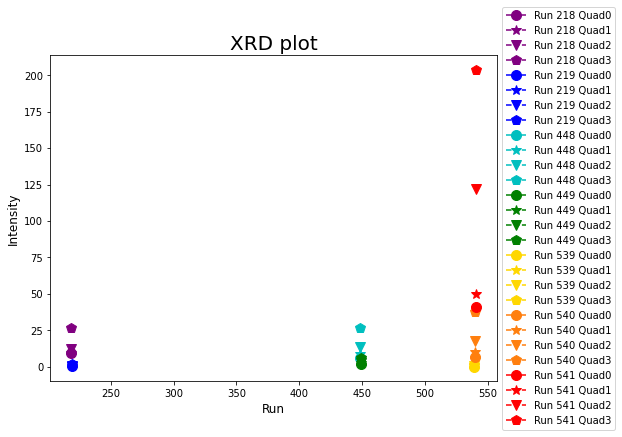

In [ ]:
# plotting the mean of each against the run numbers

clr = ['purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink'] 
sym = ['o', '*', 'v', 'p'] 
for i in range (len(Runs)): 
    for j in Quads:
        plt.plot (Runs[i], np.nanmean(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]), sym[j], markersize = 10, color = clr[i], linestyle = 'dashed', label = 'Run ' + str(Runs[i])+ ' Quad' + str(j) ) #color = clr[j])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad1'][0],Int_1D_results['Run ' +str(i)]['Quad1'][1])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad2'][0],Int_1D_results['Run ' + str(i)]['Quad2'][1])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad3'][0],Int_1D_results['Run ' +str(i)]['Quad3'][1])
plt.xlabel('Run', fontsize = 12)
plt.ylabel('Intensity', fontsize = 12) 
plt.title('XRD plot', fontsize = 20)
#plt.ylim([0, 50])
plt.legend()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

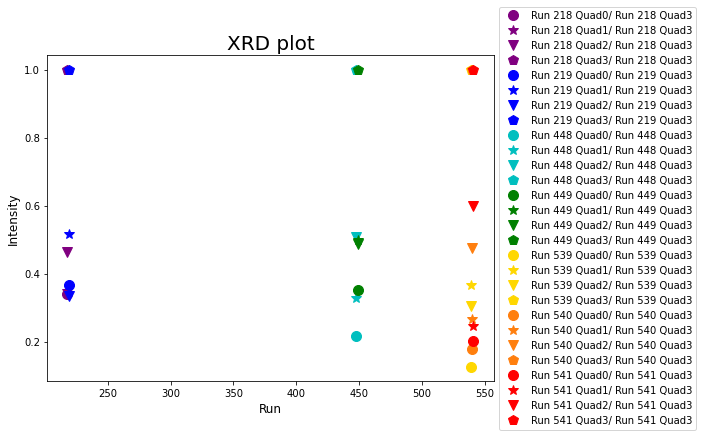

In [ ]:
## plotting each quad divided by Quad 3
# plotting the mean of each against the run numbers
# color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
# clr = [random.choice(color) for i in range(50)]
clr = ['purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink','purple','deeppink','purple', 'b', 'c', 'g', 'gold','tab:orange','red','purple','deeppink'] 
sym = ['o', '*', 'v', 'p'] 
for i in range (len(Runs)): 
    for j in Quads:
        plt.plot (Runs[i], (np.nanmean(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(j)][1]))/(np.nanmean(Int_1D_results['Run ' + str(Runs[i])]['Quad3'][1])), sym[j], color = clr[i], markersize = 10,  label = 'Run ' + str(Runs[i]) + ' Quad' + str(j) + '/ Run ' +  str(Runs[i]) + ' Quad3') #color = clr[j])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad1'][0],Int_1D_results['Run ' +str(i)]['Quad1'][1])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad2'][0],Int_1D_results['Run ' + str(i)]['Quad2'][1])
        # plt.plot(Int_1D_results['Run ' + str(i)]['Quad3'][0],Int_1D_results['Run ' +str(i)]['Quad3'][1])
plt.xlabel('Run', fontsize = 12)
plt.ylabel('Intensity', fontsize = 12) 
plt.title('XRD plot', fontsize = 20)
#plt.ylim([0, 50])
plt.legend()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


## Two gaussian fit

In [ ]:
#                  B,    a0,    x0,    sigma0,    a1,    x1, sigma1
# p0 =     np.array([6,    20,    16,        1,     10,    21,     2])
# B_low =  np.array([0,    0,     10,         0,    0,     15,     0])
# B_high = np.array([10,    50,    19,         3,    10,    22,     3])
# Bounds = (B_low,B_high)


p0 =     np.array([35,    50,     30,      10,     15,    60,     50])#,    20,     55,     9])#,   30,   47,   1])
B_low =  np.array([25,     0,     20,      0,     0,     40,      0])#,     0,      40,     0])#,   10,   47,   0])
B_high = np.array([80,    100,    32,      50,    50,    70,     100])#,    50,     70,     20])#,  50,   51,   3])
Bounds = (B_low,B_high)

combined_list = [item for triplet in zip(B_low, p0, B_high) for item in triplet]
print(combined_list)

[25, 35, 80, 0, 50, 100, 20, 30, 32, 0, 10, 50, 0, 15, 50, 40, 60, 70, 0, 50, 100]


[49.06815071 99.99999985 30.50742645  9.50752863 49.99999998 54.12951952
 14.90953776]
error: [ 30.5824382  111.54533776  11.29124802   7.03636254  42.95519993
   9.54771898  11.62763443]


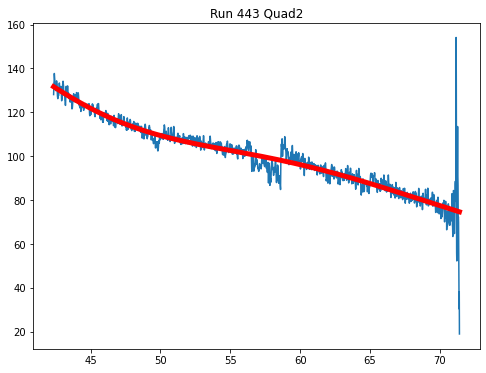

In [ ]:
i = 0
quad_2_plot = 2
x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0]
y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][1]
valid = ~(np.isnan(x)|np.isnan(y))
popt, pcov = curve_fit(twogaussfit, x[valid],y[valid], p0, bounds = Bounds)
print(popt)
std_fit = np.sqrt(np.diag(pcov))
plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0],Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(quad_2_plot) ][1])
plt.plot(x[valid], twogaussfit(x[valid], *popt),color = 'r',linewidth = 5)
plt.title('Run ' +str(Runs[i]) + ' Quad' + str(quad_2_plot))
print("error:", std_fit)

#chisqr, p_value = chisquare(y[valid], f_exp = twogaussfit(x[valid], *popt ))

# print("Chi-square:", chisqr) #why is it nan?
# print("P-value:", p_value)

plt.show()

## Two lorentzian fit

In [ ]:
#                  B,    a0,    x0,    sigma0,    a1,    x1, sigma1
p0 =     np.array([6,    20,    16,        1,     10,    21,     2])
B_low =  np.array([0,    0,     10,         0,    0,     15,     0])
B_high = np.array([10,    50,    19,         3,    10,    22,     3])
Bounds = (B_low,B_high)

[10.          5.93513405 16.22692844  3.          7.86248346 22.
  3.        ]


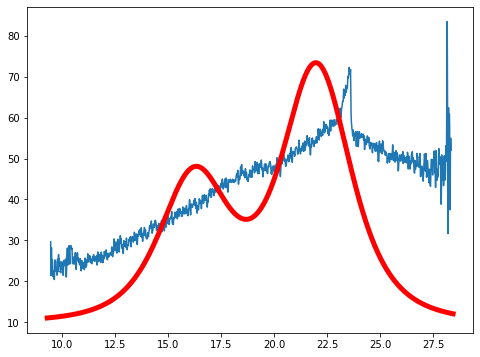

In [ ]:
i = 1
x = Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0]
y = Int_1D_results['Run ' + str(Runs[i])]['Quad1'][1]
valid = ~(np.isnan(x)|np.isnan(y))
popt, pcov = curve_fit(twolorenfit, x[valid],y[valid], p0, bounds = Bounds)
print(popt)
plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0],Int_1D_results['Run ' +str(Runs[i])]['Quad1' ][1])
plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0], twolorenfit(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0], *popt),color = 'r',linewidth = 5)
plt.show()

In [ ]:
#                  B,    a0,    x0,    sigma0,    a1,    x1, sigma1
p0 =     np.array([6,    20,    16,        1,     10,    21,     2])
B_low =  np.array([0,    0,     10,         0,    0,     15,     0])
B_high = np.array([10,    50,    19,         3,    10,    22,     3])
Bounds = (B_low,B_high)

[10.         11.67783289 16.41521176  3.         10.         22.
  3.        ]


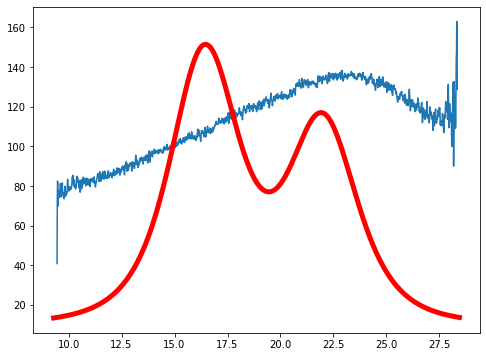

In [ ]:
i = 2
x = Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0]
y = Int_1D_results['Run ' + str(Runs[i])]['Quad1'][1]
valid = ~(np.isnan(x)|np.isnan(y))
popt, pcov = curve_fit(twolorenfit, x[valid],y[valid], p0, bounds = Bounds)
print(popt)
plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0],Int_1D_results['Run ' +str(Runs[i])]['Quad1' ][1])
plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0], twolorenfit(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0], *popt),color = 'r',linewidth = 5)
plt.show()

In [ ]:
# #                  B,    a0,    x0,    sigma0,    a1,    x1, sigma1,    a1,    x1, sigma1
# p0 =     np.array([6,    20,    15,        1,     10,    21,     2,     2,     18,     10])
# B_low =  np.array([0,    0,     10,        0,      0,    15,     0,     0,     15,     0])
# B_high = np.array([10,    50,    20,       3,     10,    22,     3,    10,     25,     20])
# Bounds = (B_low,B_high)

## Three gaussian fit

In [ ]:
# # #                  B,    a0,    x0,    sigma0,    a1,    x1, sigma1,    a1,    x1, sigma1
# p0 =     np.array([15,    55,    11.5,        1,     60,    19,   0.5,    2,     18,    10])
# B_low =  np.array([0,     0,     11.5,        0,      0,    18,     0,     0,     15,     0])
# B_high = np.array([50,    80,    18,        2,       70,    21,     1,    10,     25,     20])
# Bounds = (B_High,B_high)

 #                 B,    a0,    x0,    sigma0,   a1,    x1, sigma1,    a1,    x1, sigma1
# p0 =     np.array([6,     20,    20,      1,     15,    26,     2,     2,     11,     10])
# B_low =  np.array([0,     0,     20,      0,     0,     20,     0,     0,     10,     0])
# B_high = np.array([10,    50,    25,      3,     20,    30,     3,    10,     20,     20])
# Bounds = (B_low,B_high)

In [ ]:
 #                 B,    a0,    x0,    sigma0,   a1,    x1, sigma1,    a1,    x1,  sigma1
p0 =     np.array([7,     20,    17,      2,     15,    21,     2,     20,     29,     9])
B_low =  np.array([5,     0,     16,      0,     0,     19,     0,     0,      20,     0])
B_high = np.array([10,    50,    25,      5,     20,    30,     5,     50,     32,     20])
Bounds = (B_low,B_high)

In [ ]:
 #                 B,    a0,    x0,    sigma0,   a1,    x1, sigma1,    a2,    x2,  sigma2   a3,   x3,  sigma3
# p0 =     np.array([10,    20,    29,      9,     15,    45,     3,     20,     55,     9,   30,   47,   1])
# B_low =  np.array([5,     0,     20,      0,     0,     40,     0,     0,      40,     0,   10,   47,   0])
# B_high = np.array([20,    80,    32,      20,    20,    60,     10,    50,     70,     20,  50,   51,   3])
# Bounds = (B_low,B_high)

#  #                 B,    a0,    x0,    sigma0,   a1,    x1, sigma1,    a2,    x2,  sigma2   a3,   x3,  sigma3
# p0 =     np.array([50,    20,    29,      9,     15,    60,     10,    20,     55,     9])#,   30,   47,   1])
# B_low =  np.array([30,     0,     22,      0,     0,     40,     0,     0,      40,     0])#,   10,   47,   0])
# B_high = np.array([60,    100,    32,      10,    20,    70,     30,    50,     70,     20])#,  50,   51,   3])
# Bounds = (B_low,B_high)

                #  B,    a0,    x0,    sigma0,   a1,    x1, sigma1,    a2,    x2,  sigma2
p0 =     np.array([10,    20,    17,        1,     15,    20,     2,     10,     27,     2])
B_low =  np.array([9.5,    0,    12,        0,     0,     18,     0,     0,      25,     0])
B_high = np.array([25,    50,    20,        5,     20,    22.5,   5,     50,     35,    20])
Bounds = (B_low,B_high)




[ 9.50000001 18.31610508 16.77972007  1.64602226 16.59888303 22.16088212
  1.78678687 30.92312363 25.         11.86309811]
[6.61316046 0.5937989  0.02419932 0.03600819 0.95210387 0.02639554
 0.06767426 6.12583684 0.87509925 2.57539048]


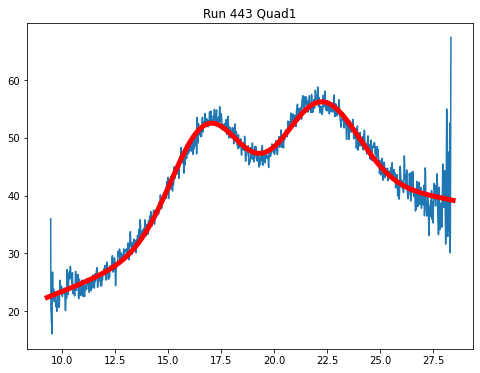

In [ ]:
#Runs = [140, 141, 144, 147, 150, 153, 158, 161, 164]
i = 0
quad_2_plot = 1
x = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0]
y = Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][1]
# x = x [50:-100]
# y = y [50:-100]
valid = ~(np.isnan(x)|np.isnan(y))
popt, pcov = curve_fit(threegaussfit, x[valid],y[valid], p0, bounds = Bounds)
std_fit = np.sqrt(np.diag(pcov)) #Ahmed gave me this line. Rahul also has the same line he got from Ezio.
print(popt)

#pcov is a fucking jacobian matrix which consists of partial derivative of the gaussian function wrt to all the parameters(variables). Higher slope, higher derivatives. Higher the slope, higher the uncertainity (cos if you change the parameters by a small amount the function is changing a lot). Diagonal p cov are the unique ones? I am not sure, I will need to write down and check but moving on. 


#popt, pcov = curve_fit(fourgaussfit, x[valid],y[valid], p0, bounds = Bounds)

#plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0],Int_1D_results['Run ' +str(Runs[i])]['Quad' + str(quad_2_plot) ][1])
plt.plot(x,y)

plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0], threegaussfit(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0], *popt),color = 'r',linewidth = 5)

#plt.plot(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0], fourgaussfit(Int_1D_results['Run ' + str(Runs[i])]['Quad' + str(quad_2_plot)][0], *popt),color = 'r',linewidth = 5)
#np.savetxt('Run ' + str(Runs[i])+ ' Quad' + str(j), threegaussfit(Int_1D_results['Run ' + str(Runs[i])]['Quad1'][0]), delimiter=",")
plt.title('Run ' +str(Runs[i]) + ' Quad' + str(quad_2_plot))
#plt.ylim(0, 30)
print(std_fit) #error

# chisqr, p_value = chisquare(y[valid], f_exp = threegaussfit(x[valid], *popt ))

# print("Chi-square:", chisqr) #why is it nan?
# print("P-value:", p_value)
plt.show()


# Add the chi square and see what fit gives you the lowest value. Also do lm fit.chop off the end artifacts. 

## lmfit test

In [ ]:
from lmfit import Minimizer, create_params, report_fit
from lmfit.lineshapes import gaussian, lorentzian


def residual(pars, x, data):
    model = (gaussian(x, pars['amp_g'], pars['cen_g'], pars['wid_g']) +
             lorentzian(x, pars['amp_l'], pars['cen_l'], pars['wid_l']))
    return model - data

In [ ]:
np.random.seed(0)
x = np.linspace(0, 20.0, 601)

data = (gaussian(x, 21, 6.1, 1.2) + lorentzian(x, 10, 9.6, 1.3) +
        np.random.normal(scale=0.1, size=x.size))

In [ ]:
pfit = create_params(amp_g=10, cen_g=5, wid_g=1, amp_l=10,
                     peak_split=dict(value=2.5, min=0, max=5),
                     cen_l=dict(expr='peak_split+cen_g'),
                     wid_l=dict(expr='wid_g'))

mini = Minimizer(residual, pfit, fcn_args=(x, data))
out = mini.leastsq()
best_fit = data + out.residual

In [ ]:
report_fit(out.params)

[[Variables]]
    amp_g:       21.2722842 +/- 0.05138772 (0.24%) (init = 10)
    cen_g:       6.10496396 +/- 0.00334613 (0.05%) (init = 5)
    wid_g:       1.21434954 +/- 0.00327317 (0.27%) (init = 1)
    amp_l:       9.46504173 +/- 0.05445415 (0.58%) (init = 10)
    peak_split:  3.52163544 +/- 0.01004618 (0.29%) (init = 2.5)
    cen_l:       9.62659935 +/- 0.01066172 (0.11%) == 'peak_split+cen_g'
    wid_l:       1.21434954 +/- 0.00327317 (0.27%) == 'wid_g'
[[Correlations]] (unreported correlations are < 0.100)
    C(amp_g, wid_g)      = +0.6199
    C(amp_g, peak_split) = +0.3796
    C(wid_g, peak_split) = +0.3445
    C(amp_g, amp_l)      = -0.2951
    C(cen_g, amp_l)      = -0.2761
    C(amp_g, cen_g)      = +0.1936
    C(wid_g, amp_l)      = -0.1651
    C(cen_g, wid_g)      = +0.1546


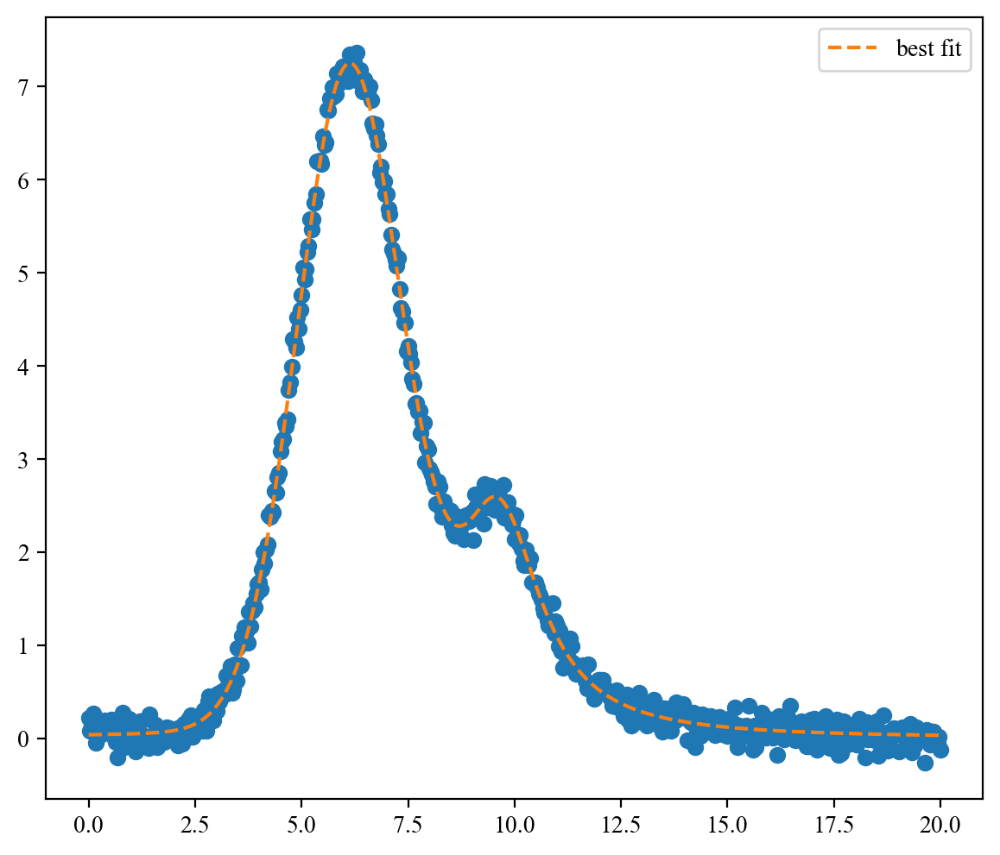

In [ ]:
plt.plot(x, data, 'o')
plt.plot(x, best_fit, '--', label='best fit')
plt.legend()
plt.show()

In [ ]:
i =3
run_num = Runs[i]
p0, Bounds = mfc.get_fit_guess(Full_fit_bounds_params, run_num, 4)
print(p0, Bounds)

[-0.18 20.   50.   15.    2.   10.   21.    2.   30.   32.    5.   10.
 60.   20.  ] (array([-3,  0, 30, 10,  0,  0, 18,  0, 10, 28,  3,  0, 55, 10]), array([  0.,  50., 100.,  18.,   5.,  50.,  23.,  10.,  50.,  35.,  10.,
        30.,  68.,  50.]))


In [ ]:
p0[0]

-0.18

In [ ]:
def residual(pars, x, data):
    model = ( pars['m']*x + pars['B']+ gaussian(x, pars['a0'], pars['x0'], pars['sigma0']) +gaussian(x, pars['a1'], pars['x1'], pars['sigma1'])+gaussian(x, pars['a2'], pars['x2'], pars['sigma2'])+gaussian(x, pars['a3'], pars['x3'], pars['sigma3']))
            
    return model - data  #pars['m']*x + pars['B']+

In [ ]:
def getguess(fitgb, run_no):
    guess=fitgb.loc[fitgb['Run No']==run_no]
    pfit = create_params( m=p0[0], B=p0[1], a0=p0[2], x0=p0[3], signma0=p0[4],a1=p0[5], x1=p0[6], signma1=p0[7],a2=p0[8], x2=p0[9], signma2=p0[10],a3=p0[11], x3=p0[12], signma3=p0[13]) #



In [ ]:
# getguess(Full_fit_bounds_params , 147)

In [ ]:
mini = Minimizer(residual, pfit, fcn_args=(x[valid], y[valid]))
out = mini.leastsq()
best_fit = data + out.residual

report_fit(out.params)

KeyError: 'a0'